In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time
import os
import re
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
%matplotlib inline

In [2]:
# import files
df_inp = pd.read_pickle("./hospiedata/input_clean.pkl")
df_out = pd.read_pickle("./hospiedata/outcome_clean.pkl")

In [3]:
df_inp.head()

,N/A,Unnamed: 0_x,IDANAMNESI_INF,IDEHR,Author_Name,Author_ID,TimeStamp_Insert,IDAccess,EHRType,PatientID,IDDigitalSignDocument,Non_Rilevabile_x,Note_Non_Rilevabile_x,nutritional,cognitivo_percettivo,sonno_riposo,perc_salute,elimination,Perception,rapporti_fam,persone_vicine,Caregiver,Religion,Note_Elim_urinaria,Unnamed: 0_y,IDANAMNESI_MED,Non_Rilevabile_y,Note_Non_Rilevabile_y,opt_consapevolezza,diagnosis,Unnamed: 0_x.1,IDANAMNESI_SOCIALE,Patient,FamigliaAltro,Paziente_T,FamigliaAltro_T,Non_Rilevabile_x.1,Note_Non_Rilevabile_x.1,opt_Problemi,Note_I,ds_note_timori,chk_contr_sintomi,chk_competenza,opt_paziente_a,opt_famiglia_a,opt_adeguatezza,ds_note_ad,opt_paziente_solo,ds_note_con,opt_presente_assente,Presenza_minori,Caregiver_principale,opt_capacita,ds_familiari_coinv,opt_necessario,opt_presente,opt_risorse_ec,opt_paziente_psi,opt_Ins_vol,ds_note_prio,opt_paziente_ad,opt_caregiver_ad,opt_esenzione,opt_inv_civile,invalidita_perc,ds_codice_es,Needs,Domestic partnership,Fragility,opt_disponibilita_f,opt_indennita_acc,opt_legge,opt_famiglia_psi,opt_disponibilit_paz,Unnamed: 0_x.2,IDDIAGNOSI_CROSSOU,Non_Rilevabile_x.2,ds_ICD,dt_Data_diagnosi,Unnamed: 0_y.1,IDDIAGNOSI_ICD,Non_Rilevabile_y.1,Note_Non_Rilevabile_y.1,I_ICD,II_ICD,III_ICD,IV_ICD,V_ICD,VI_ICD,I_Anno,II_Anno,III_Anno,IV_Anno,They go,I_Mese
0,0,7.0,3.0,1030,ROJAS H. NOELIA I.,RJSNSB81E57Z611R,2015-01-15 13:45:43.950,N/A,EHR,96,3362,0.0,NR,NaN,0,NaN,0;3,NaN,0,0,N/A,Barbara Daughter,0,N/A,N/A,N/A,N/A,N/A,NaN,N/A,N/A,N/A,NaN,NaN,NaN,NaN,N/A,N/A,NaN,N/A,N/A,NaN,NaN,NaN,NaN,NaN,N/A,NaN,N/A,NaN,NaN,N/A,NaN,N/A,NaN,NaN,NaN,NaN,NaN,N/A,NaN,NaN,NaN,NaN,N/A,N/A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,NaN,NaN,NaN,NaN,NaN,NaN
1,1,8.0,4.0,1034,MANENTI ELENA,MNNLNE78E63A794M,2015-01-15 14:46:30.080,N/A,EHR,100,3379,0.0,NR,NaN,NaN,0,1;2,NaN,0;4,0,N/A,wife Concetta,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,13.0,6.0,1037,DE OLD ROSELLA,DVCRLL64B64F205S,2015-01-19 12:31:16.060,NaN,EHR,103,5265,0.0,NR,NaN,0,0,0,NaN,0;12,0,N/A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,14.0,7.0,1260,ESPINOZA C. JULIO C.,SPNJCS71M24Z611L,2015-01-19 12:32:21.630,41,AMB,101,5268,0.0,NR,NaN,0,NaN,3;4,NaN,0;4,0,N/A,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,15.0,8.0,44,ESPINOZA C. JULIO C.,SPNJCS71M24Z611L,2015-01-19 13:13:54.630,45,AMB,15,5317,0.0,NR,NaN,NaN,0;1,0;1;3;4,NaN,1;12,0,N/A,Husband: Mahmoud,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
df_out.head()

,IDDecesso,IDEHR,Author_Name,Author_ID,TimeStamp_Insert,IDAccess,EHRType,PatientID,IDDigitalSignDocument,Not detectable,Note_Non_Rilevabile,Date,Now,Luogo_decesso,Note,coupling,IDPAI_VIDAS,opt_problem,opt_obiettivo,ds_note,opt_stato_problema,opt_interventi
0,1.0,4,Lonati Jade Carla,LNTGCR68S56F205H,2015-01-10 14:33:33,NaN,EHR,59,1243,0.0,NR,2015-01-09 16:15:00,16:15:00,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2.0,1022,Lonati Jade Carla,LNTGCR68S56F205H,2015-01-11 08:57:13,NaN,EHR,90,1379,0.0,NR,2015-01-11 00:15:00,00:15:00,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3.0,16,Visconti Giovanna,VSCGNN70T70F205E,2015-01-15 09:05:32,NaN,EHR,71,3124,0.0,NR,2015-01-15 01:45:00,01:45:00,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4.0,1025,Visconti Giovanna,VSCGNN70T70F205E,2015-01-15 09:08:39,NaN,EHR,91,3125,0.0,NR,2015-01-15 06:44:00,06:44:00,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5.0,6,Calamida Fabrizio,CLMFRZ71S19F205R,2015-01-20 15:23:36,NaN,EHR,61,5897,0.0,NR,2015-01-20 14:50:00,14:50:00,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
df_inp.columns

Index([' N/A', 'Unnamed: 0_x', 'IDANAMNESI_INF', 'IDEHR', 'Author_Name',
       'Author_ID', 'TimeStamp_Insert', 'IDAccess', 'EHRType', 'PatientID',
       'IDDigitalSignDocument', 'Non_Rilevabile_x', 'Note_Non_Rilevabile_x',
       'nutritional', 'cognitivo_percettivo', 'sonno_riposo', 'perc_salute',
       'elimination', 'Perception', 'rapporti_fam', 'persone_vicine',
       'Caregiver', 'Religion', 'Note_Elim_urinaria', 'Unnamed: 0_y',
       'IDANAMNESI_MED', 'Non_Rilevabile_y', 'Note_Non_Rilevabile_y',
       'opt_consapevolezza', 'diagnosis', 'Unnamed: 0_x.1',
       'IDANAMNESI_SOCIALE', 'Patient', 'FamigliaAltro', 'Paziente_T',
       'FamigliaAltro_T', 'Non_Rilevabile_x.1', 'Note_Non_Rilevabile_x.1',
       'opt_Problemi', 'Note_I', 'ds_note_timori', 'chk_contr_sintomi',
       'chk_competenza', 'opt_paziente_a', 'opt_famiglia_a', 'opt_adeguatezza',
       'ds_note_ad', 'opt_paziente_solo', 'ds_note_con',
       'opt_presente_assente', 'Presenza_minori', 'Caregiver_principale'

In [6]:
df_inp.opt_consapevolezza.value_counts()

2    636
1    392
3    324
5    305
7    190
6     81
4     21
Name: opt_consapevolezza, dtype: int64

In [7]:
# get patient ids and idehrs for each category of prognosis awareness
a = df_inp.loc[:, ['IDEHR', 'opt_consapevolezza']]
a = a.dropna().reset_index().drop(['index'], axis=1)

In [8]:
a.head()

,IDEHR,opt_consapevolezza
0,1025,1
1,1027,5
2,1036,3
3,1260,5
4,1260,5


In [9]:
df_ht = pd.read_pickle('./hospiedata/hospice_therapy_clean.pkl')

In [10]:
df_ht.head()

,PatientID,IDBac,IDEHR,Age,Sex,StartOfHospitalization,EndOfHospitalization,Diagnosis,TypeOfTherapy,DrugCode,ActiveIngredient,TypeOfUsage,Dose,MaxDose,Frequency,Duration
0,1,0,1,65.0,1,2014-01-02,NaT,psychological,when needed,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,4,3,2550,80.0,0,NaT,NaT,prostate,when needed,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,7,6,1262,70.0,0,2015-06-24,2015-06-29,lung,when needed,6979037,scopolamine butylbromide,sc,20 mg,3.0,0.0,5.0
3,7,6,1262,70.0,0,2015-06-24,2015-06-29,lung,when needed,6979037,scopolamine butylbromide,sc,20 mg,3.0,0.0,5.0
4,7,6,1262,70.0,0,2015-06-24,2015-06-29,lung,when needed,6979037,scopolamine butylbromide,sc,20 mg,3.0,0.0,5.0


In [11]:
b = df_ht.loc[:, ['IDEHR', 'Age', 'Sex']]
b = b.dropna().drop_duplicates().reset_index().drop(['index'], axis=1)

In [12]:
df_prog = pd.merge(a, b, on=['IDEHR']).dropna().drop_duplicates().reset_index().drop(['index'], axis=1)
df_prog.head()

,IDEHR,opt_consapevolezza,Age,Sex
0,1025,1,86.0,1
1,1027,5,86.0,1
2,1036,3,73.0,1
3,1260,5,84.0,0
4,1040,2,79.0,0


In [13]:
df_prog.shape

(495, 4)

In [14]:
# rename the awareness factors
df_prog.loc[df_prog['Sex'] == 0, 'Sex'] = 'F'
df_prog.loc[df_prog['Sex'] == 1, 'Sex'] = 'M'
df_prog.loc[df_prog['opt_consapevolezza'] == '1', 'opt_consapevolezza'] = 'Awareness of diagnosis but no prognosis'
df_prog.loc[df_prog['opt_consapevolezza'] == '2', 'opt_consapevolezza'] = 'Total absence of awareness'
df_prog.loc[df_prog['opt_consapevolezza'] == '3', 'opt_consapevolezza'] = 'Awareness of diagnosis and prognosis overestimation'
df_prog.loc[df_prog['opt_consapevolezza'] == '4', 'opt_consapevolezza'] = 'Full awareness'
df_prog.loc[df_prog['opt_consapevolezza'] == '5', 'opt_consapevolezza'] = 'Elements of evaluation present'
df_prog.loc[df_prog['opt_consapevolezza'] == '6', 'opt_consapevolezza'] = 'Awareness uncertain despite topic emerged'
df_prog.loc[df_prog['opt_consapevolezza'] == '7', 'opt_consapevolezza'] = 'Awareness of terminality but not diagnosis'

In [15]:
df_prog.head()

,IDEHR,opt_consapevolezza,Age,Sex
0,1025,Awareness of diagnosis but no prognosis,86.0,M
1,1027,Elements of evaluation present,86.0,M
2,1036,Awareness of diagnosis and prognosis overestim...,73.0,M
3,1260,Elements of evaluation present,84.0,F
4,1040,Total absence of awareness,79.0,F


In [16]:
# get the most frequent entry per idehr
# df_temp = df_pain[['idehr', 'PatientID', 'pain_relief']]
# df_temp = df_temp.groupby(['PatientID', 'pain_relief']).size().reset_index(name='num_obs')
# df_temp = df_temp.sort_values(by=['PatientID', 'num_obs'], ascending=[True, False]).groupby('PatientID').first().reset_index()
# c = df_prog
# c = c.groupby(['IDEHR', 'opt_consapevolezza']).size().reset_index(name='num_obs')
# c = c.sort_values(by=['IDEHR', 'num_obs'], ascending=[True, False]).groupby('IDEHR').first().reset_index()
# c.shape

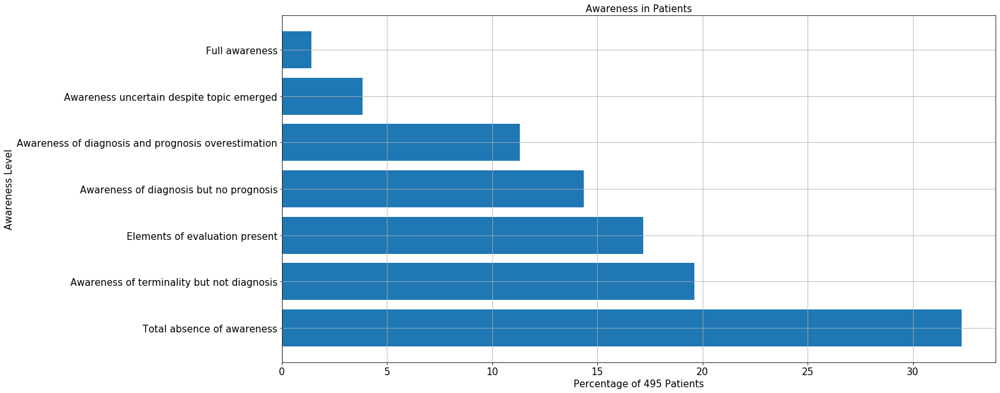

In [25]:
# awareness
import matplotlib
def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_width()
        ax.annotate('{}'.format(height),
                    xy=(height, rect.get_y()),
                    xytext=(30, 0),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


plt.rcParams['figure.figsize'] = [20, 10]
matplotlib.rcParams.update({'font.size': 15})
plt.figure()
labels = df_prog['opt_consapevolezza'].value_counts(normalize=True).mul(100).round(2)
plt.barh(labels.index, labels)
plt.ylabel('Awareness Level', fontsize=15)
plt.xlabel('Percentage of 495 Patients', fontsize=15)
plt.title('Awareness in Patients', fontsize=15) # check
plt.grid()
plt.savefig("./graphs/awareness/patient_awareness.png")
plt.show()


<Figure size 1440x720 with 0 Axes>

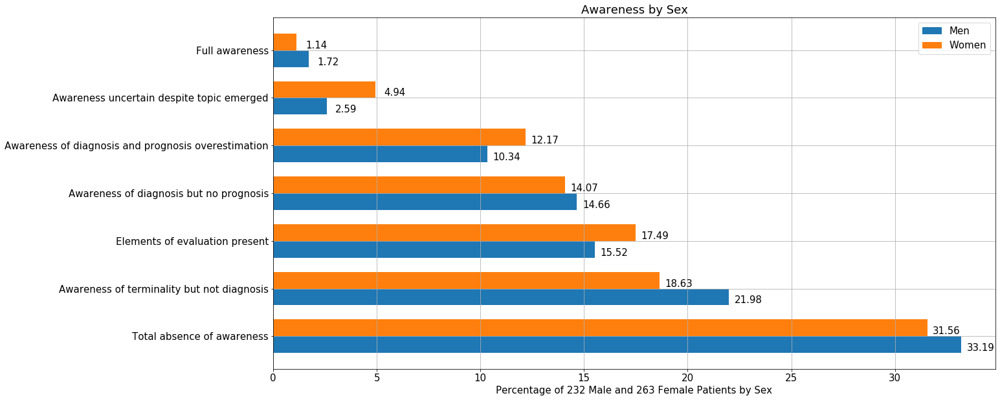

In [26]:
# awareness by sex

plt.rcParams['figure.figsize'] = [20, 10]
matplotlib.rcParams.update({'font.size': 15})
plt.figure()
labels = df_prog['opt_consapevolezza'].value_counts().index
male = df_prog[df_prog['Sex'] == 'M']['opt_consapevolezza'].value_counts(normalize=True).mul(100).round(2)
female = df_prog[df_prog['Sex'] == 'F']['opt_consapevolezza'].value_counts(normalize=True).mul(100).round(2)
x = np.arange(len(labels))
width = 0.35
fig, ax = plt.subplots()
bar1 = ax.barh(x - width/2, male, width, label='Men')
bar2 = ax.barh(x + width/2, female, width, label='Women')
ax.set_xlabel('Percentage of ' + str(len(df_prog[df_prog['Sex'] == 'M'])) + ' Male and ' + str(len(df_prog[df_prog['Sex'] == 'F'])) + ' Female Patients by Sex')
ax.set_title('Awareness by Sex') # check
ax.set_yticks(x)
ax.set_yticklabels(labels)
ax.legend()
autolabel(bar1)
autolabel(bar2)
plt.grid()
plt.savefig("./graphs/awareness/patient_awareness_sex.png")
plt.show()

In [27]:
df_prog[(df_prog['Age'] >= 0) & (df_prog['Age'] < 50)]['opt_consapevolezza'].value_counts().reindex(df_prog['opt_consapevolezza'].unique(), fill_value=0)

Awareness of diagnosis but no prognosis                3
Elements of evaluation present                         5
Awareness of diagnosis and prognosis overestimation    5
Total absence of awareness                             5
Awareness of terminality but not diagnosis             4
Awareness uncertain despite topic emerged              0
Full awareness                                         0
Name: opt_consapevolezza, dtype: int64

<Figure size 1440x1152 with 0 Axes>

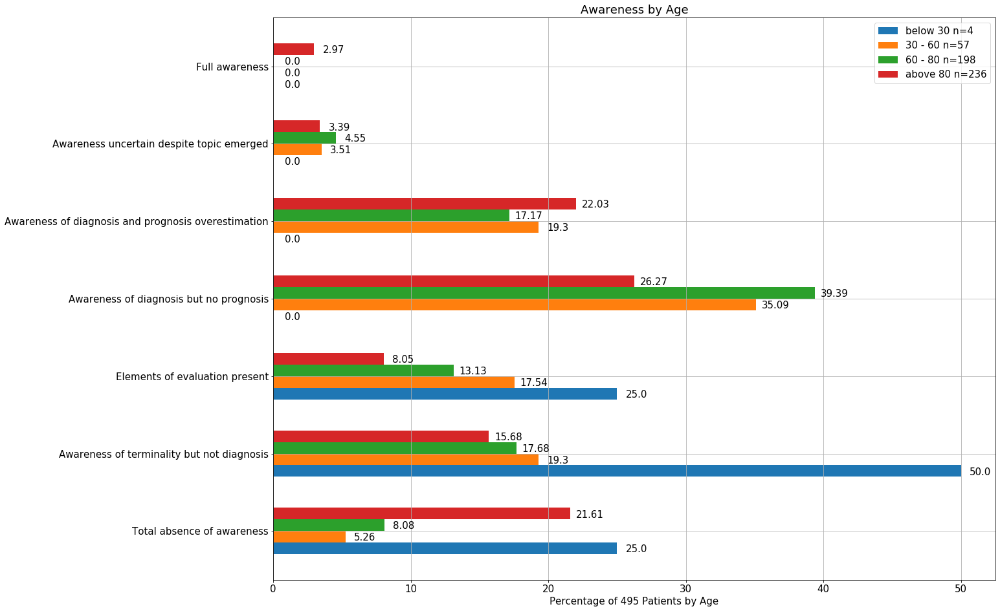

In [31]:
# awareness by age
plt.rcParams['figure.figsize'] = [20, 16]
matplotlib.rcParams.update({'font.size': 15})
plt.figure()
labels = df_prog['opt_consapevolezza'].value_counts().index
young = df_prog[(df_prog['Age'] >= 0) & (df_prog['Age'] < 30)]['opt_consapevolezza'].value_counts(normalize=True).mul(100).round(2).reindex(df_prog['opt_consapevolezza'].unique(), fill_value=0)
adult = df_prog[(df_prog['Age'] >= 30) & (df_prog['Age'] < 60)]['opt_consapevolezza'].value_counts(normalize=True).mul(100).round(2).reindex(df_prog['opt_consapevolezza'].unique(), fill_value=0)
middle = df_prog[(df_prog['Age'] >= 60) & (df_prog['Age'] < 80)]['opt_consapevolezza'].value_counts(normalize=True).mul(100).round(2).reindex(df_prog['opt_consapevolezza'].unique(), fill_value=0)
old = df_prog[(df_prog['Age'] >= 80) & (df_prog['Age'] < 130)]['opt_consapevolezza'].value_counts(normalize=True).mul(100).round(2).reindex(df_prog['opt_consapevolezza'].unique(), fill_value=0)
x = np.arange(len(labels))
width = 0.15
fig, ax = plt.subplots()
bar1 = ax.barh(x - width*1.5, young, width, label='below 30 n=4')
bar2 = ax.barh(x - width/2, adult, width, label='30 - 60 n=57')
bar3 = ax.barh(x + width/2, middle, width, label='60 - 80 n=198')
bar4 = ax.barh(x + width*1.5, old, width, label='above 80 n=236')
ax.set_xlabel('Percentage of 495 Patients by Age')
ax.set_title('Awareness by Age') # check
ax.set_yticks(x)
ax.set_yticklabels(labels)
ax.legend()
autolabel(bar1)
autolabel(bar2)
autolabel(bar3)
autolabel(bar4)
plt.grid()
plt.savefig("./graphs/awareness/patient_awareness_age.png")
plt.show()

In [30]:
# age splits
print(len(df_prog[(df_prog['Age'] >= 0) & (df_prog['Age'] < 30)]))
print(len(df_prog[(df_prog['Age'] >= 30) & (df_prog['Age'] < 60)]))
print(len(df_prog[(df_prog['Age'] >= 60) & (df_prog['Age'] < 80)]))
print(len(df_prog[(df_prog['Age'] >= 80) & (df_prog['Age'] < 130)]))

4
57
198
236


In [60]:
# mention the number of patients and the joins form the tables sourced
# time series information, represent?

In [61]:
# import the pid to cancer mappings
df_ptc = pd.read_csv("./hospiedata/pid_to_attr.csv")
df_obs = pd.read_csv("./hospiedata/obs_table_cleaned_expanded_thresholded.csv")
print(df_ptc.shape)
print(df_obs.shape)
df_ptc.head()

C:\Users\prate\Anaconda3\envs\det2\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning: Columns (4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


(4107, 8)
(312765, 73)


,PatientID,EHR,AMB,Age,Sex,when_needed,standard,Diagnosis
0,96,1.0,1.0,81.0,M,1.0,1.0,Head-neck
1,100,1.0,1.0,65.0,M,1.0,1.0,Diagnosis is not cancer
2,103,1.0,1.0,87.0,F,1.0,1.0,Head-neck
3,101,0.0,1.0,NaN,NaN,NaN,NaN,NaN
4,15,1.0,1.0,40.0,F,1.0,1.0,Stomach


In [62]:
cancers = df_ptc.Diagnosis.unique()
# remove 'psychological' since there are only 2 patients
cancers = cancers[:-1]
cancers

array(['Head-neck', 'Diagnosis is not cancer', nan, 'Stomach', 'Lung',
       'Pancreas', 'Breast', 'Pleura-peritoneal', 'Colorectal',
       'Liver-biliary', 'Prostate', 'Kidney', 'Brain-snc', 'Bladder',
       'Skin', 'Ovary', 'Myelomas-other myeloproliferative diseases',
       'Leukemia-Lymphoma', 'Bone-soft tissue', 'Other', 'Uterus',
       'not known', 'endocrine glands', 'Esophagus'], dtype=object)

In [63]:
df_obs = df_obs.rename(columns={'patientid': 'PatientID'})
df_obs.columns

Index(['Unnamed: 0', 'idehr', 'timestamp_insert', 'PatientID',
       'opt_hypotrophy', 'opt_anxiety', 'chk_eloquence', 'anorexia',
       'personal_hygiene', 'urine_elimination', 'mobility',
       'hemorrhagic_manifestation', 'speech', 'cough', 'nausea',
       'memory_deficit', 'cognitive_deficit', 'active_diuresis',
       'lack_of_appetite', 'opt_cooperation', 'opt_memory_deficit_type',
       'opt_care_giver', 'chk_gastrointestinal_symptoms', 'chk_bowel_symptoms',
       'opt_dehydration', 'opt_attitude', 'pain_freq', 'pain_relief', 'breath',
       'consolability', 'body_language', 'facial_expression', 'awareness',
       'asthenia', 'cachexia', 'dyspnoea', 'motor_performance', 'body_temp',
       'agitation_behavior_freq', 'diet', 'cognitive_state',
       'feces_elimination', 'consumption_help',
       'chk_ausili_presidi_urinary_catheter',
       'chk_ausili_presidi_bladder_catheter', 'chk_ausili_presidi_absorbency',
       'chk_ausili_presidi_urocondom',
       'chk_ausili_p

Mean. observations:  60.388888888888886
Min. observations:  1
Max. observations:  578
Num. of patients:  36
Std. Dev.:  0.125


<Figure size 1440x720 with 0 Axes>

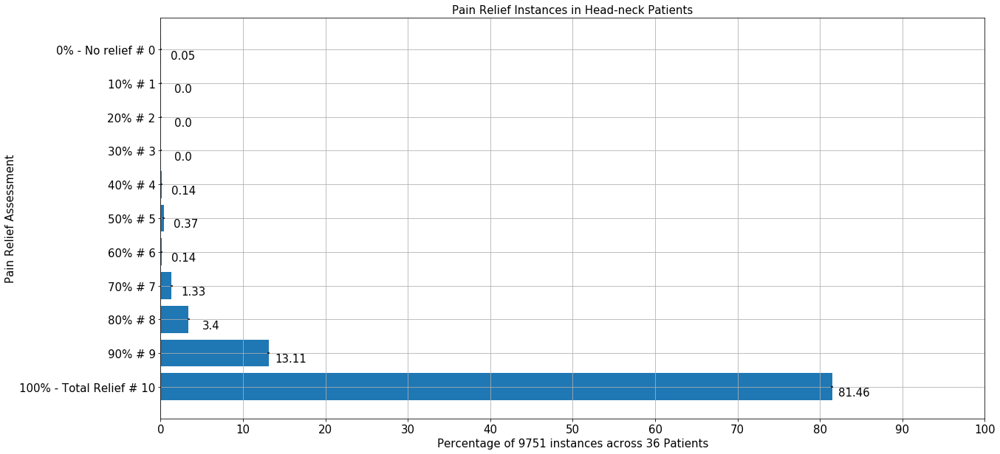

Mean. observations:  25.6
Min. observations:  1
Max. observations:  176
Num. of patients:  35
Std. Dev.:  0.14285714285714285


<Figure size 1440x720 with 0 Axes>

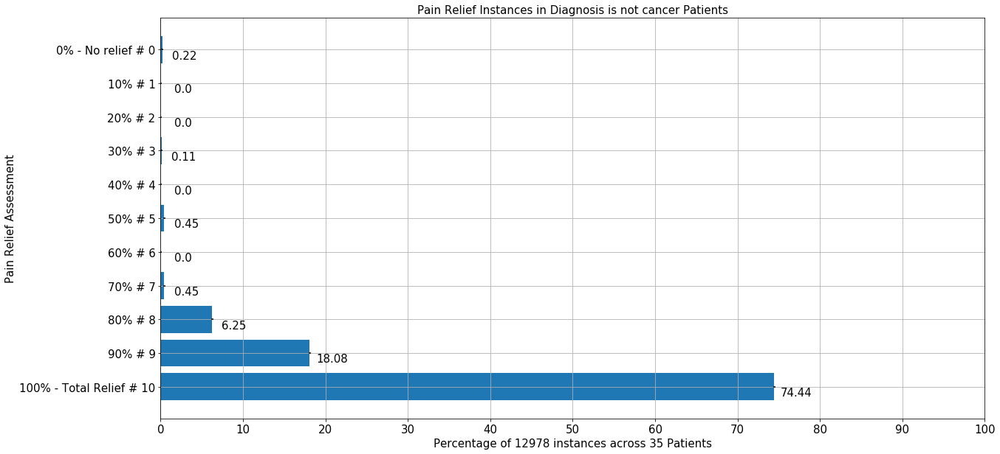

Mean. observations:  45.32608695652174
Min. observations:  1
Max. observations:  191
Num. of patients:  46
Std. Dev.:  0.16666666666666666


<Figure size 1440x720 with 0 Axes>

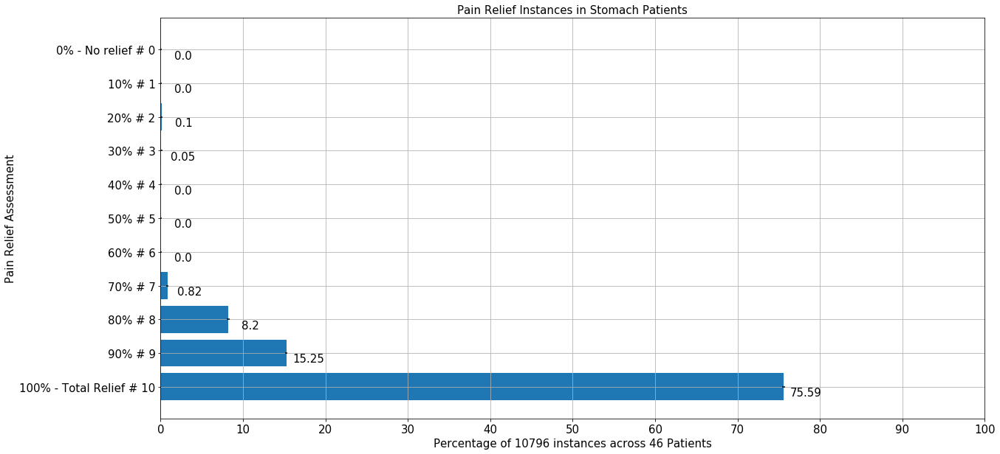

Mean. observations:  39.8421052631579
Min. observations:  1
Max. observations:  612
Num. of patients:  171
Std. Dev.:  0.1111111111111111


<Figure size 1440x720 with 0 Axes>

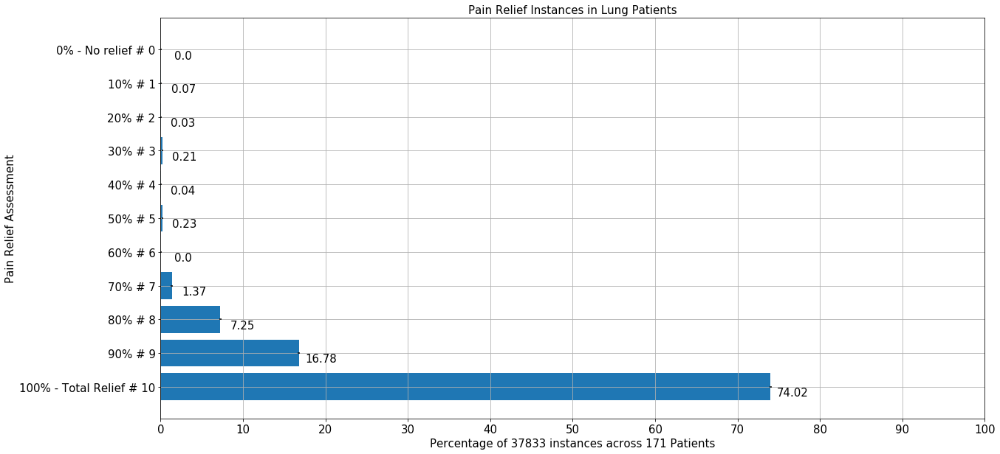

Mean. observations:  40.96774193548387
Min. observations:  1
Max. observations:  281
Num. of patients:  93
Std. Dev.:  0.125


<Figure size 1440x720 with 0 Axes>

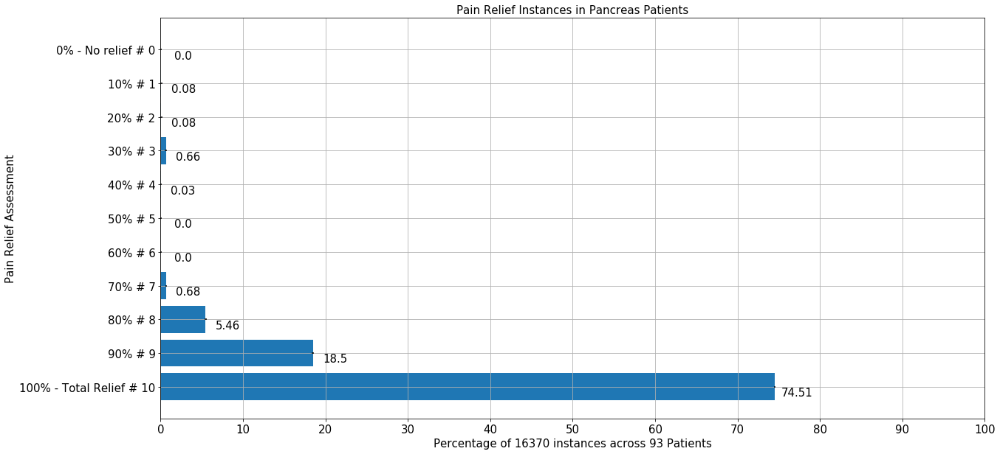

Mean. observations:  52.45454545454545
Min. observations:  1
Max. observations:  446
Num. of patients:  66
Std. Dev.:  0.14285714285714285


<Figure size 1440x720 with 0 Axes>

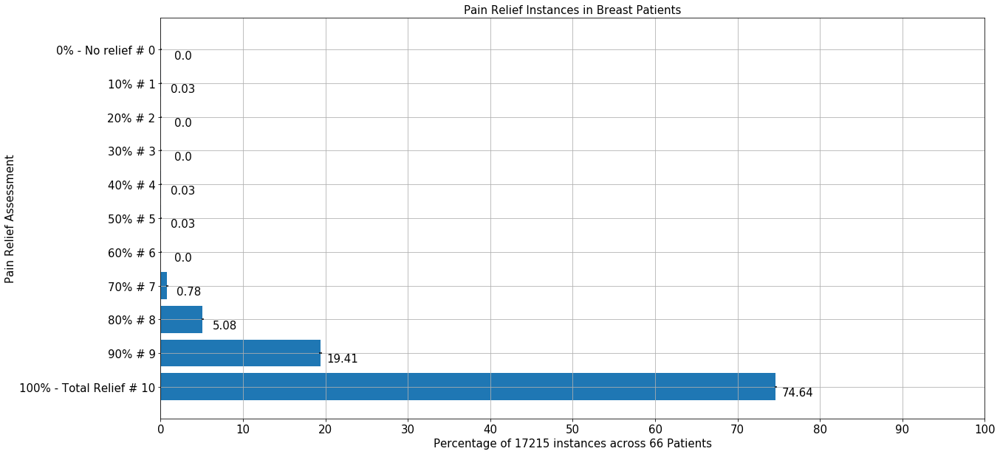

Mean. observations:  41.333333333333336
Min. observations:  1
Max. observations:  179
Num. of patients:  18
Std. Dev.:  0.2


<Figure size 1440x720 with 0 Axes>

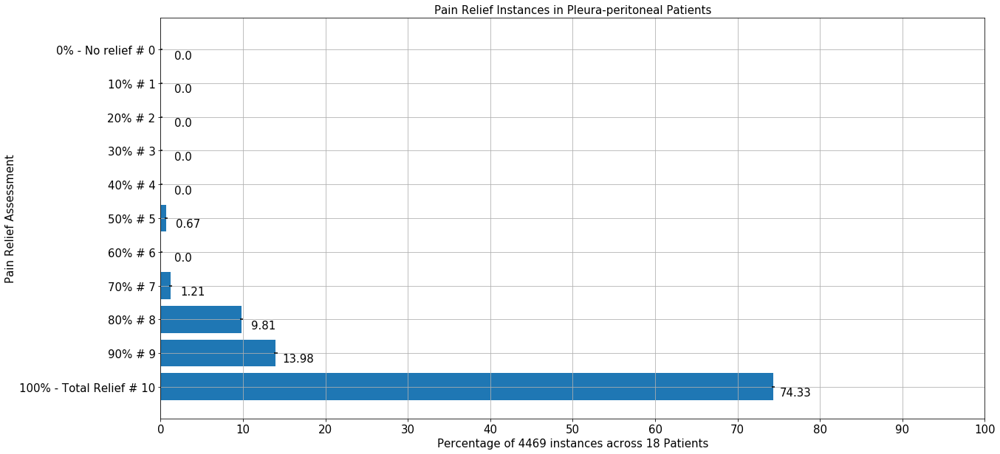

Mean. observations:  53.10891089108911
Min. observations:  1
Max. observations:  381
Num. of patients:  101
Std. Dev.:  0.1111111111111111


<Figure size 1440x720 with 0 Axes>

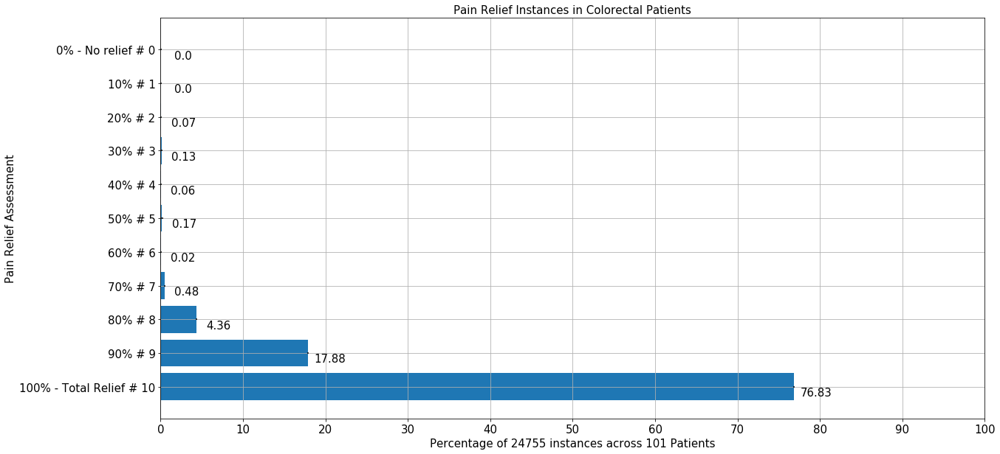

Mean. observations:  37.0
Min. observations:  1
Max. observations:  240
Num. of patients:  63
Std. Dev.:  0.16666666666666666


<Figure size 1440x720 with 0 Axes>

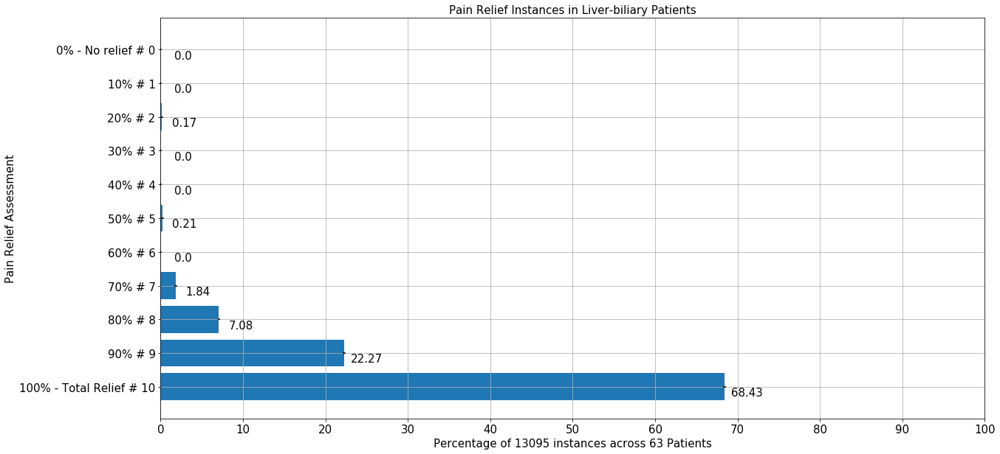

Mean. observations:  83.3030303030303
Min. observations:  1
Max. observations:  519
Num. of patients:  33
Std. Dev.:  0.16666666666666666


<Figure size 1440x720 with 0 Axes>

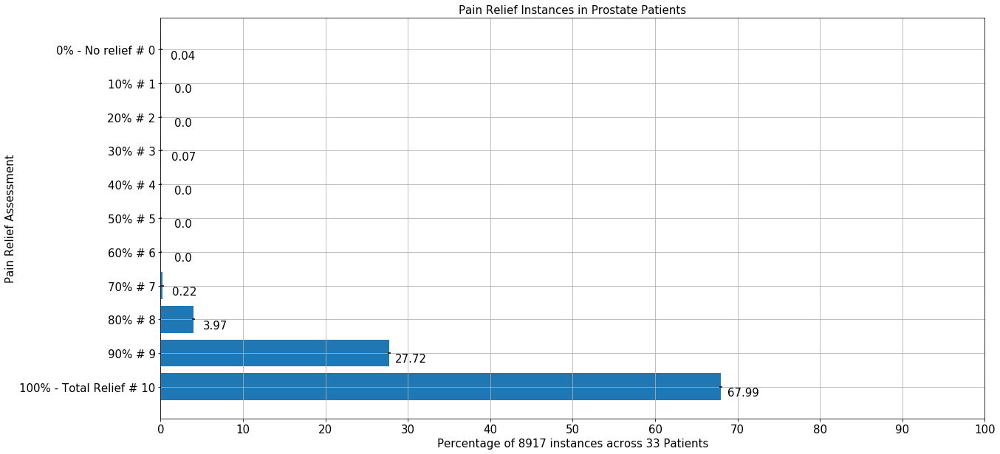

Mean. observations:  66.57894736842105
Min. observations:  1
Max. observations:  354
Num. of patients:  19
Std. Dev.:  0.14285714285714285


<Figure size 1440x720 with 0 Axes>

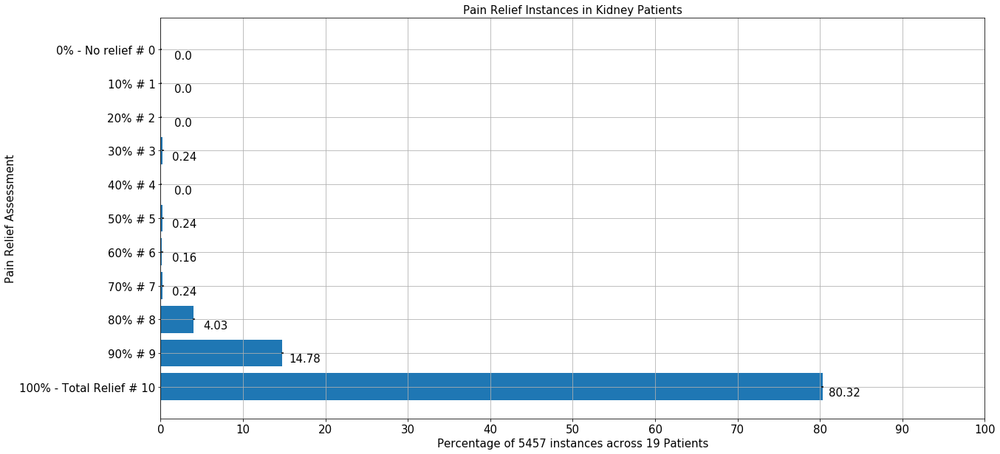

Mean. observations:  29.666666666666668
Min. observations:  1
Max. observations:  152
Num. of patients:  33
Std. Dev.:  0.16666666666666666


<Figure size 1440x720 with 0 Axes>

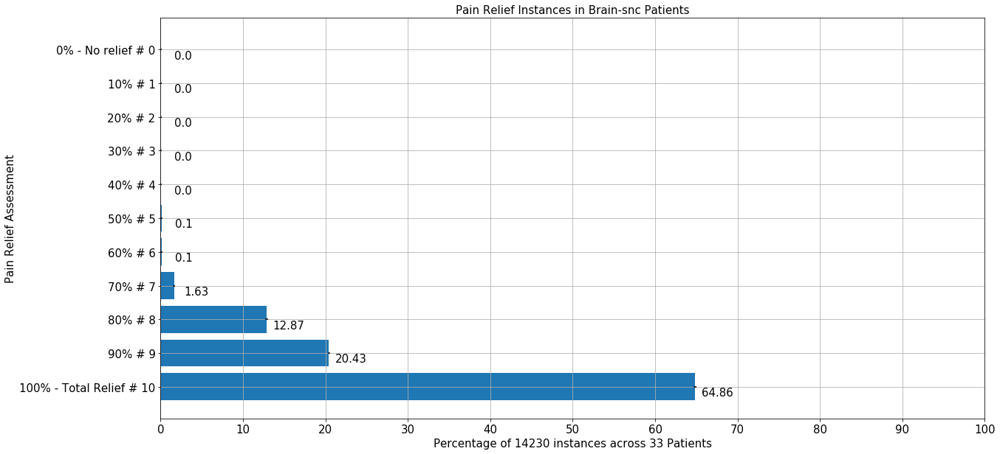

Mean. observations:  57.666666666666664
Min. observations:  1
Max. observations:  449
Num. of patients:  33
Std. Dev.:  0.14285714285714285


<Figure size 1440x720 with 0 Axes>

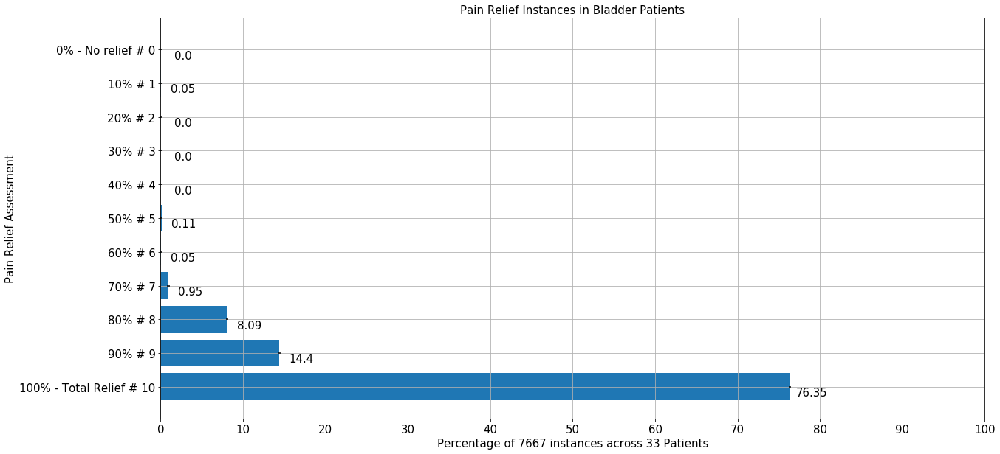

Mean. observations:  51.11764705882353
Min. observations:  3
Max. observations:  362
Num. of patients:  17
Std. Dev.:  0.16666666666666666


<Figure size 1440x720 with 0 Axes>

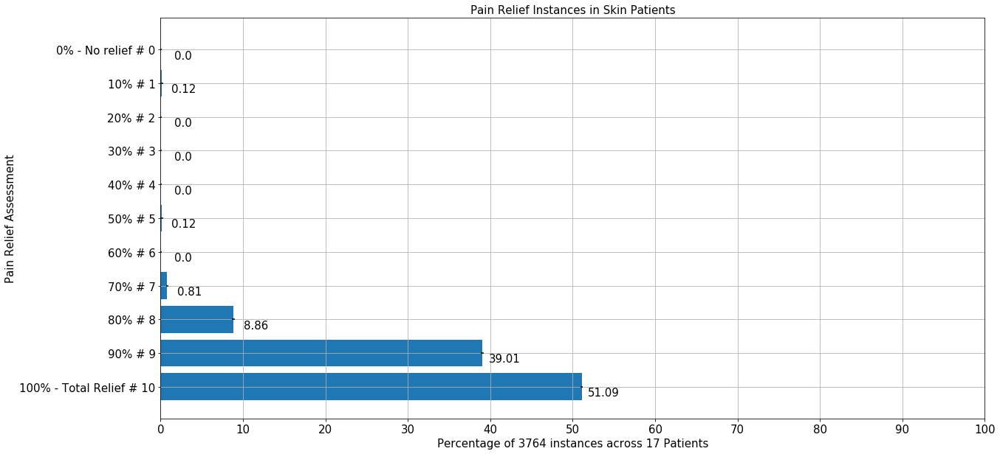

Mean. observations:  68.9047619047619
Min. observations:  1
Max. observations:  241
Num. of patients:  21
Std. Dev.:  0.14285714285714285


<Figure size 1440x720 with 0 Axes>

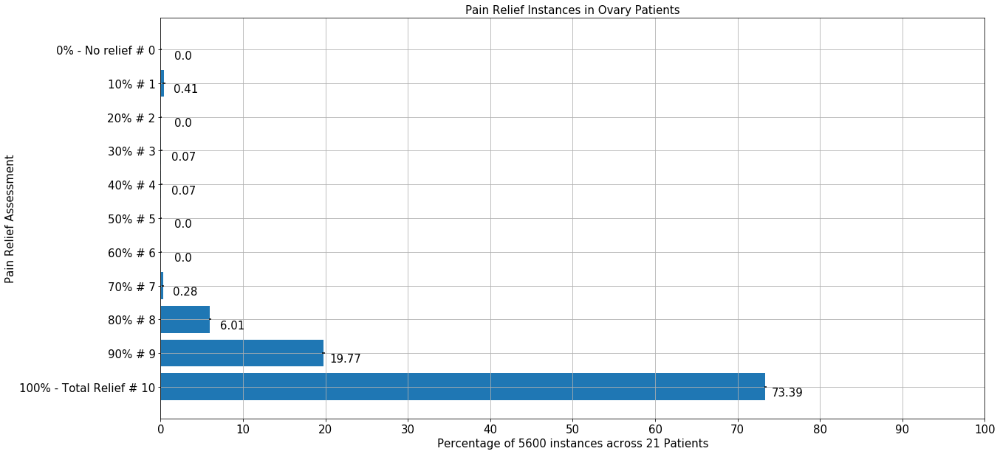

Mean. observations:  25.125
Min. observations:  10
Max. observations:  43
Num. of patients:  8
Std. Dev.:  0.3333333333333333


<Figure size 1440x720 with 0 Axes>

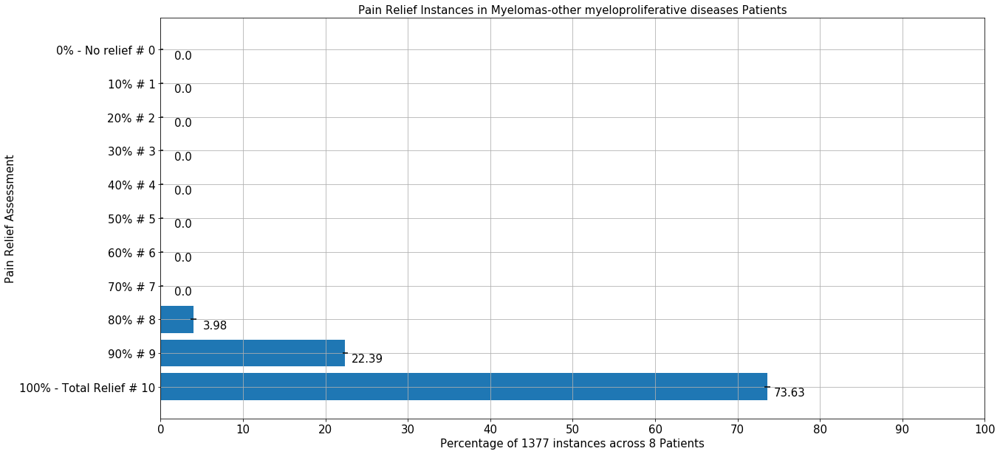

Mean. observations:  49.958333333333336
Min. observations:  2
Max. observations:  291
Num. of patients:  24
Std. Dev.:  0.1111111111111111


<Figure size 1440x720 with 0 Axes>

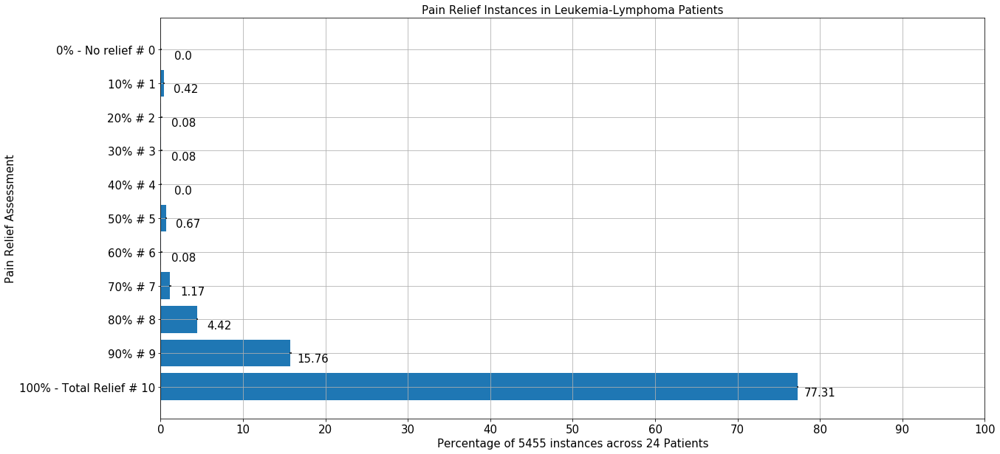

Mean. observations:  74.1
Min. observations:  10
Max. observations:  239
Num. of patients:  10
Std. Dev.:  0.2


<Figure size 1440x720 with 0 Axes>

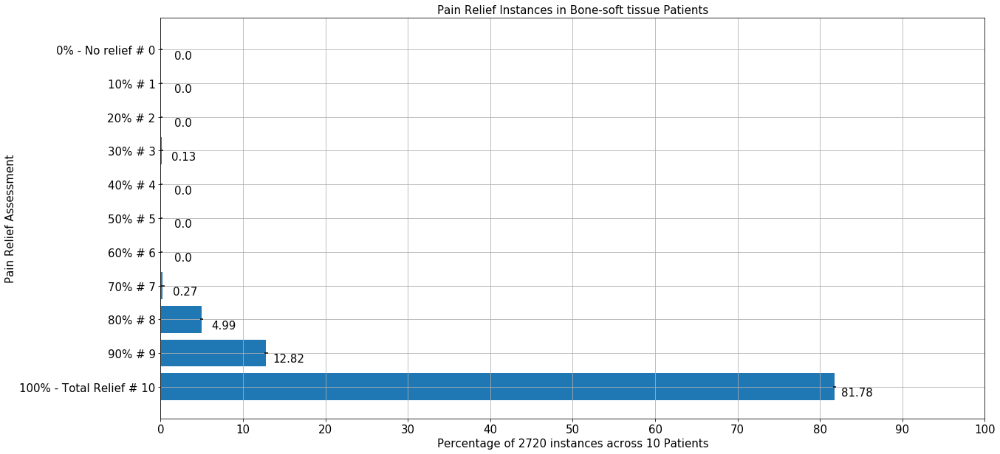

Mean. observations:  102.42857142857143
Min. observations:  4
Max. observations:  589
Num. of patients:  7
Std. Dev.:  0.25


<Figure size 1440x720 with 0 Axes>

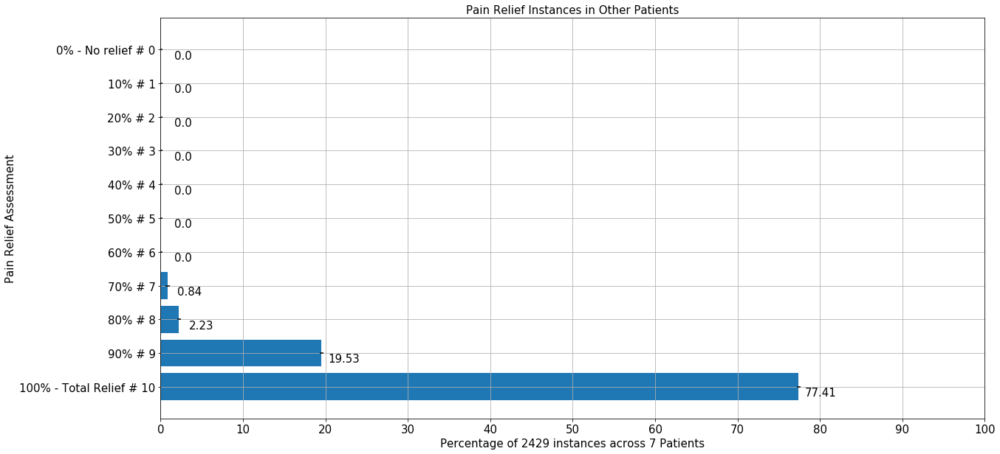

Mean. observations:  61.25
Min. observations:  1
Max. observations:  381
Num. of patients:  20
Std. Dev.:  0.125


<Figure size 1440x720 with 0 Axes>

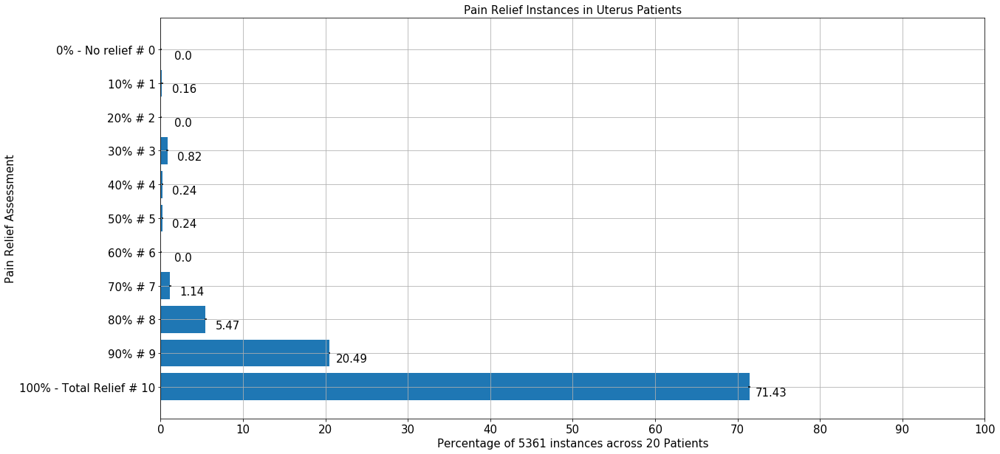

Mean. observations:  38.07692307692308
Min. observations:  1
Max. observations:  150
Num. of patients:  13
Std. Dev.:  0.2


<Figure size 1440x720 with 0 Axes>

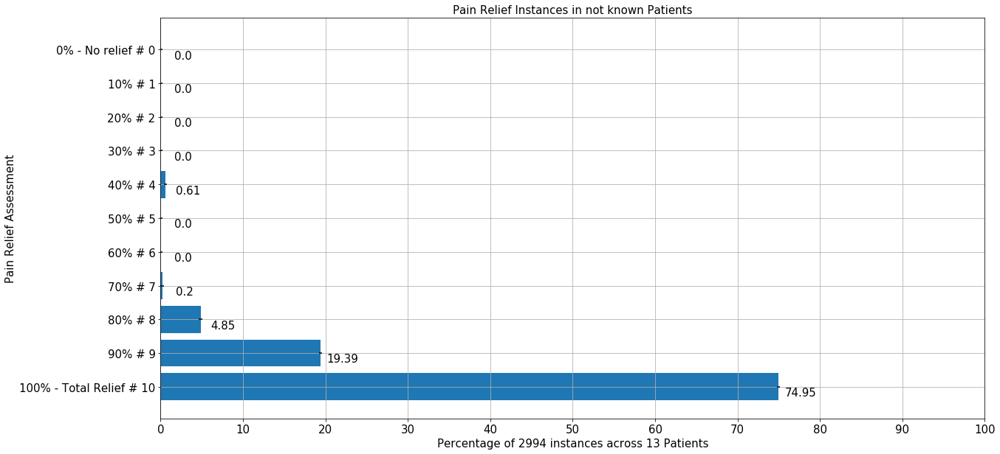

Mean. observations:  42.8
Min. observations:  8
Max. observations:  110
Num. of patients:  5
Std. Dev.:  0.16666666666666663


<Figure size 1440x720 with 0 Axes>

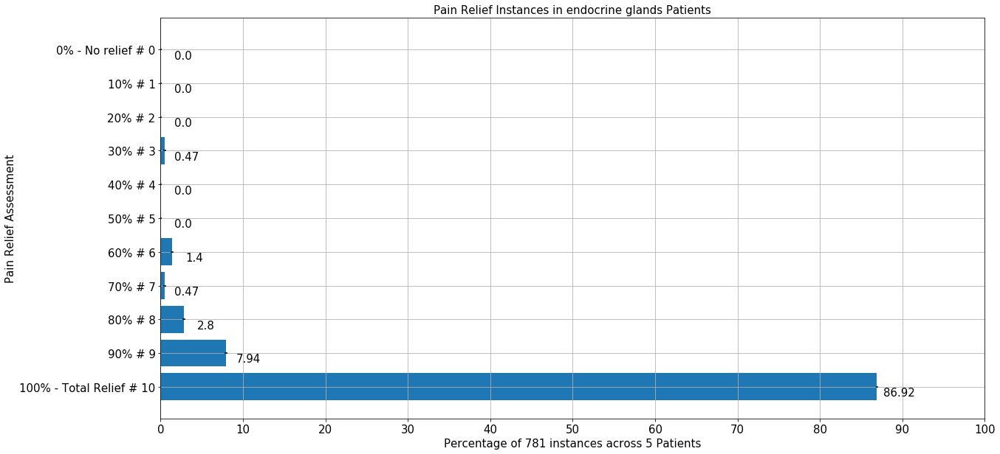

Mean. observations:  36.0
Min. observations:  1
Max. observations:  98
Num. of patients:  7
Std. Dev.:  0.25


<Figure size 1440x720 with 0 Axes>

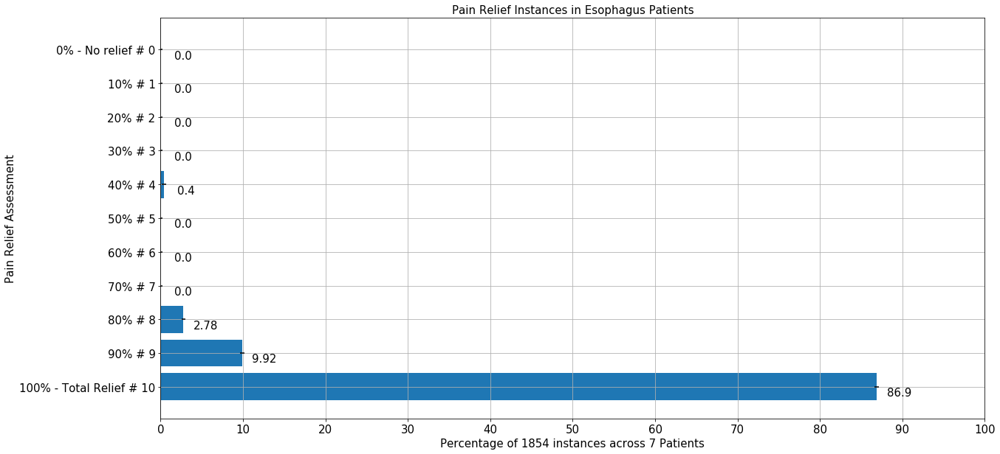

In [23]:
for cancer in cancers:
    if isinstance(cancer, np.float):
        continue
    df_pid = df_ptc[df_ptc['Diagnosis'] == cancer].PatientID
    df_pid = df_pid.reset_index().drop(['index'], axis=1)
    df_pain = df_obs.merge(df_pid, on=['PatientID'], how='inner')
    plt.rcParams['figure.figsize'] = [20, 10]
    matplotlib.rcParams.update({'font.size': 15})
    plt.figure()
    fig, ax = plt.subplots()
    labels = df_pain['pain_relief'].value_counts(normalize=True).mul(100).round(2).reindex(df_obs['pain_relief'].dropna().unique(), fill_value=0)
    label_errors = df_pain['pain_relief'].value_counts(normalize=True).mean()
    df_temp = df_pain[['PatientID', 'pain_relief']]
    df_temp = df_temp.dropna()
    print("Mean. observations: ", df_temp.PatientID.value_counts().mean())
    print("Min. observations: ", df_temp.PatientID.value_counts().min())
    print("Max. observations: ", df_temp.PatientID.value_counts().max())
    print("Num. of patients: ", len(df_temp.PatientID.unique()))
    print("Std. Dev.: ", label_errors)
    
    plt.xlim(0, 100)
    plt.xticks(np.linspace(0, 100, 11))
    bar1 = ax.barh(pd.Index(['100% - Total Relief # 10', '90% # 9', '80% # 8', '70% # 7', '60% # 6',
           '50% # 5', '40% # 4', '30% # 3', '20% # 2', '10% # 1', '0% - No relief # 0'], dtype='object'), labels, xerr=label_errors)
    ax.set_ylabel('Pain Relief Assessment', fontsize=15)
    ax.set_xlabel('Percentage of ' + str(df_pain.shape[0]) + ' instances across ' + str(len(df_temp.PatientID.unique())) + ' Patients', fontsize=15)
    ax.set_title('Pain Relief Instances in ' + cancer + ' Patients', fontsize=15)
    autolabel(bar1)
    plt.grid()
    plt.show()

In [24]:
# START OF PROTOTYPE

In [25]:
df_pid = df_ptc[df_ptc['Diagnosis'] == 'Colorectal'].PatientID
df_pid = df_pid.reset_index().drop(['index'], axis=1)
print(df_pid.shape)
df_pid.head()

(172, 1)


,PatientID
0,112
1,67
2,220
3,165
4,289


In [26]:
df_pain = df_obs.merge(df_pid, on=['PatientID'], how='inner')
print(df_pain.shape)
df_pain.head()

(24755, 73)


,Unnamed: 0,idehr,timestamp_insert,PatientID,opt_hypotrophy,opt_anxiety,chk_eloquence,anorexia,personal_hygiene,urine_elimination,mobility,hemorrhagic_manifestation,speech,cough,nausea,memory_deficit,cognitive_deficit,active_diuresis,lack_of_appetite,opt_cooperation,opt_memory_deficit_type,opt_care_giver,chk_gastrointestinal_symptoms,chk_bowel_symptoms,opt_dehydration,opt_attitude,pain_freq,pain_relief,breath,consolability,body_language,facial_expression,awareness,asthenia,cachexia,dyspnoea,motor_performance,body_temp,agitation_behavior_freq,diet,cognitive_state,feces_elimination,consumption_help,chk_ausili_presidi_urinary_catheter,chk_ausili_presidi_bladder_catheter,chk_ausili_presidi_absorbency,chk_ausili_presidi_urocondom,chk_ausili_presidi_disposable_sleepers,mood_fear,mood_despair,mood_sadness,mood_helplessness,mood_denial,mood_hopelessness,mood_sense_of_helplessness,mood_negation,mood_sense_of_solitude,mood_senso_dimpotenza,mood_desperation,mood_sense_of_impotence,mood_apathy,mood_hostility,mood_loneliness,mood_closure_in_itself,mood_sense_of_powerlessness,mood_serenity,mood_sense_of_loneliness,mood_demoralisation,mood_happiness,mood_irritability,mood_disappointment,mood_rage,mood_anger
0,2,16,2015-01-12 11:40:00.510,71,Hypotrophy # 0,NaN,confabulation # 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Severe # 3,NaN,NaN,NaN,Apyrexia,quiet # 0,NaN,confused at times 0 #,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,3,16,2015-01-12 11:42:15.270,71,Hypotrophy # 0,NaN,confabulation # 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Severe # 3,NaN,NaN,NaN,Apyrexia,quiet # 0,NaN,confused at times 0 #,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,23378,16,2015-01-12 08:39:31.767,71,NaN,NaN,NaN,NaN,With help # 2,With help # 2,With help # 2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20% - Patient with serious impairment of organ...,NaN,NaN,Absent # 4,confused - sometimes # 0,With help # 2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,23402,16,2015-01-12 17:19:34.330,71,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"40% - Patient incapacitated, it requires conti...",NaN,NaN,Homogenized # 2,NaN,NaN,help with # 2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,23403,16,2015-01-12 18:11:26.210,71,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,effective production # 1,NaN,memory deficits # 0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,mild strain # 1,"40% - Patient incapacitated, it requires conti...",NaN,NaN,Homogenized # 2,confused - continuously # 1,NaN,help with # 2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
df_pain.pain_freq.unique()

array([nan, 'Continuous 0 #', 'BTP # 3', 'Daytime # 1', 'Occasional # 4',
       'Continuous # 0; BTP # 3', 'BTP # 3; Occasional # 4', 'Night # 2',
       '# 1 day; the night # 2', 'Continuous # 0, # 1 daytime',
       'Daytime # 1; occasional # 4', 'day # 1, # 3 BTP',
       'Continuous # 0; BTP # 3; Occasional # 4',
       'Night # 2, # 3 BTP; Occasional # 4',
       'Continuous # 0; Occasional # 4'], dtype=object)

In [28]:
df_pain.pain_relief.unique()

array([nan, '100% - Total Relief # 10', '80% # 8', '90% # 9', '70% # 7',
       '60% # 6', '0% - No relief # 0', '40% # 4', '50% # 5', '20% # 2'],
      dtype=object)

<Figure size 1440x720 with 0 Axes>

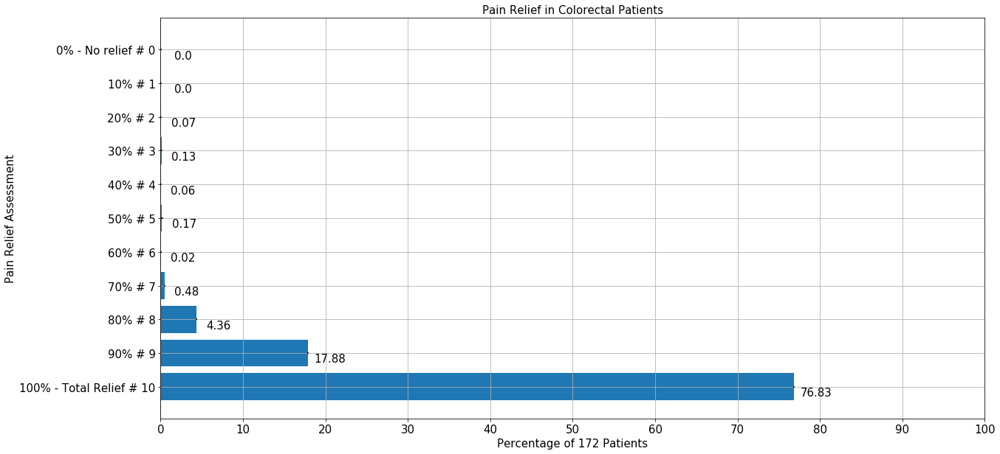

In [29]:
plt.rcParams['figure.figsize'] = [20, 10]
matplotlib.rcParams.update({'font.size': 15})
plt.figure()
fig, ax = plt.subplots()
labels = df_pain['pain_relief'].value_counts(normalize=True).mul(100).round(2).reindex(df_obs['pain_relief'].dropna().unique(), fill_value=0)
label_errors = df_pain['pain_relief'].value_counts(normalize=True).mean()
plt.xlim(0, 100)
plt.xticks(np.linspace(0, 100, 11))
bar1 = ax.barh(pd.Index(['100% - Total Relief # 10', '90% # 9', '80% # 8', '70% # 7', '60% # 6',
       '50% # 5', '40% # 4', '30% # 3', '20% # 2', '10% # 1', '0% - No relief # 0'],
      dtype='object'), labels, xerr=label_errors)
ax.set_ylabel('Pain Relief Assessment', fontsize=15)
ax.set_xlabel('Percentage of ' + str(df_pid.shape[0]) + ' Patients', fontsize=15)
ax.set_title('Pain Relief in Colorectal Patients', fontsize=15)
autolabel(bar1)
plt.grid()
plt.show()

In [30]:
np.sort(df_pain.PatientID.unique())

array([   67,    71,    92,   112,   165,   182,   220,   228,   242,
         273,   282,   289, 20323, 20362, 20368, 20369, 20444, 20459,
       30513, 30574, 30592, 30607, 30626, 30629, 30634, 30781, 30841,
       30848, 30857, 30883, 30898, 30904, 30909, 40991, 41012, 41028,
       41059, 41079, 41093, 41120, 41134, 41155, 41178, 41237, 41242,
       41268, 41302, 41303, 41328, 41343, 41367, 41387, 41392, 41419,
       41454, 41469, 41489, 41525, 41553, 41591, 41637, 41645, 41651,
       41762, 41875, 41902, 41933, 41968, 41982, 41991, 41998, 42021,
       42023, 42051, 42147, 42288, 42290, 42370, 42376, 42387, 42418,
       42419, 42459, 42477, 42488, 42523, 42547, 42610, 42616, 42726,
       42749, 42827, 42850, 42854, 42868, 42893, 42908, 42934, 42986,
       43024, 43028, 43052, 43105, 43106, 43129, 43163, 43171, 43228,
       43289, 43306, 43408, 43419, 43447, 43474, 43484, 43561, 43590,
       43648, 43654, 43668, 43720, 43729, 43757, 43809, 43855, 43931,
       43945, 44016]

In [31]:
np.sort(df_pid.PatientID.unique())

array([   67,    71,    87,    92,   112,   145,   165,   182,   220,
         228,   242,   273,   276,   282,   289, 20323, 20362, 20368,
       20369, 20444, 20459, 30513, 30541, 30574, 30585, 30592, 30598,
       30607, 30626, 30629, 30634, 30637, 30689, 30781, 30823, 30841,
       30848, 30857, 30883, 30898, 30904, 30909, 40991, 41009, 41012,
       41028, 41059, 41079, 41093, 41120, 41134, 41155, 41178, 41186,
       41237, 41242, 41268, 41302, 41303, 41328, 41343, 41367, 41387,
       41392, 41419, 41454, 41469, 41489, 41520, 41525, 41552, 41553,
       41591, 41637, 41645, 41651, 41762, 41875, 41902, 41933, 41968,
       41982, 41991, 41998, 42021, 42023, 42051, 42147, 42288, 42290,
       42359, 42370, 42376, 42387, 42418, 42419, 42459, 42466, 42477,
       42488, 42523, 42547, 42610, 42616, 42726, 42749, 42827, 42850,
       42854, 42868, 42893, 42908, 42934, 42986, 43024, 43028, 43052,
       43105, 43106, 43129, 43143, 43163, 43171, 43228, 43289, 43306,
       43376, 43408,

In [32]:
print(len(np.sort(df_pain.PatientID.unique())))
print(len(np.sort(df_pid.PatientID.unique())))

128
172


In [33]:
df_pain.head()

,Unnamed: 0,idehr,timestamp_insert,PatientID,opt_hypotrophy,opt_anxiety,chk_eloquence,anorexia,personal_hygiene,urine_elimination,mobility,hemorrhagic_manifestation,speech,cough,nausea,memory_deficit,cognitive_deficit,active_diuresis,lack_of_appetite,opt_cooperation,opt_memory_deficit_type,opt_care_giver,chk_gastrointestinal_symptoms,chk_bowel_symptoms,opt_dehydration,opt_attitude,pain_freq,pain_relief,breath,consolability,body_language,facial_expression,awareness,asthenia,cachexia,dyspnoea,motor_performance,body_temp,agitation_behavior_freq,diet,cognitive_state,feces_elimination,consumption_help,chk_ausili_presidi_urinary_catheter,chk_ausili_presidi_bladder_catheter,chk_ausili_presidi_absorbency,chk_ausili_presidi_urocondom,chk_ausili_presidi_disposable_sleepers,mood_fear,mood_despair,mood_sadness,mood_helplessness,mood_denial,mood_hopelessness,mood_sense_of_helplessness,mood_negation,mood_sense_of_solitude,mood_senso_dimpotenza,mood_desperation,mood_sense_of_impotence,mood_apathy,mood_hostility,mood_loneliness,mood_closure_in_itself,mood_sense_of_powerlessness,mood_serenity,mood_sense_of_loneliness,mood_demoralisation,mood_happiness,mood_irritability,mood_disappointment,mood_rage,mood_anger
0,2,16,2015-01-12 11:40:00.510,71,Hypotrophy # 0,NaN,confabulation # 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Severe # 3,NaN,NaN,NaN,Apyrexia,quiet # 0,NaN,confused at times 0 #,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,3,16,2015-01-12 11:42:15.270,71,Hypotrophy # 0,NaN,confabulation # 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Severe # 3,NaN,NaN,NaN,Apyrexia,quiet # 0,NaN,confused at times 0 #,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,23378,16,2015-01-12 08:39:31.767,71,NaN,NaN,NaN,NaN,With help # 2,With help # 2,With help # 2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20% - Patient with serious impairment of organ...,NaN,NaN,Absent # 4,confused - sometimes # 0,With help # 2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,23402,16,2015-01-12 17:19:34.330,71,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"40% - Patient incapacitated, it requires conti...",NaN,NaN,Homogenized # 2,NaN,NaN,help with # 2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,23403,16,2015-01-12 18:11:26.210,71,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,effective production # 1,NaN,memory deficits # 0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,mild strain # 1,"40% - Patient incapacitated, it requires conti...",NaN,NaN,Homogenized # 2,confused - continuously # 1,NaN,help with # 2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [34]:
df_temp = df_pain[['PatientID', 'pain_relief']]
df_temp = df_temp.dropna()
df_temp.PatientID.value_counts().mean()
df_temp.PatientID.value_counts().max()
df_temp.PatientID.value_counts().min()
len(df_temp.PatientID.unique())

101

In [35]:
df_temp.shape

(5364, 2)

In [36]:
df_temp = df_temp.dropna()
df_temp.shape

(5364, 2)

In [37]:
df_temp.PatientID.value_counts().max()

381

In [38]:
df_temp.PatientID.value_counts().min()

1

In [39]:
len(df_temp.PatientID.unique())

101

In [40]:
df_temp.PatientID.value_counts().mean()

53.10891089108911

In [41]:
df_temp[df_temp['PatientID'] == 71]

,PatientID,pain_relief
29,71,100% - Total Relief # 10


In [42]:
labels = df_pain['pain_relief'].value_counts(normalize=True).mul(100).round(2).reindex(df_obs['pain_relief'].dropna().unique(), fill_value=0)
labels

100% - Total Relief # 10    76.83
90% # 9                     17.88
80% # 8                      4.36
70% # 7                      0.48
20% # 2                      0.02
60% # 6                      0.17
0% - No relief # 0           0.06
50% # 5                      0.13
40% # 4                      0.07
30% # 3                      0.00
10% # 1                      0.00
Name: pain_relief, dtype: float64

In [43]:
label_errors = df_pain['pain_relief'].value_counts(normalize=True).mean()
label_errors

0.1111111111111111

In [44]:
# END

In [64]:
df_obs.pain_freq.unique()

array([nan, 'BTP # 3', 'Continuous 0 #', 'Daytime # 1', 'Night # 2',
       'Continuous # 0; BTP # 3', 'day # 1, # 3 BTP', 'Occasional # 4',
       'BTP # 3; Occasional # 4', '# 1 day; the night # 2',
       'Continuous # 0, # 1 daytime', 'Continuous # 0; Occasional # 4',
       'Daytime # 1; occasional # 4', 'Night # 2; Occasional # 4',
       'Continuous # 0, # 1 day; the night # 2',
       '# 1 day; the night # 2, # 4 Occasional',
       'Continuous # 0; Night # 2', 'Night # 2, # 3 BTP',
       'Continuous # 0; BTP # 3; Occasional # 4',
       'day # 1, # 3 BTP; Occasional # 4',
       'Night # 2, # 3 BTP; Occasional # 4'], dtype=object)

In [65]:
df_ptc.AMB.value_counts()

1.0    3499
0.0      97
Name: AMB, dtype: int64

In [66]:
df_ptc.shape

(4107, 8)

In [67]:
df_ptc.EHR.value_counts()

0.0    2555
1.0    1041
Name: EHR, dtype: int64

In [68]:
df_ptc[df_ptc['EHR'] == 1].AMB.value_counts()

1.0    944
0.0     97
Name: AMB, dtype: int64

In [69]:
def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_width()
        ax.annotate('{}'.format(height),
                    xy=(height, rect.get_y()),
                    xytext=(30, 0),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

<Figure size 1440x720 with 0 Axes>

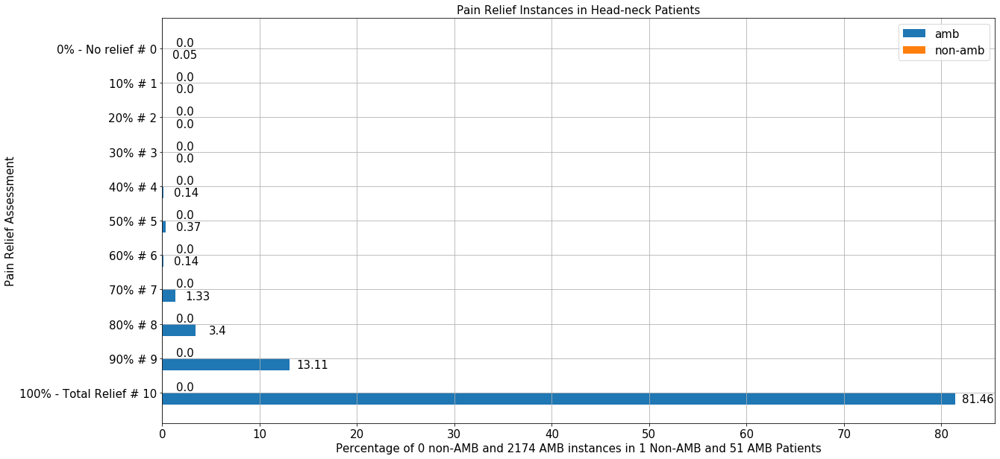

<Figure size 1440x720 with 0 Axes>

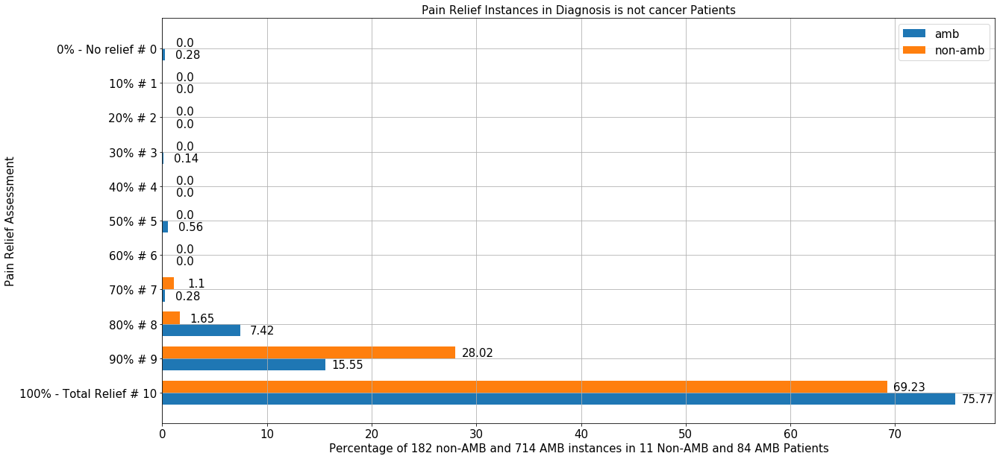

<Figure size 1440x720 with 0 Axes>

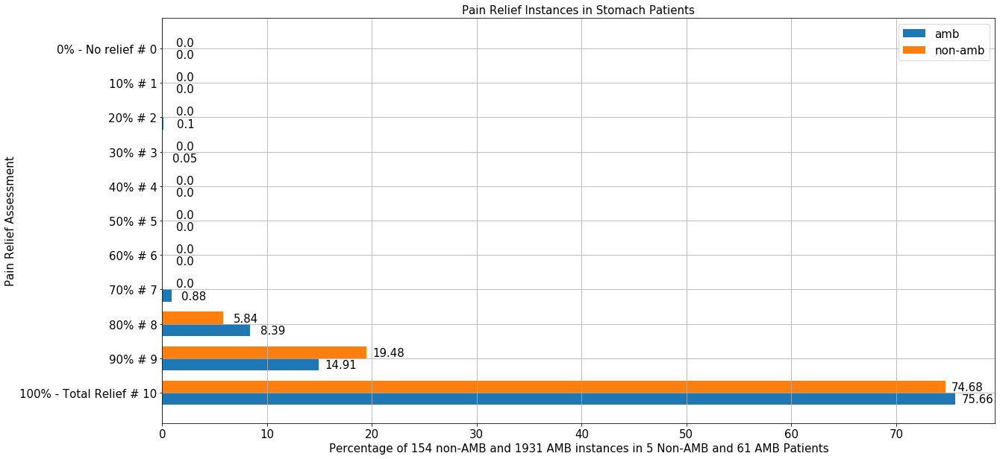

<Figure size 1440x720 with 0 Axes>

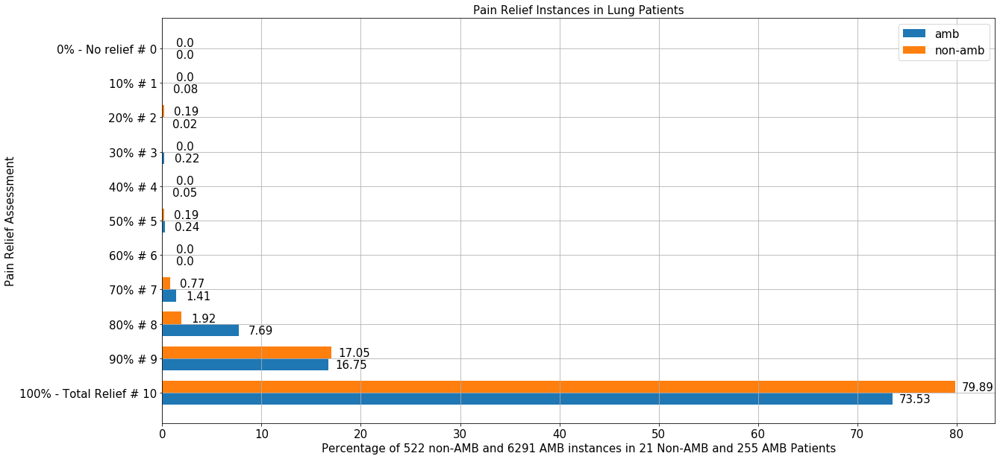

<Figure size 1440x720 with 0 Axes>

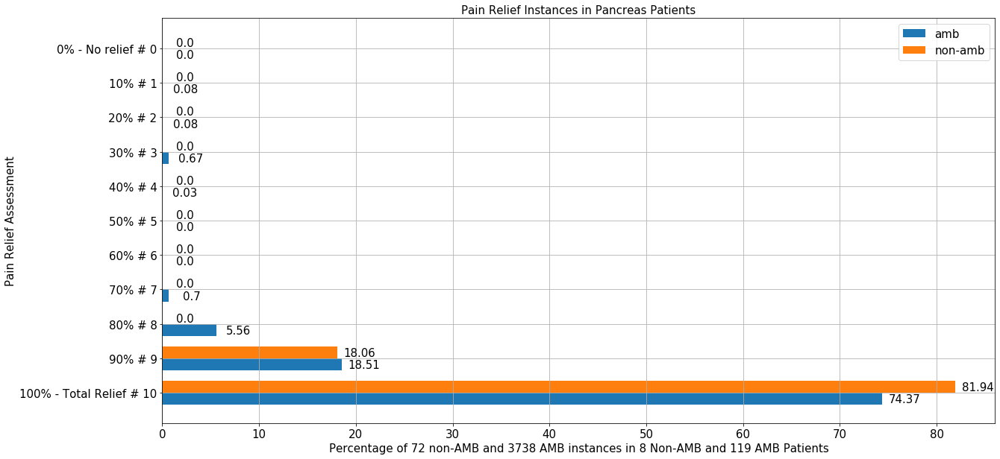

<Figure size 1440x720 with 0 Axes>

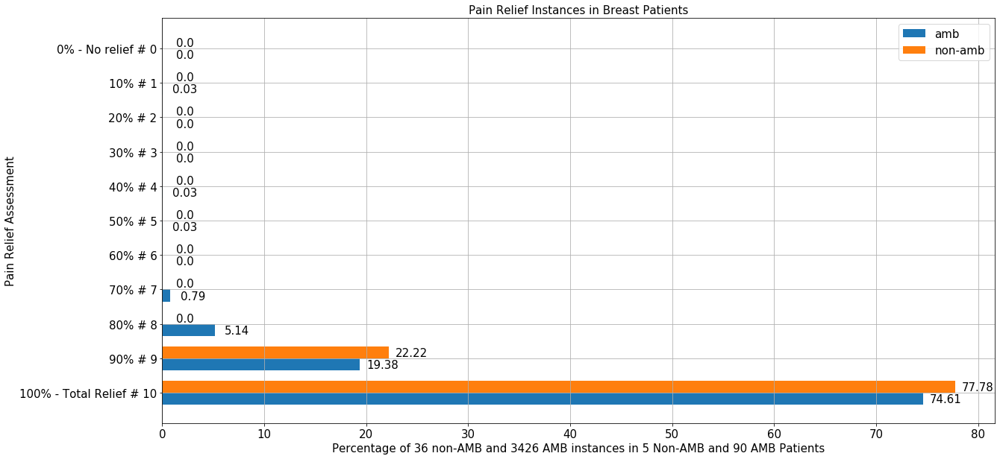

<Figure size 1440x720 with 0 Axes>

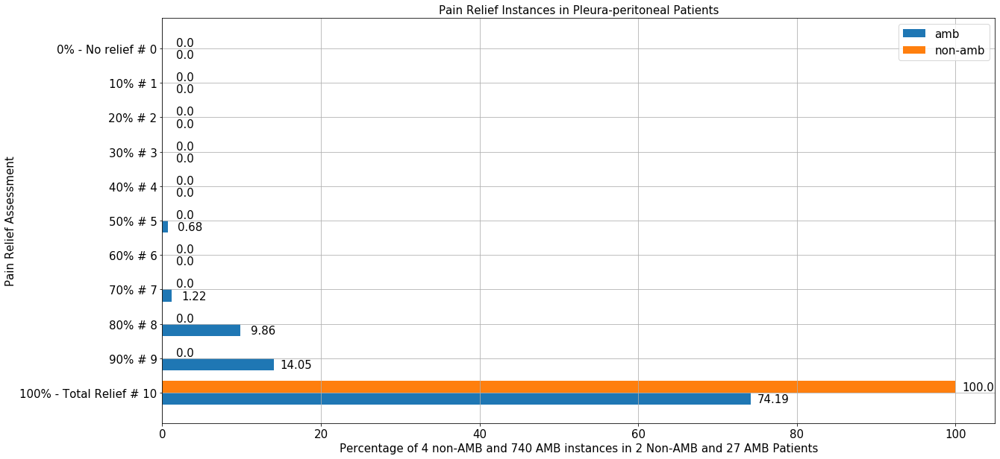

<Figure size 1440x720 with 0 Axes>

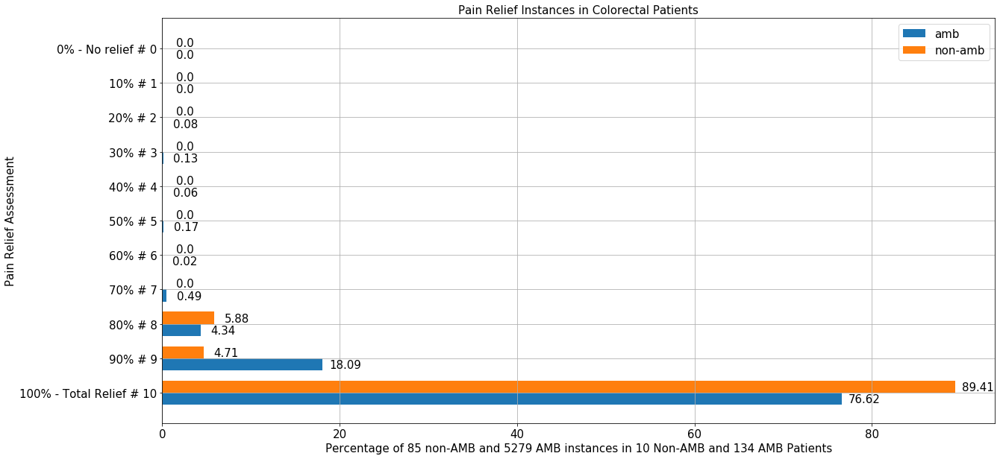

<Figure size 1440x720 with 0 Axes>

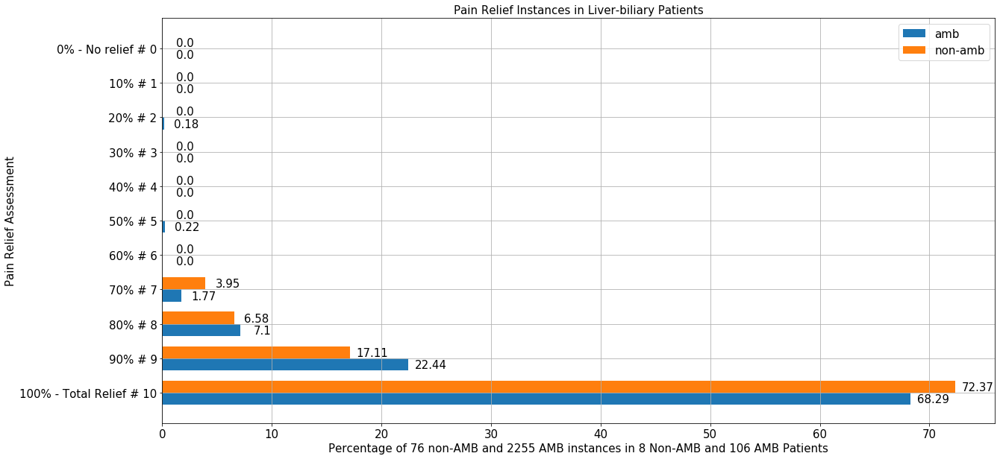

<Figure size 1440x720 with 0 Axes>

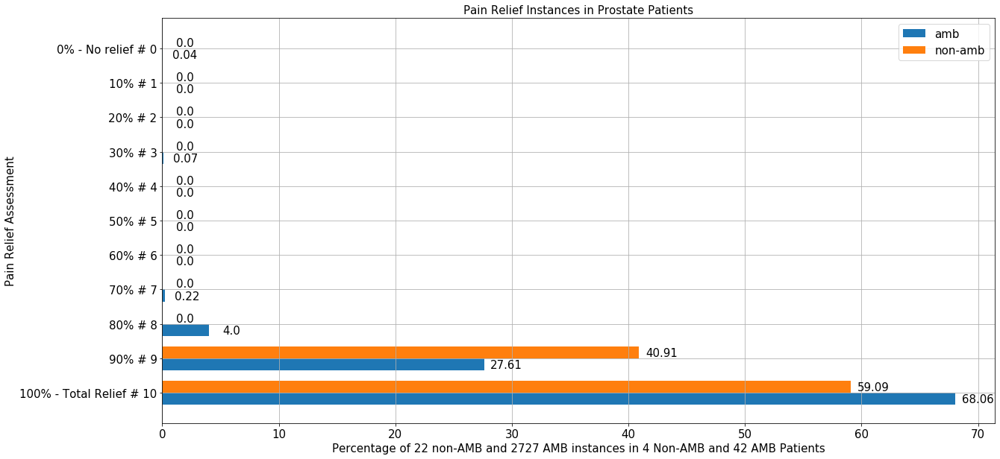

<Figure size 1440x720 with 0 Axes>

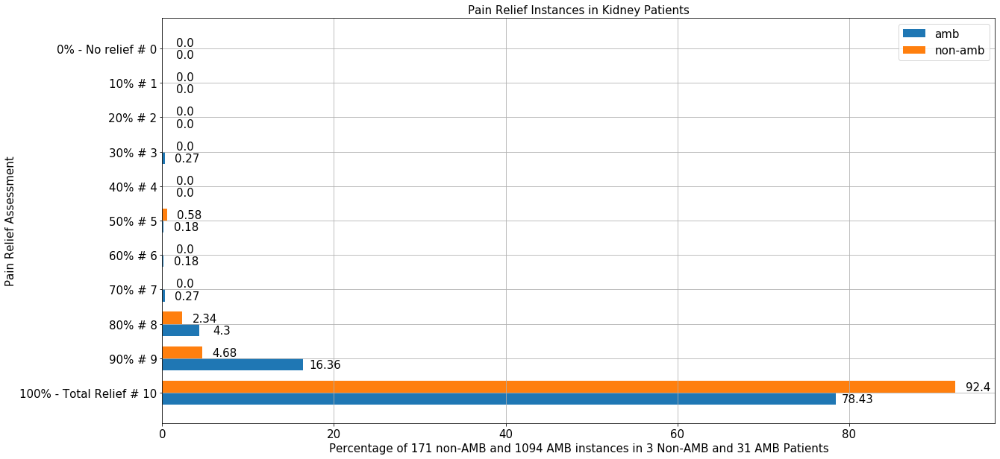

<Figure size 1440x720 with 0 Axes>

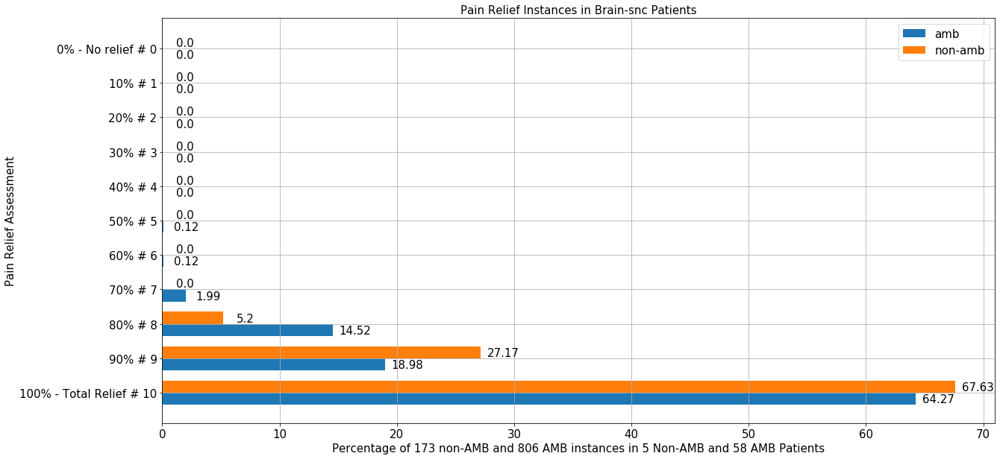

<Figure size 1440x720 with 0 Axes>

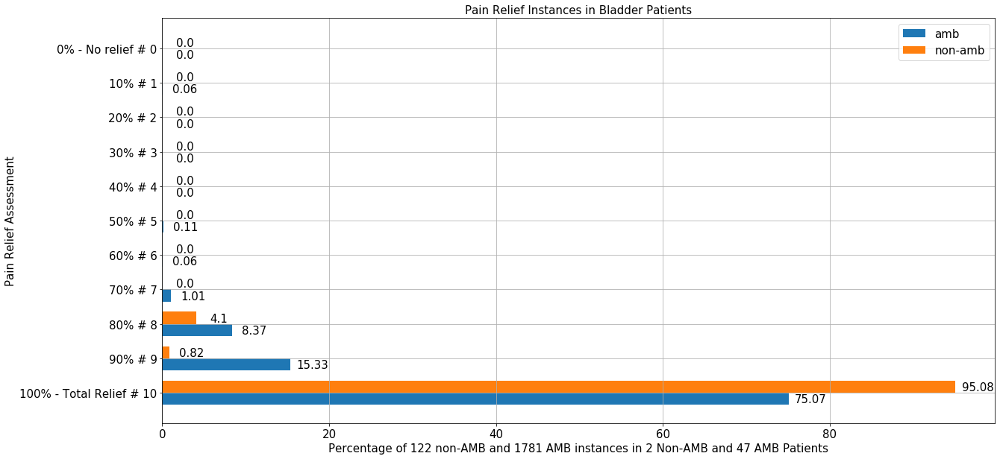

<Figure size 1440x720 with 0 Axes>

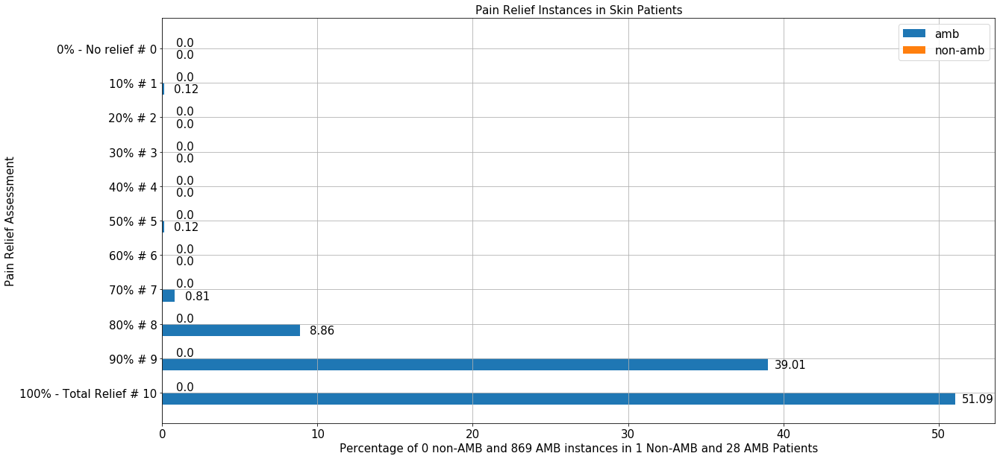

<Figure size 1440x720 with 0 Axes>

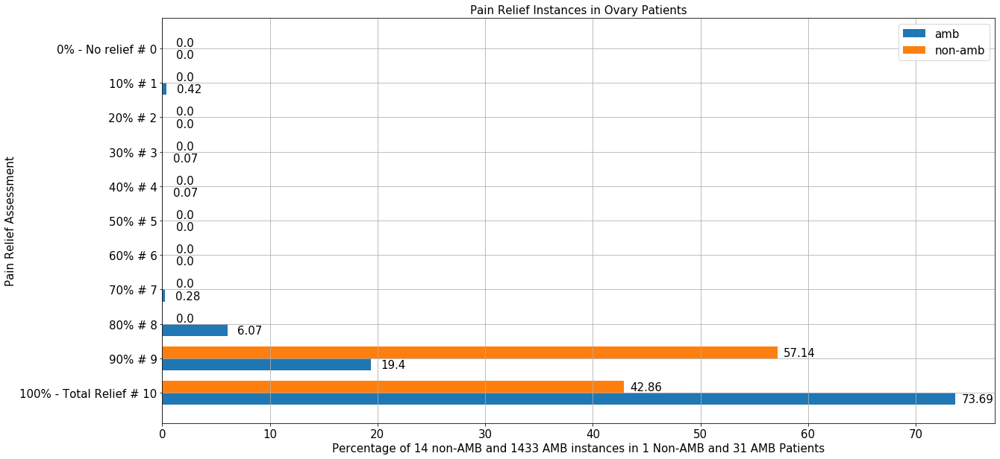

<Figure size 1440x720 with 0 Axes>

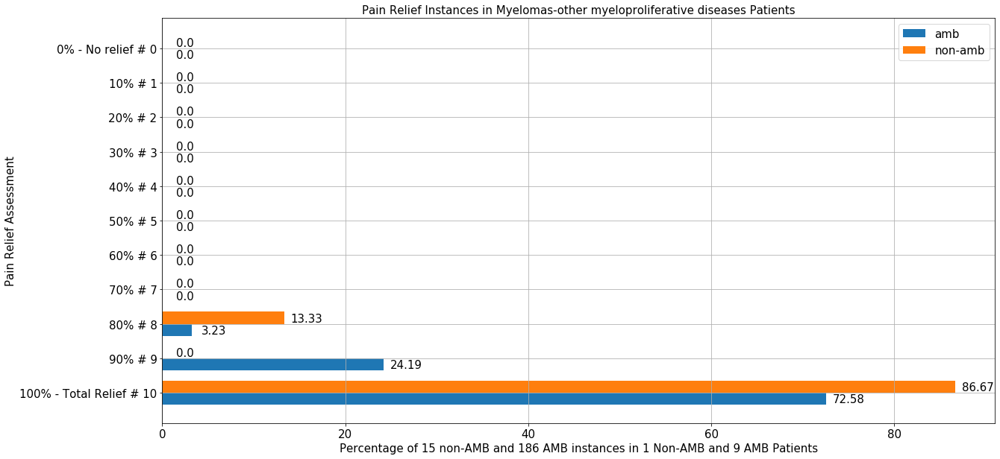

<Figure size 1440x720 with 0 Axes>

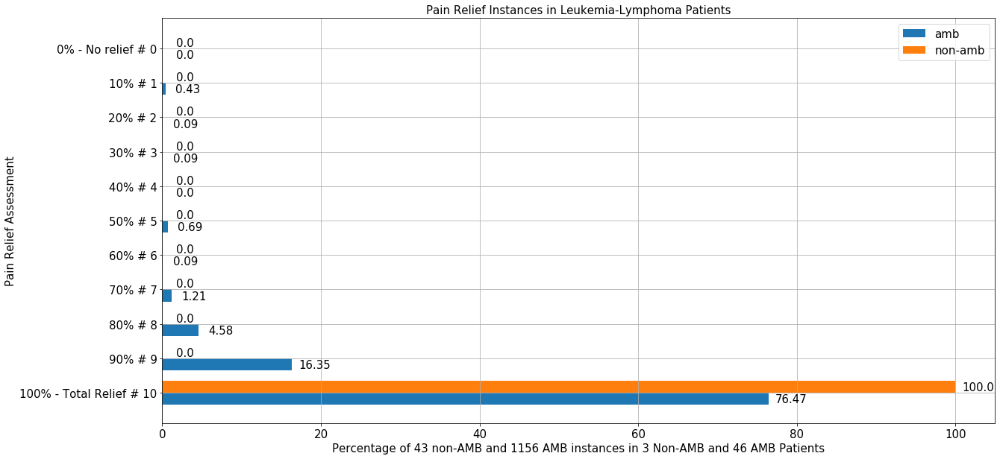

<Figure size 1440x720 with 0 Axes>

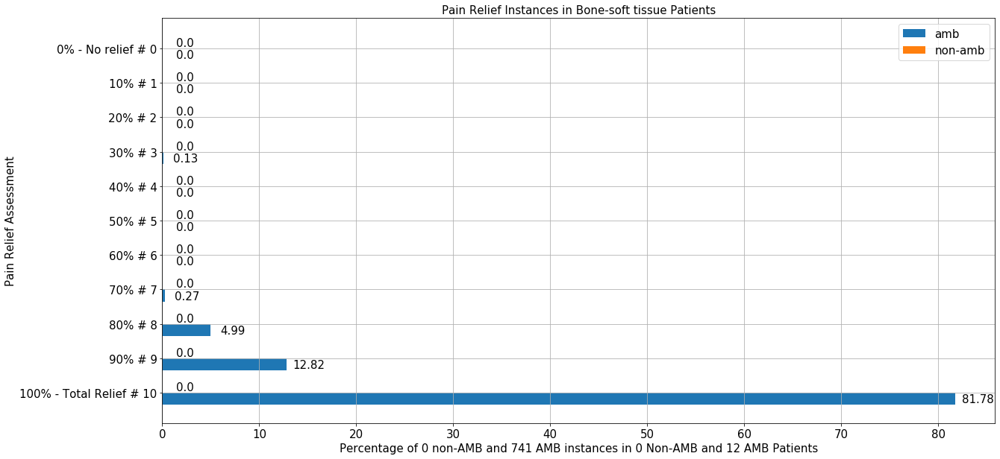

<Figure size 1440x720 with 0 Axes>

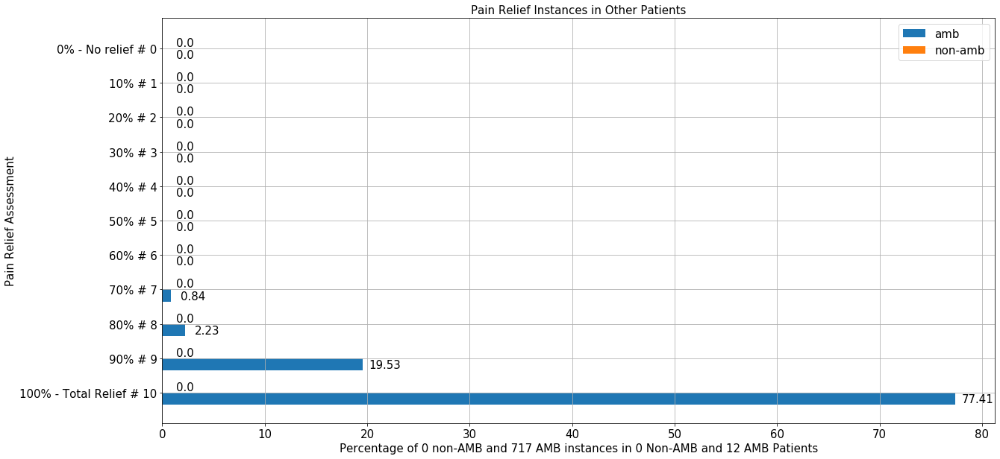

<Figure size 1440x720 with 0 Axes>

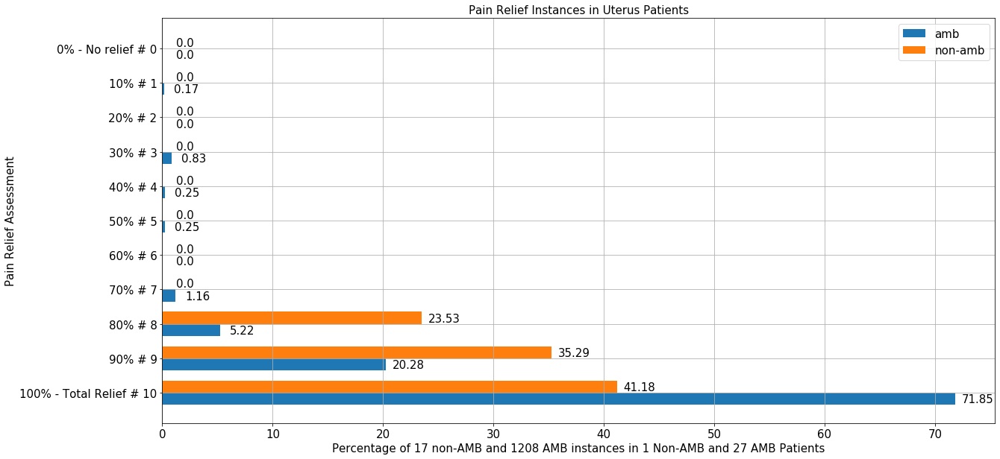

<Figure size 1440x720 with 0 Axes>

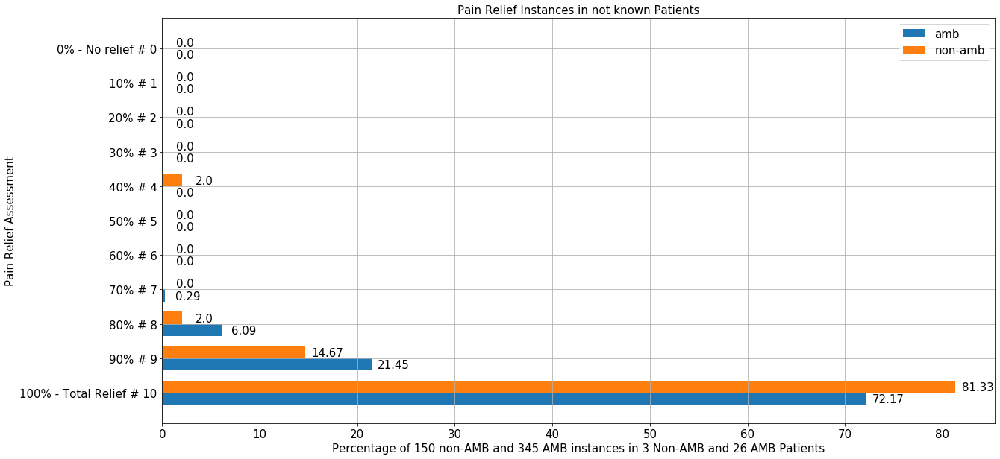

<Figure size 1440x720 with 0 Axes>

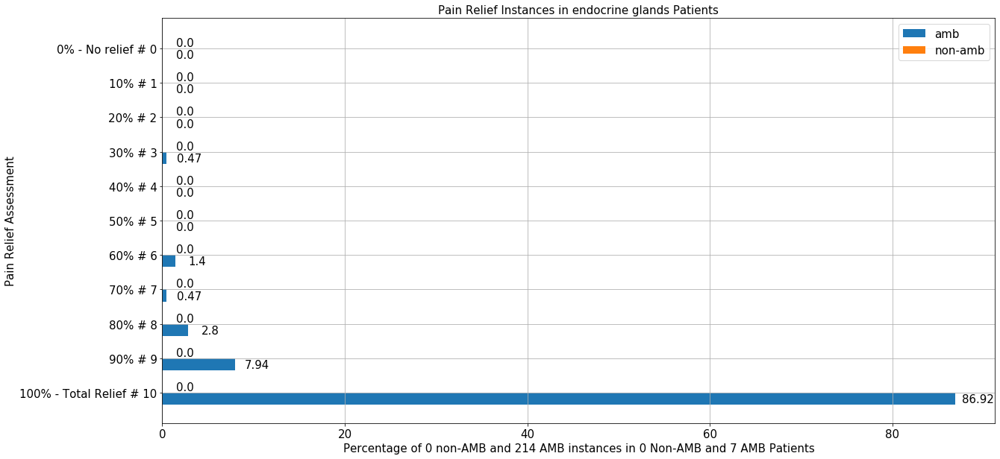

<Figure size 1440x720 with 0 Axes>

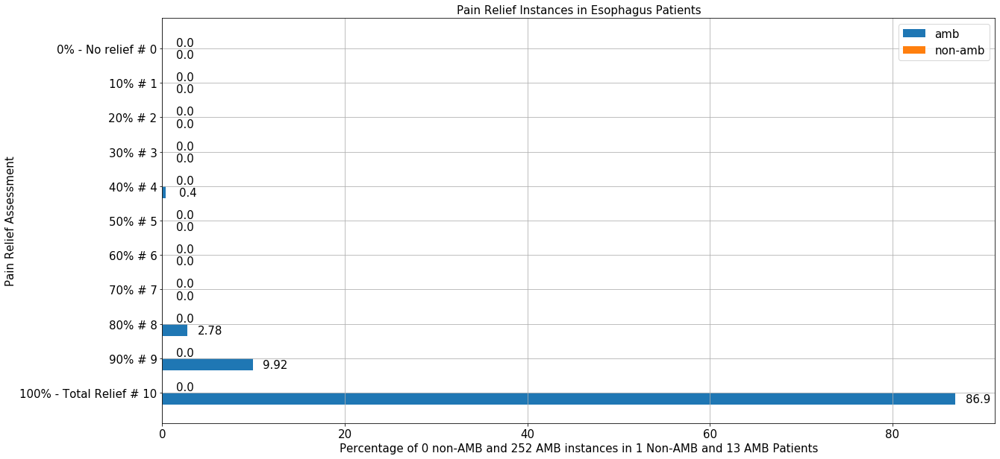

In [51]:
# for ambulatory and non-ambulatory
for cancer in cancers:
    if isinstance(cancer, np.float):
        continue
    df_pid_0 = df_ptc[df_ptc['AMB'] == 0]
    df_pid_1 = df_ptc[df_ptc['AMB'] == 1]
    df_pid_0 = df_pid_0[df_pid_0['Diagnosis'] == cancer].PatientID
    df_pid_0 = df_pid_0.reset_index().drop(['index'], axis=1)
    df_pain_0 = df_obs.merge(df_pid_0, on=['PatientID'], how='inner').dropna(subset=['pain_relief'])
    df_pid_1 = df_pid_1[df_pid_1['Diagnosis'] == cancer].PatientID
    df_pid_1 = df_pid_1.reset_index().drop(['index'], axis=1)
    df_pain_1 = df_obs.merge(df_pid_1, on=['PatientID'], how='inner').dropna(subset=['pain_relief'])
    plt.rcParams['figure.figsize'] = [20, 10]
    matplotlib.rcParams.update({'font.size': 15})
    plt.figure()
    labels = pd.Index(['100% - Total Relief # 10', '90% # 9', '80% # 8', '70% # 7', '60% # 6',
           '50% # 5', '40% # 4', '30% # 3', '20% # 2', '10% # 1', '0% - No relief # 0'], dtype='object')
    x = np.arange(len(labels))
    width = 0.35
    fig, ax = plt.subplots()
    non_amb = df_pain_0['pain_relief'].value_counts(normalize=True).mul(100).round(2).reindex(df_obs['pain_relief'].dropna().unique(), fill_value=0)
    amb = df_pain_1['pain_relief'].value_counts(normalize=True).mul(100).round(2).reindex(df_obs['pain_relief'].dropna().unique(), fill_value=0)
    bar1 = ax.barh(x - width/2, amb, width, label='amb')
    bar2 = ax.barh(x + width/2, non_amb, width, label='non-amb')
    ax.set_ylabel('Pain Relief Assessment', fontsize=15)
    ax.set_xlabel('Percentage of ' + str(df_pain_0.shape[0]) + ' non-AMB and ' + str(df_pain_1.shape[0]) + ' AMB instances in ' + str(df_pid_0.shape[0]) + ' Non-AMB and ' + str(df_pid_1.shape[0]) + ' AMB Patients' , fontsize=15)
    ax.set_title('Pain Relief Instances in ' + cancer + ' Patients', fontsize=15)
    ax.set_yticks(x)
    ax.set_yticklabels(labels)
    ax.legend()
    autolabel(bar1)
    autolabel(bar2)
    plt.grid()
    plt.show()

<Figure size 1440x720 with 0 Axes>

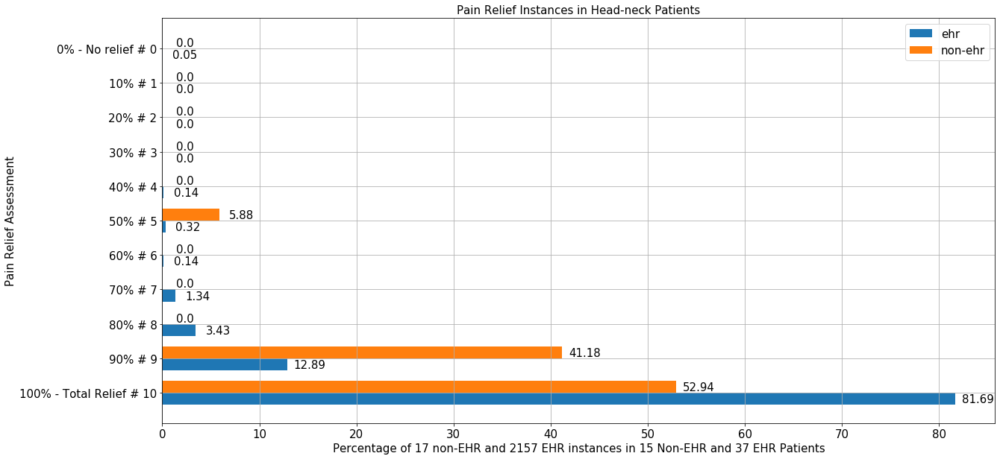

<Figure size 1440x720 with 0 Axes>

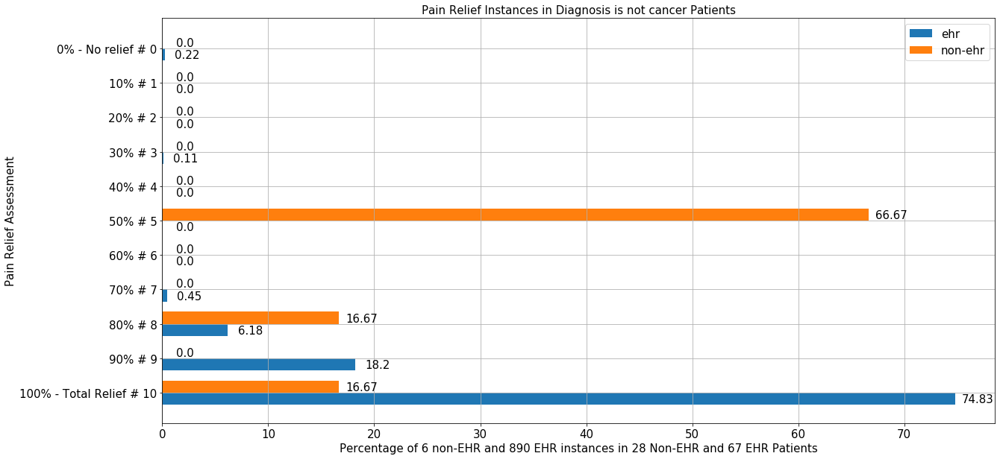

<Figure size 1440x720 with 0 Axes>

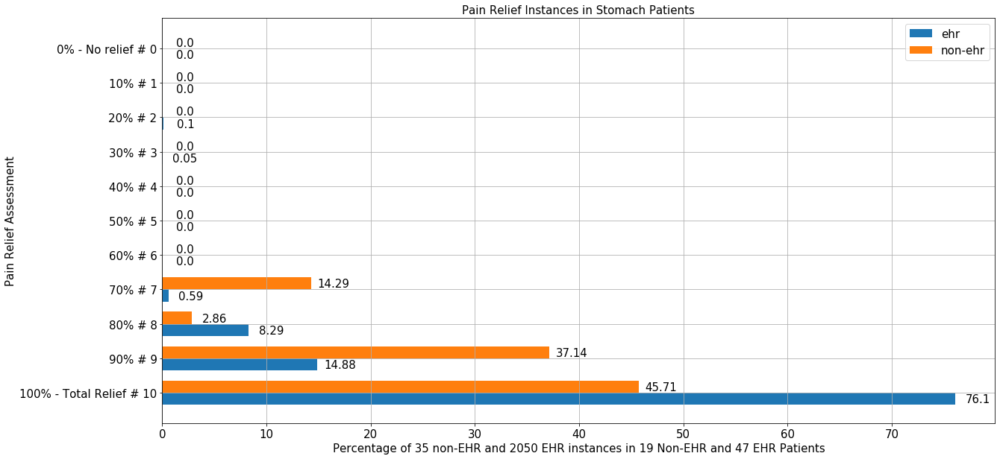

<Figure size 1440x720 with 0 Axes>

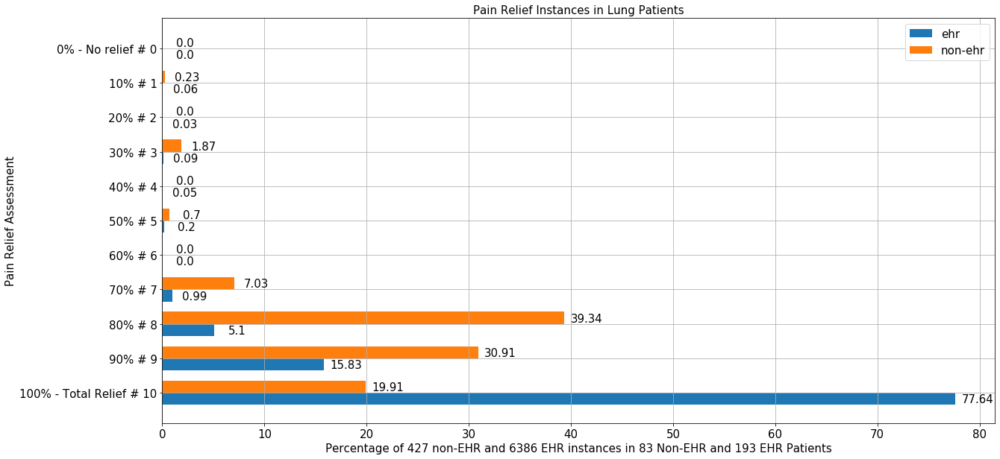

<Figure size 1440x720 with 0 Axes>

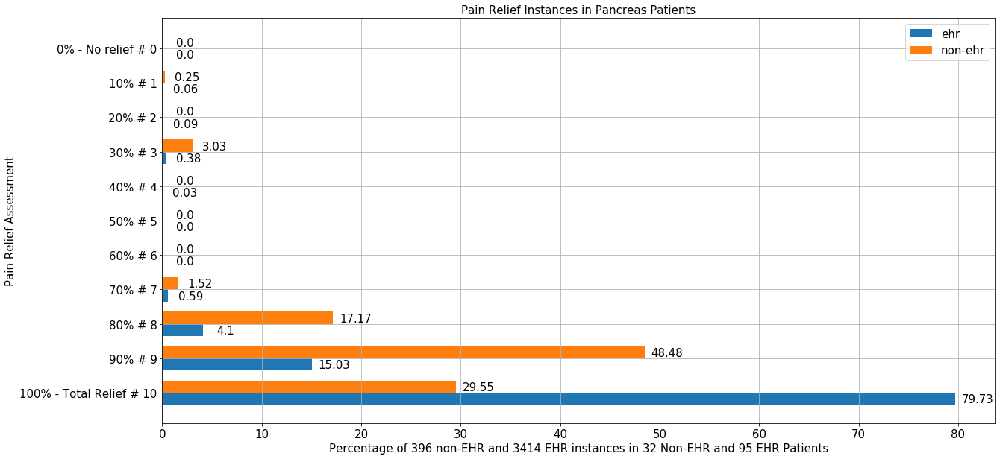

<Figure size 1440x720 with 0 Axes>

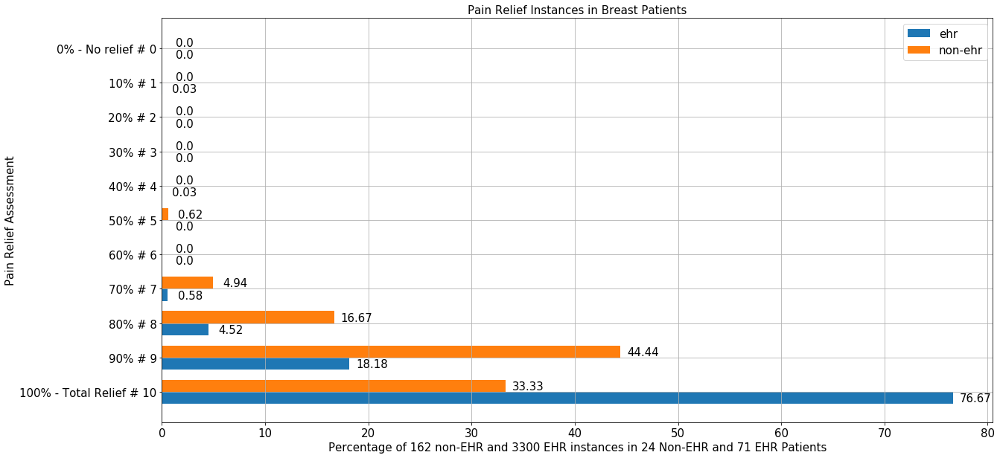

<Figure size 1440x720 with 0 Axes>

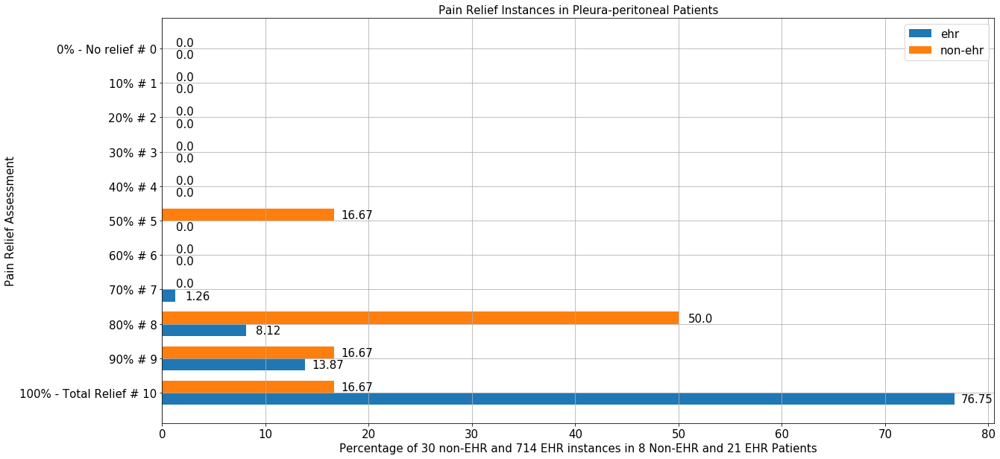

<Figure size 1440x720 with 0 Axes>

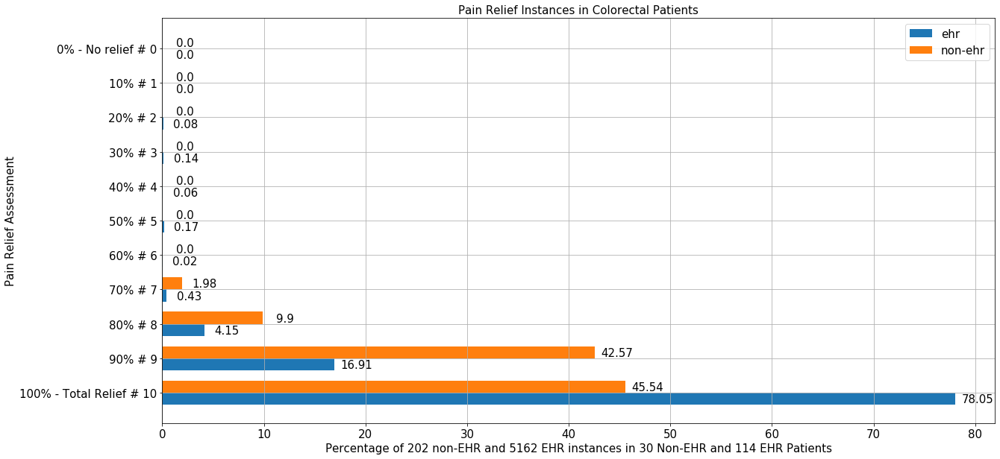

<Figure size 1440x720 with 0 Axes>

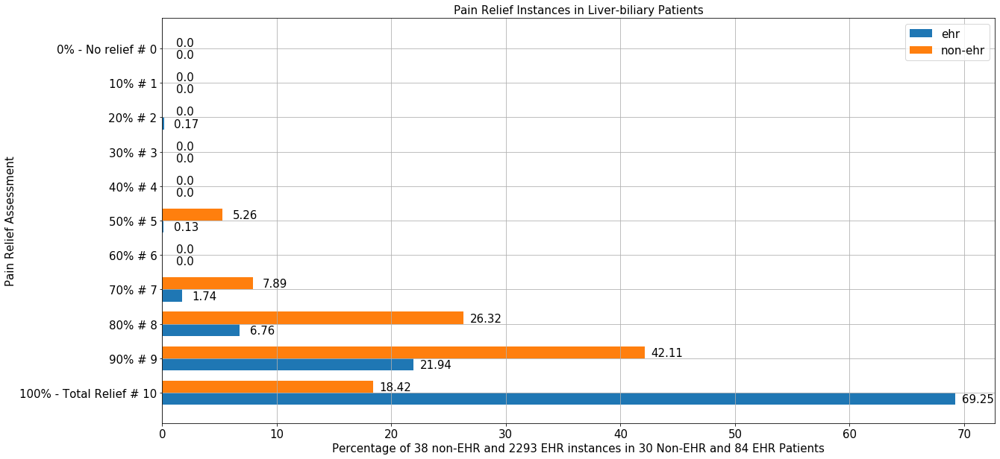

<Figure size 1440x720 with 0 Axes>

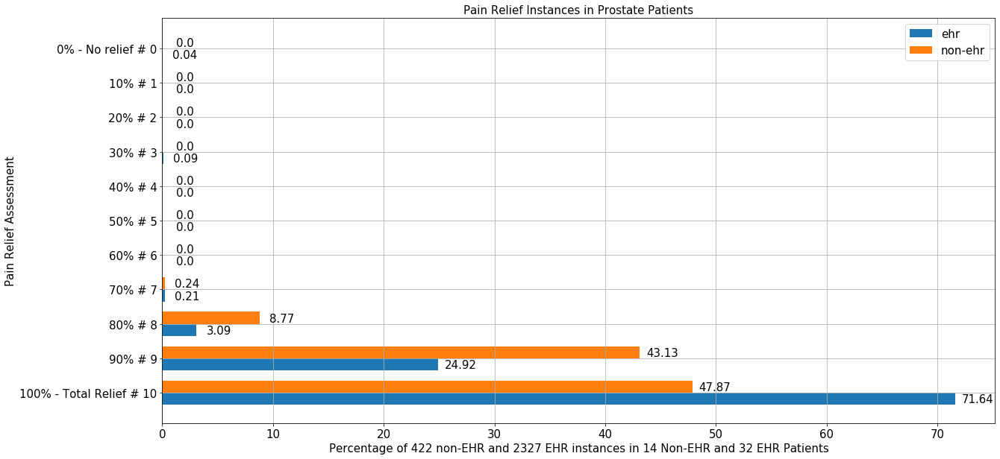

<Figure size 1440x720 with 0 Axes>

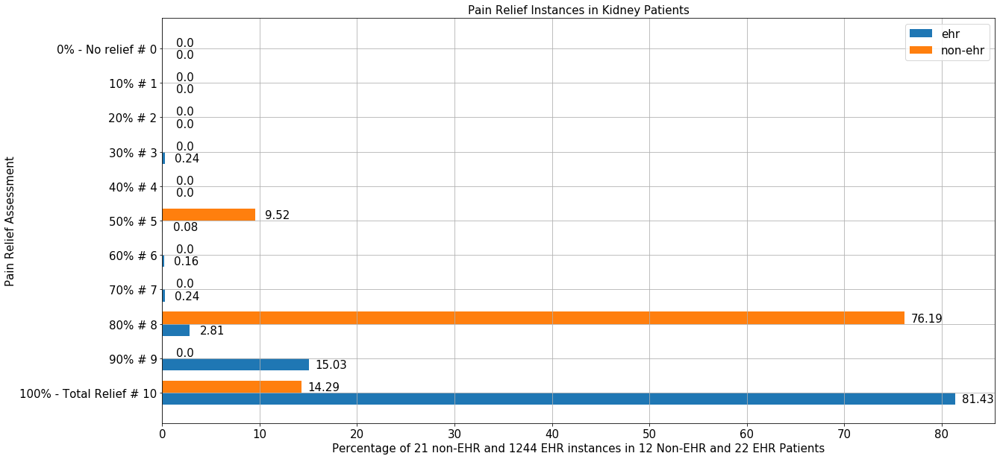

<Figure size 1440x720 with 0 Axes>

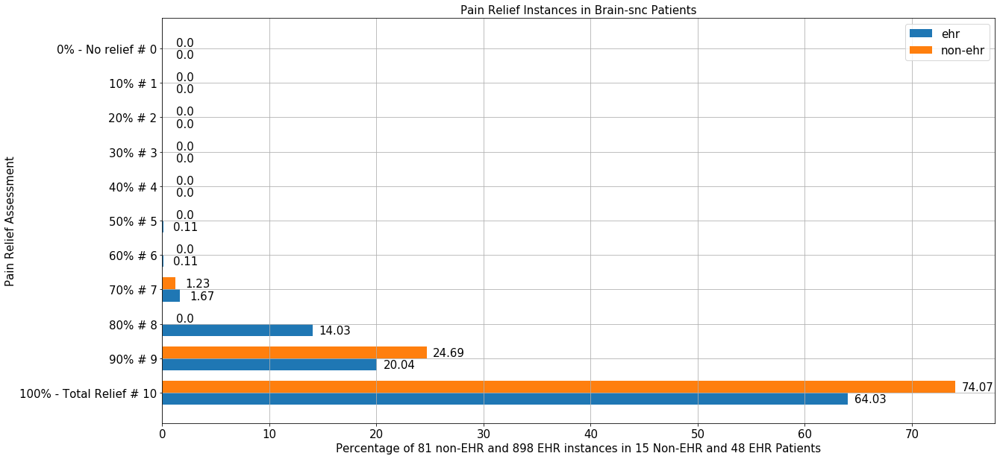

<Figure size 1440x720 with 0 Axes>

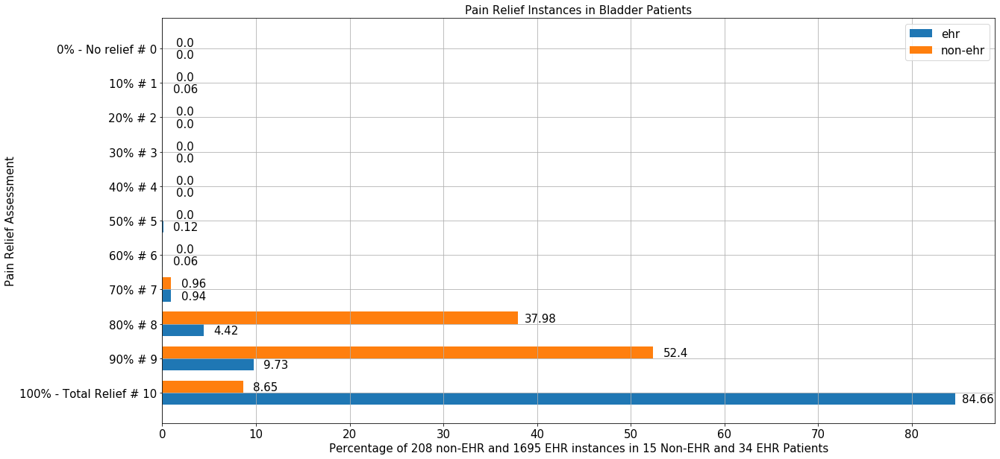

<Figure size 1440x720 with 0 Axes>

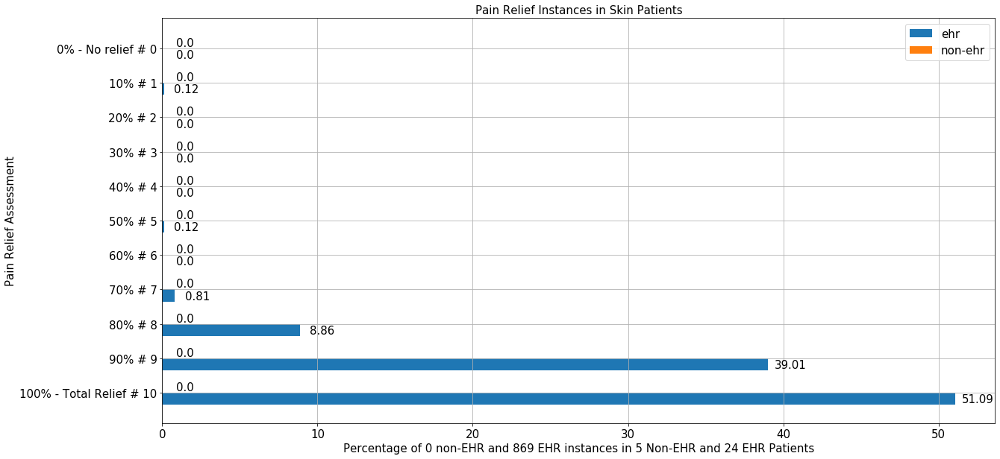

<Figure size 1440x720 with 0 Axes>

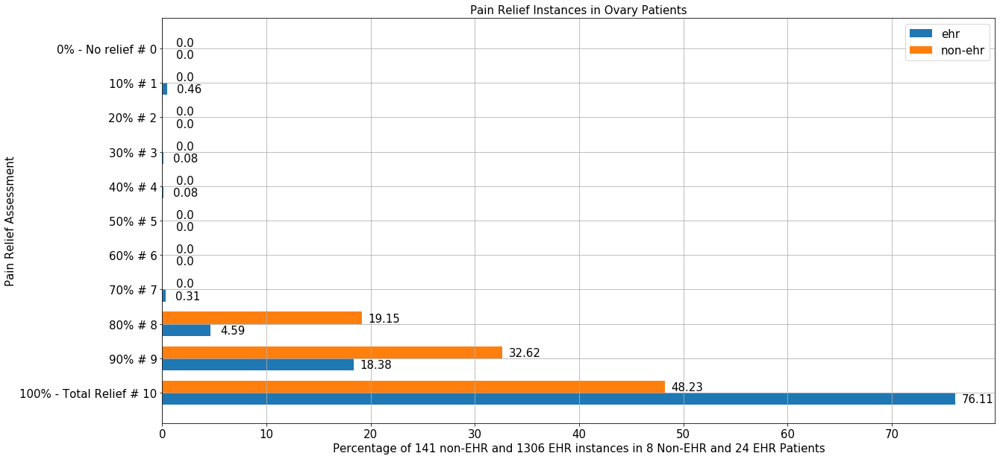

<Figure size 1440x720 with 0 Axes>

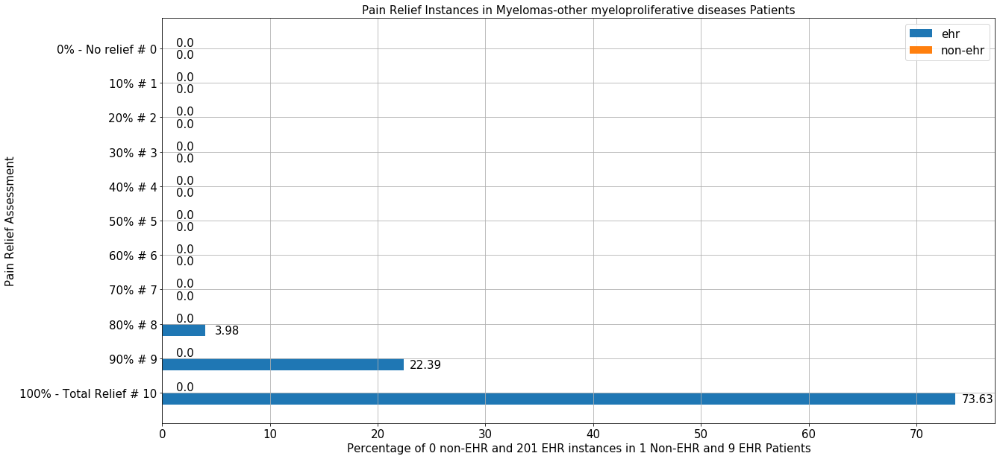

<Figure size 1440x720 with 0 Axes>

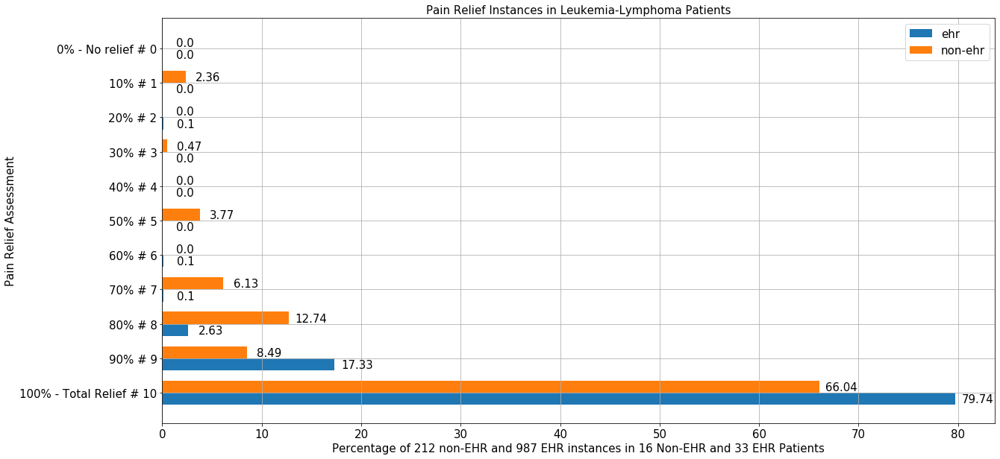

<Figure size 1440x720 with 0 Axes>

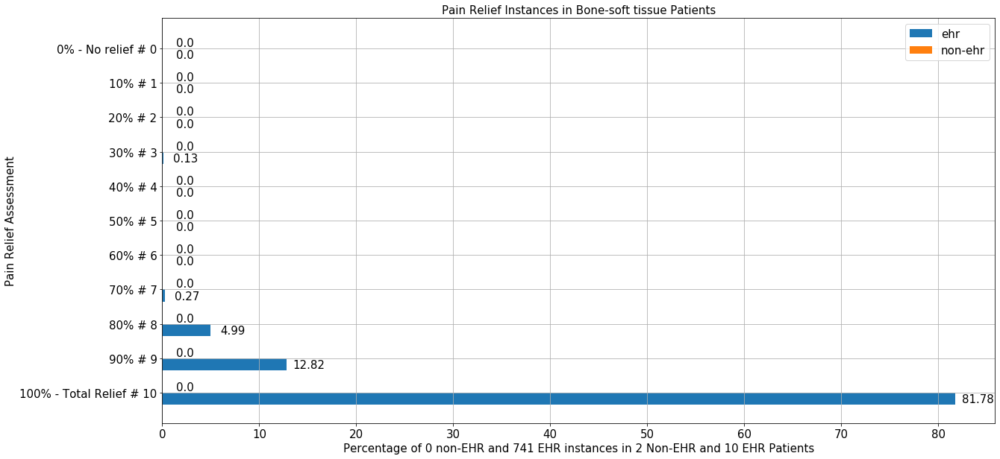

<Figure size 1440x720 with 0 Axes>

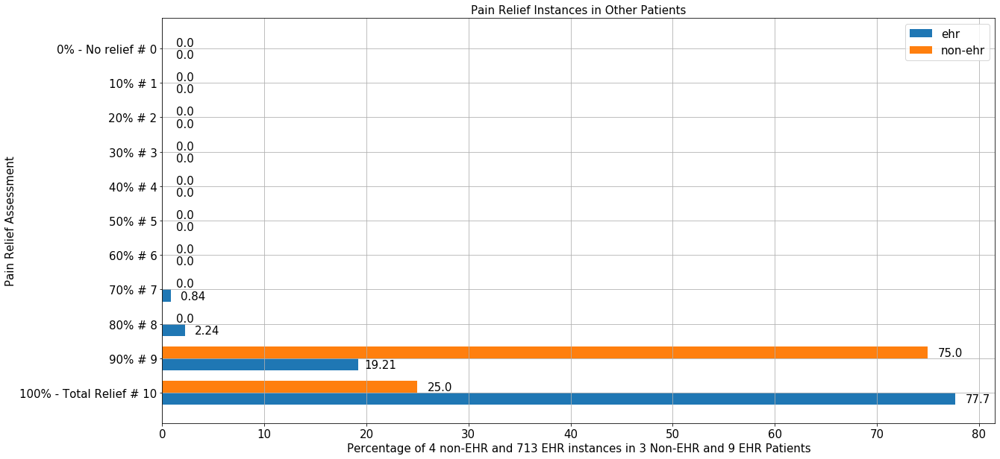

<Figure size 1440x720 with 0 Axes>

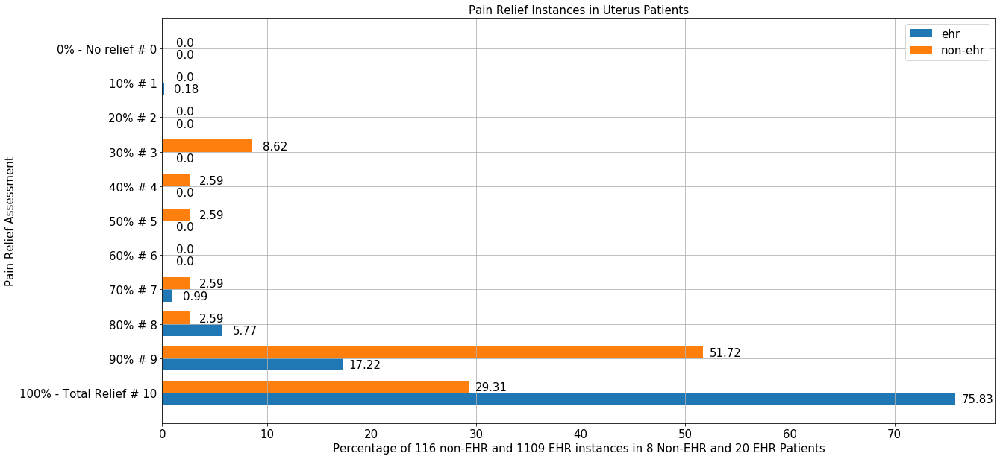

<Figure size 1440x720 with 0 Axes>

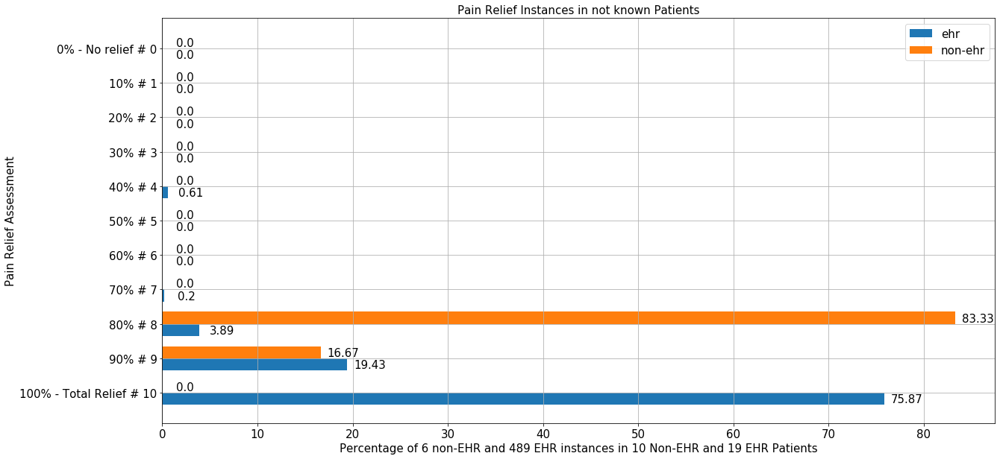

<Figure size 1440x720 with 0 Axes>

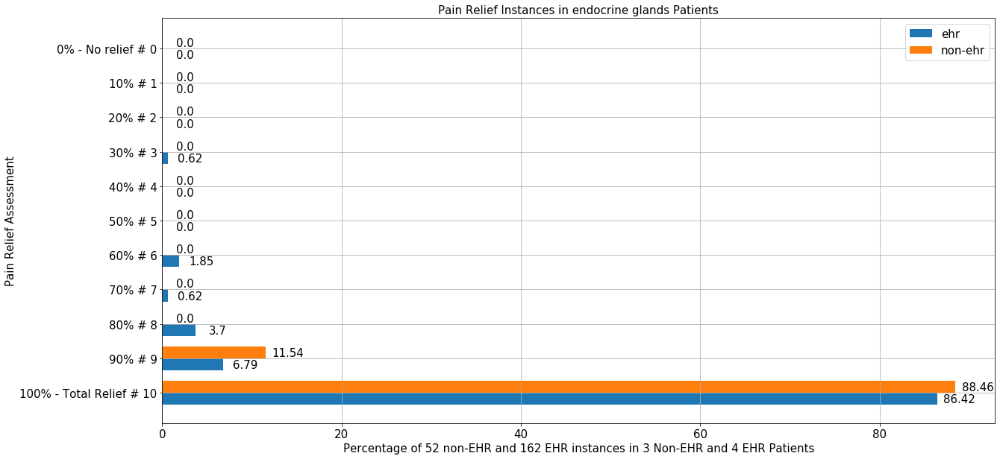

<Figure size 1440x720 with 0 Axes>

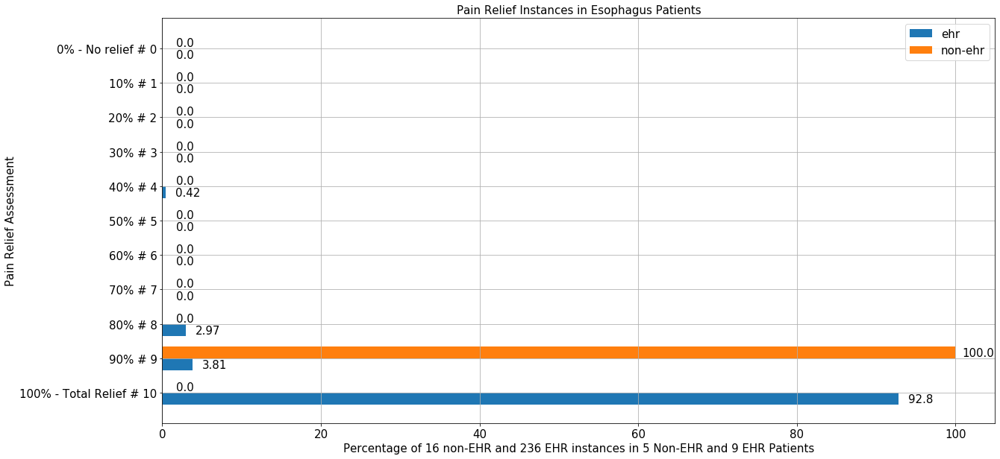

In [52]:
# for EHR and non-EHR patients
for cancer in cancers:
    if isinstance(cancer, np.float):
        continue
    df_pid_0 = df_ptc[df_ptc['EHR'] == 0]
    df_pid_1 = df_ptc[df_ptc['EHR'] == 1]
    df_pid_0 = df_pid_0[df_pid_0['Diagnosis'] == cancer].PatientID
    df_pid_0 = df_pid_0.reset_index().drop(['index'], axis=1)
    df_pain_0 = df_obs.merge(df_pid_0, on=['PatientID'], how='inner').dropna(subset=['pain_relief'])
    df_pid_1 = df_pid_1[df_pid_1['Diagnosis'] == cancer].PatientID
    df_pid_1 = df_pid_1.reset_index().drop(['index'], axis=1)
    df_pain_1 = df_obs.merge(df_pid_1, on=['PatientID'], how='inner').dropna(subset=['pain_relief'])
    plt.rcParams['figure.figsize'] = [20, 10]
    matplotlib.rcParams.update({'font.size': 15})
    plt.figure()
    labels = pd.Index(['100% - Total Relief # 10', '90% # 9', '80% # 8', '70% # 7', '60% # 6',
           '50% # 5', '40% # 4', '30% # 3', '20% # 2', '10% # 1', '0% - No relief # 0'], dtype='object')
    x = np.arange(len(labels))
    width = 0.35
    fig, ax = plt.subplots()
    non_ehr = df_pain_0['pain_relief'].value_counts(normalize=True).mul(100).round(2).reindex(df_obs['pain_relief'].dropna().unique(), fill_value=0)
    ehr = df_pain_1['pain_relief'].value_counts(normalize=True).mul(100).round(2).reindex(df_obs['pain_relief'].dropna().unique(), fill_value=0)
    bar1 = ax.barh(x - width/2, ehr, width, label='ehr')
    bar2 = ax.barh(x + width/2, non_ehr, width, label='non-ehr')
    ax.set_ylabel('Pain Relief Assessment', fontsize=15)
    ax.set_xlabel('Percentage of ' + str(df_pain_0.shape[0]) + ' non-EHR and ' + str(df_pain_1.shape[0]) + ' EHR instances in ' + str(df_pid_0.shape[0]) + ' Non-EHR and ' + str(df_pid_1.shape[0]) + ' EHR Patients' , fontsize=15)
    ax.set_title('Pain Relief Instances in ' + cancer + ' Patients', fontsize=15)
    ax.set_yticks(x)
    ax.set_yticklabels(labels)
    ax.legend()
    autolabel(bar1)
    autolabel(bar2)
    plt.grid()
    plt.show()

In [53]:
df_temp = df_ptc[df_ptc['EHR'] == 1]
df_temp[df_temp['PatientID'] == 120].head()

,PatientID,EHR,AMB,Age,Sex,when_needed,standard,Diagnosis
14,120,1.0,0.0,93.0,F,1.0,1.0,Liver-biliary


In [54]:
# Start of Prototye for Most Frequent Pain Relief Obaservation per Cancer Type

In [55]:
df_pid = df_ptc[df_ptc['Diagnosis'] == 'Colorectal'].PatientID
df_pid = df_pid.reset_index().drop(['index'], axis=1)
print(df_pid.shape)
df_pid.head()

(172, 1)


,PatientID
0,112
1,67
2,220
3,165
4,289


In [56]:
df_pain = df_obs.merge(df_pid, on=['PatientID'], how='inner')
print(df_pain.shape)
df_pain.head()

(24755, 73)


,Unnamed: 0,idehr,timestamp_insert,PatientID,opt_hypotrophy,opt_anxiety,chk_eloquence,anorexia,personal_hygiene,urine_elimination,mobility,hemorrhagic_manifestation,speech,cough,nausea,memory_deficit,cognitive_deficit,active_diuresis,lack_of_appetite,opt_cooperation,opt_memory_deficit_type,opt_care_giver,chk_gastrointestinal_symptoms,chk_bowel_symptoms,opt_dehydration,opt_attitude,pain_freq,pain_relief,breath,consolability,body_language,facial_expression,awareness,asthenia,cachexia,dyspnoea,motor_performance,body_temp,agitation_behavior_freq,diet,cognitive_state,feces_elimination,consumption_help,chk_ausili_presidi_urinary_catheter,chk_ausili_presidi_bladder_catheter,chk_ausili_presidi_absorbency,chk_ausili_presidi_urocondom,chk_ausili_presidi_disposable_sleepers,mood_fear,mood_despair,mood_sadness,mood_helplessness,mood_denial,mood_hopelessness,mood_sense_of_helplessness,mood_negation,mood_sense_of_solitude,mood_senso_dimpotenza,mood_desperation,mood_sense_of_impotence,mood_apathy,mood_hostility,mood_loneliness,mood_closure_in_itself,mood_sense_of_powerlessness,mood_serenity,mood_sense_of_loneliness,mood_demoralisation,mood_happiness,mood_irritability,mood_disappointment,mood_rage,mood_anger
0,2,16,2015-01-12 11:40:00.510,71,Hypotrophy # 0,NaN,confabulation # 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Severe # 3,NaN,NaN,NaN,Apyrexia,quiet # 0,NaN,confused at times 0 #,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,3,16,2015-01-12 11:42:15.270,71,Hypotrophy # 0,NaN,confabulation # 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Severe # 3,NaN,NaN,NaN,Apyrexia,quiet # 0,NaN,confused at times 0 #,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,23378,16,2015-01-12 08:39:31.767,71,NaN,NaN,NaN,NaN,With help # 2,With help # 2,With help # 2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20% - Patient with serious impairment of organ...,NaN,NaN,Absent # 4,confused - sometimes # 0,With help # 2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,23402,16,2015-01-12 17:19:34.330,71,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"40% - Patient incapacitated, it requires conti...",NaN,NaN,Homogenized # 2,NaN,NaN,help with # 2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,23403,16,2015-01-12 18:11:26.210,71,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,effective production # 1,NaN,memory deficits # 0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,mild strain # 1,"40% - Patient incapacitated, it requires conti...",NaN,NaN,Homogenized # 2,confused - continuously # 1,NaN,help with # 2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [57]:
df_pain.pain_relief.unique()

array([nan, '100% - Total Relief # 10', '80% # 8', '90% # 9', '70% # 7',
       '60% # 6', '0% - No relief # 0', '40% # 4', '50% # 5', '20% # 2'],
      dtype=object)

In [58]:
len(df_pain.PatientID.unique())

128

In [59]:
df_temp = df_pain[['idehr', 'PatientID', 'pain_relief']]
df_temp = df_temp.groupby(['PatientID', 'pain_relief']).size().reset_index(name='num_obs')
df_temp = df_temp.sort_values(by=['PatientID', 'num_obs'], ascending=[True, False]).groupby('PatientID').first().reset_index()
print(df_temp.shape)
df_temp.head()

(101, 3)


,PatientID,pain_relief,num_obs
0,67,100% - Total Relief # 10,107
1,71,100% - Total Relief # 10,1
2,92,100% - Total Relief # 10,9
3,220,100% - Total Relief # 10,83
4,228,90% # 9,4


In [60]:
b = np.array(np.mean(df_temp.pain_relief.value_counts().reindex(df_obs['pain_relief'].dropna().unique(), fill_value=0).values))

In [61]:
# error bar stuff
df_temp1 = df_temp[['PatientID', 'pain_relief']]
a = np.array(df_temp1.pain_relief.value_counts().reindex(df_obs['pain_relief'].dropna().unique(), fill_value=0).values)
c = np.sum(a)
print(a, b, c)
a = a - b
a = np.square(a)
a = np.sum(a) / c
np.sqrt(a)

[78 16  6  1  0  0  0  0  0  0  0] 9.181818181818182 101


7.345528958459558

<Figure size 1440x720 with 0 Axes>

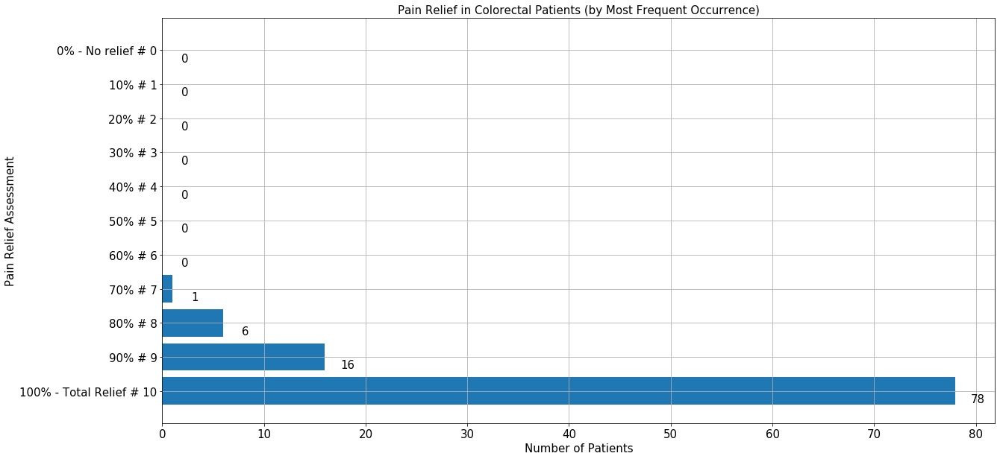

In [62]:
# new code for generating the plot
plt.rcParams['figure.figsize'] = [20, 10]
matplotlib.rcParams.update({'font.size': 15})
plt.figure()
fig, ax = plt.subplots()
labels = df_temp.pain_relief.value_counts().reindex(df_obs['pain_relief'].dropna().unique(), fill_value=0)
# label_errors = np.std(df_temp.pain_relief.value_counts().reindex(df_obs['pain_relief'].dropna().unique(), fill_value=0).values)
# plt.xlim(-30, 120)
# plt.xticks(np.linspace(-30, 120, 11))
bar1 = ax.barh(pd.Index(['100% - Total Relief # 10', '90% # 9', '80% # 8', '70% # 7', '60% # 6',
       '50% # 5', '40% # 4', '30% # 3', '20% # 2', '10% # 1', '0% - No relief # 0'],
      dtype='object'), labels)
ax.set_ylabel('Pain Relief Assessment', fontsize=15)
ax.set_xlabel('Number of Patients', fontsize=15)
ax.set_title('Pain Relief in Colorectal Patients (by Most Frequent Occurrence)', fontsize=15)
autolabel(bar1)
plt.grid()
plt.show()

<Figure size 1440x720 with 0 Axes>

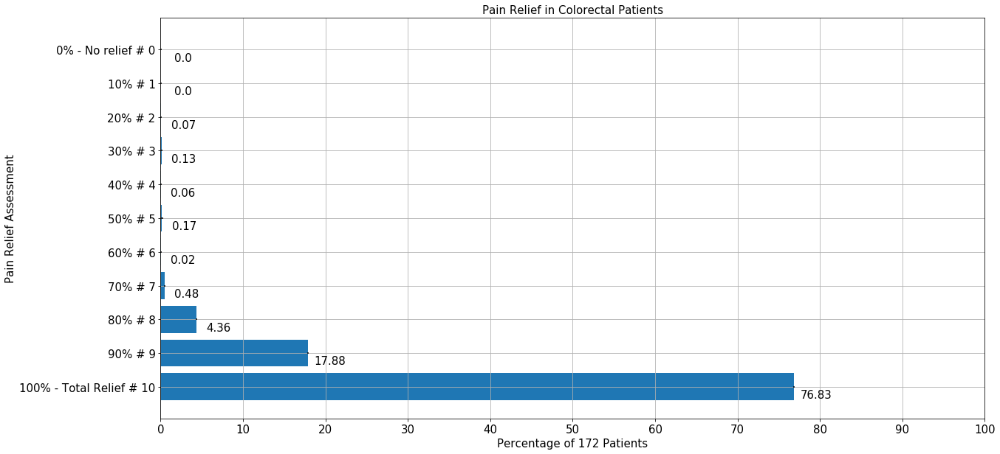

In [63]:
# old code for reference
plt.rcParams['figure.figsize'] = [20, 10]
matplotlib.rcParams.update({'font.size': 15})
plt.figure()
fig, ax = plt.subplots()
labels = df_pain['pain_relief'].value_counts(normalize=True).mul(100).round(2).reindex(df_obs['pain_relief'].dropna().unique(), fill_value=0)
label_errors = df_pain['pain_relief'].value_counts(normalize=True).mean()
plt.xlim(0, 100)
plt.xticks(np.linspace(0, 100, 11))
bar1 = ax.barh(pd.Index(['100% - Total Relief # 10', '90% # 9', '80% # 8', '70% # 7', '60% # 6',
       '50% # 5', '40% # 4', '30% # 3', '20% # 2', '10% # 1', '0% - No relief # 0'],
      dtype='object'), labels, xerr=label_errors)
ax.set_ylabel('Pain Relief Assessment', fontsize=15)
ax.set_xlabel('Percentage of ' + str(df_pid.shape[0]) + ' Patients', fontsize=15)
ax.set_title('Pain Relief in Colorectal Patients', fontsize=15)
autolabel(bar1)
plt.grid()
plt.show()

Num. of patients:  36


<Figure size 1440x720 with 0 Axes>

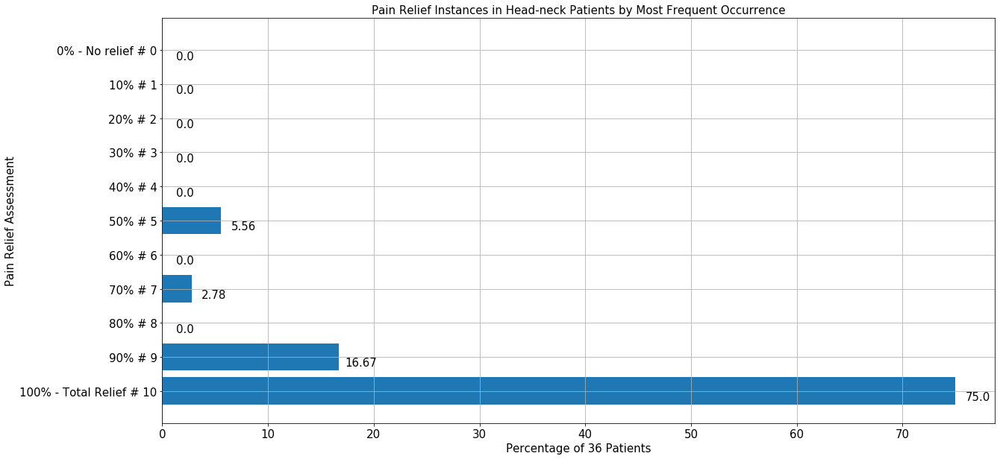

Num. of patients:  35


<Figure size 1440x720 with 0 Axes>

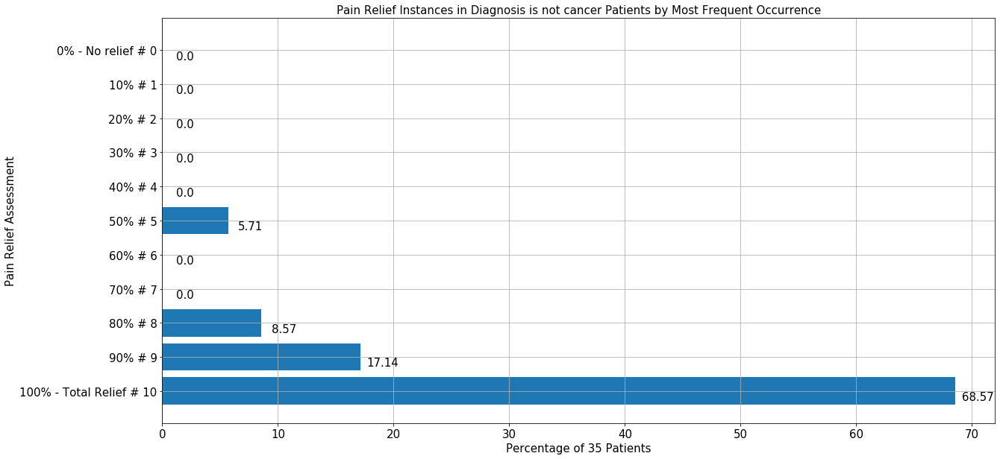

Num. of patients:  46


<Figure size 1440x720 with 0 Axes>

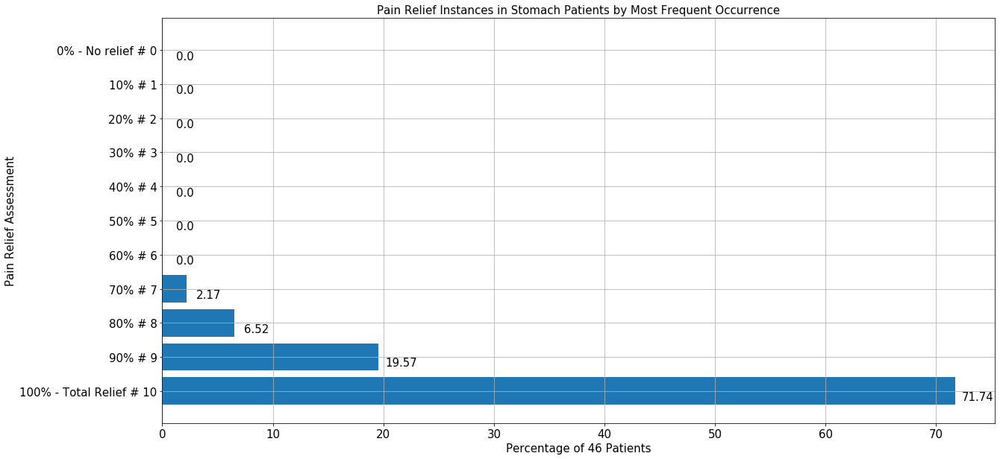

Num. of patients:  171


<Figure size 1440x720 with 0 Axes>

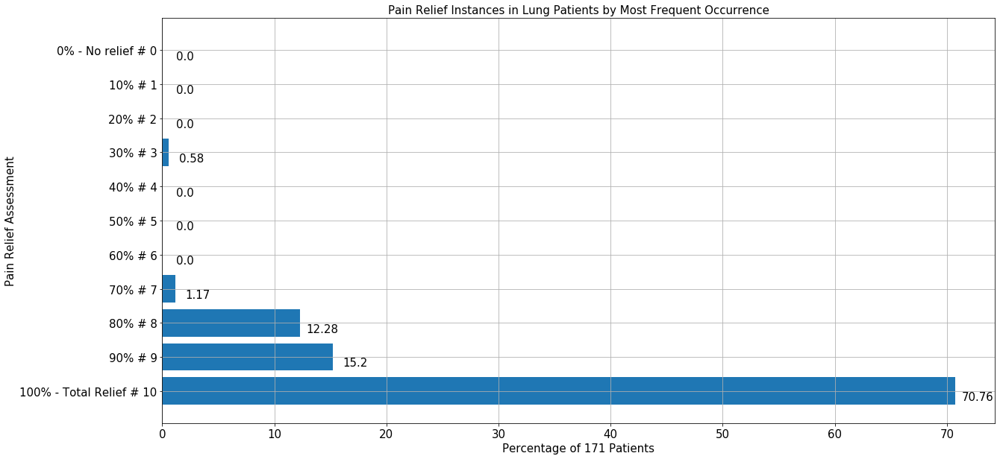

Num. of patients:  93


<Figure size 1440x720 with 0 Axes>

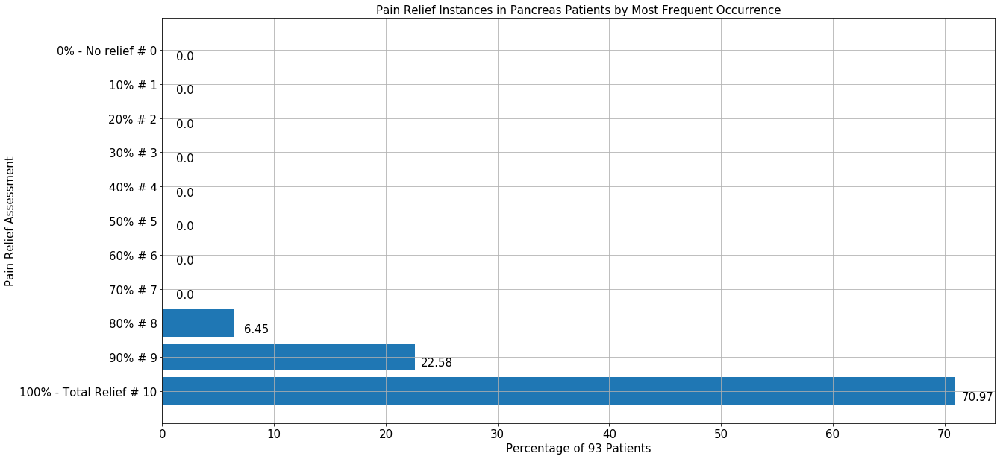

Num. of patients:  66


<Figure size 1440x720 with 0 Axes>

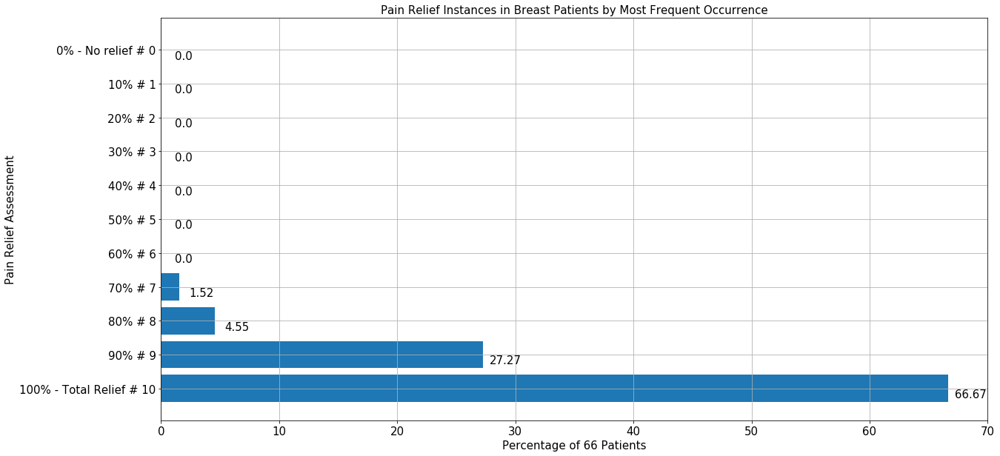

Num. of patients:  18


<Figure size 1440x720 with 0 Axes>

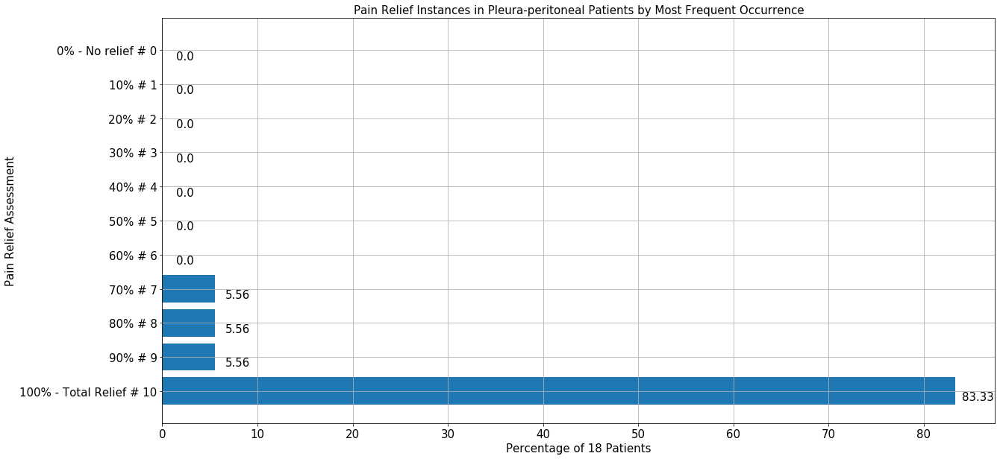

Num. of patients:  101


<Figure size 1440x720 with 0 Axes>

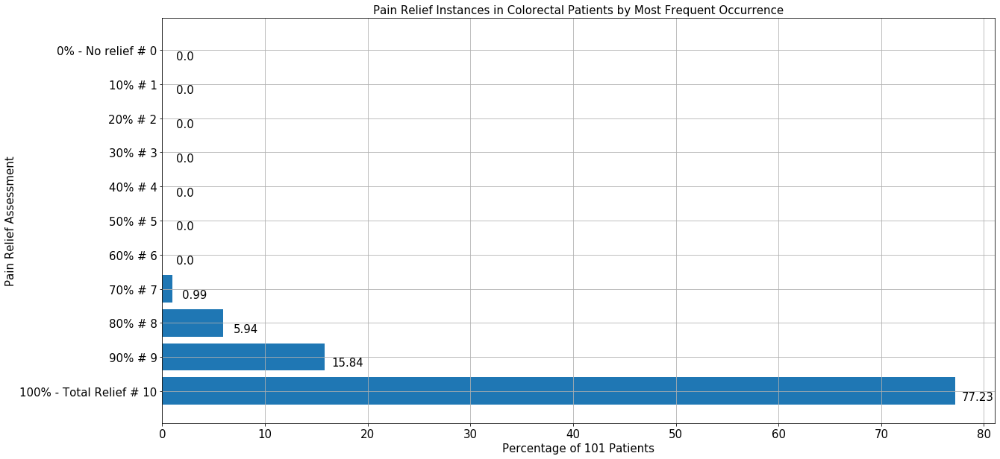

Num. of patients:  63


<Figure size 1440x720 with 0 Axes>

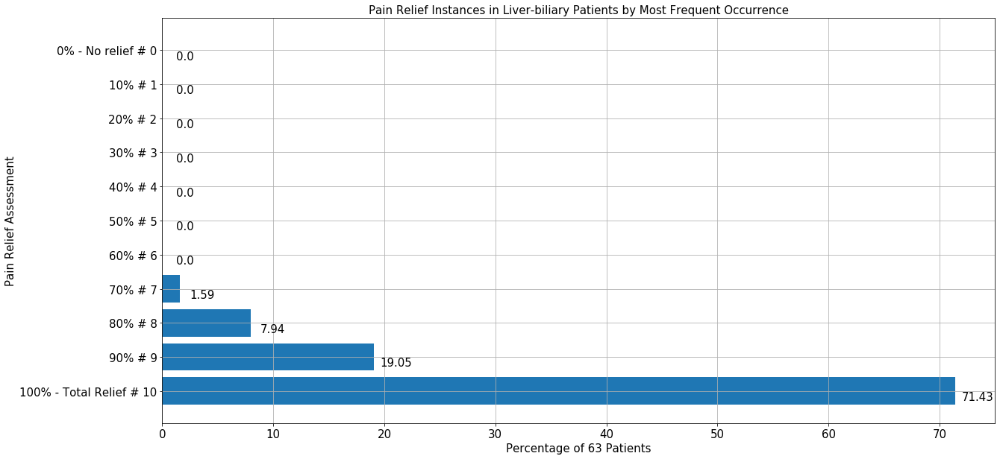

Num. of patients:  33


<Figure size 1440x720 with 0 Axes>

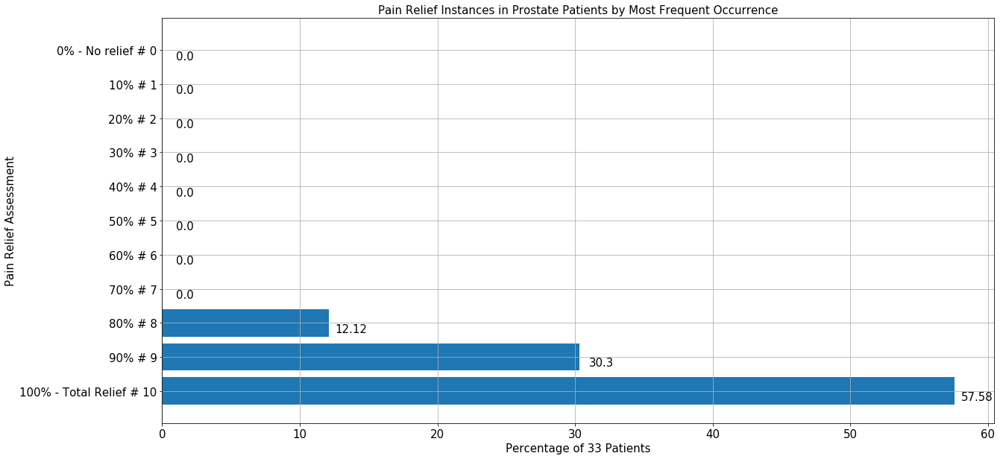

Num. of patients:  19


<Figure size 1440x720 with 0 Axes>

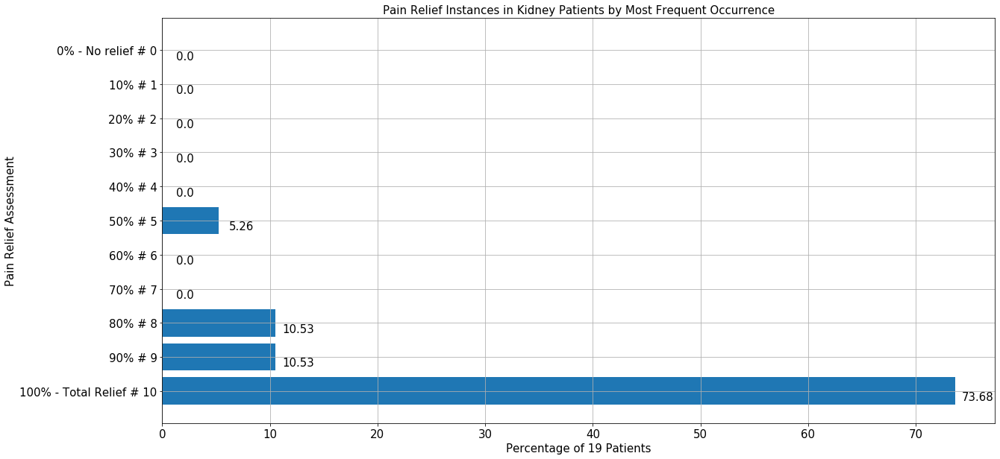

Num. of patients:  33


<Figure size 1440x720 with 0 Axes>

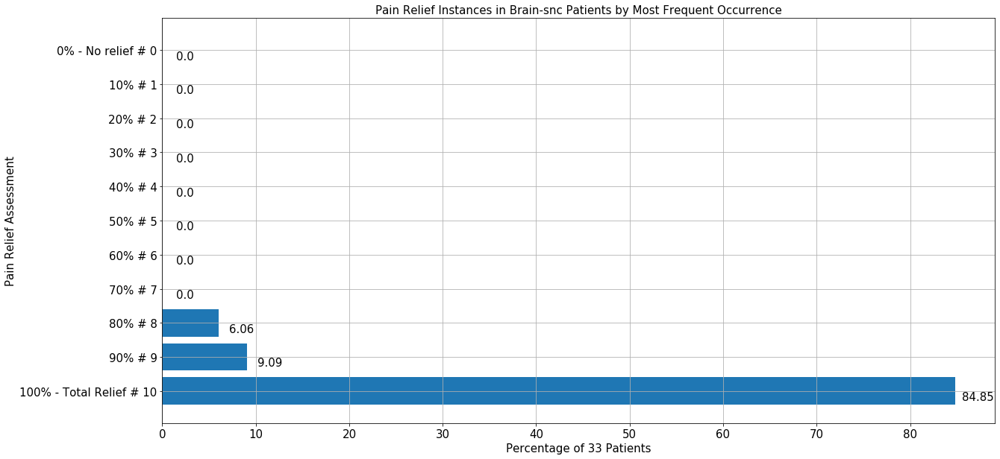

Num. of patients:  33


<Figure size 1440x720 with 0 Axes>

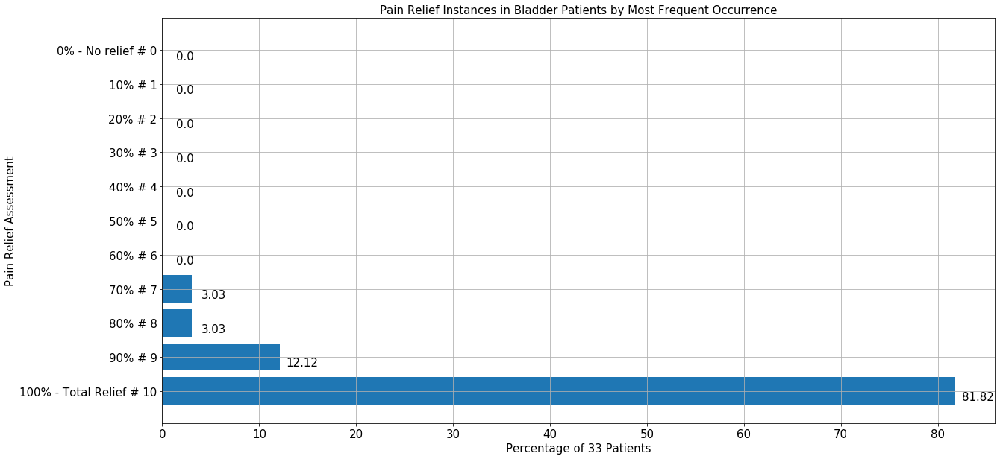

Num. of patients:  17


<Figure size 1440x720 with 0 Axes>

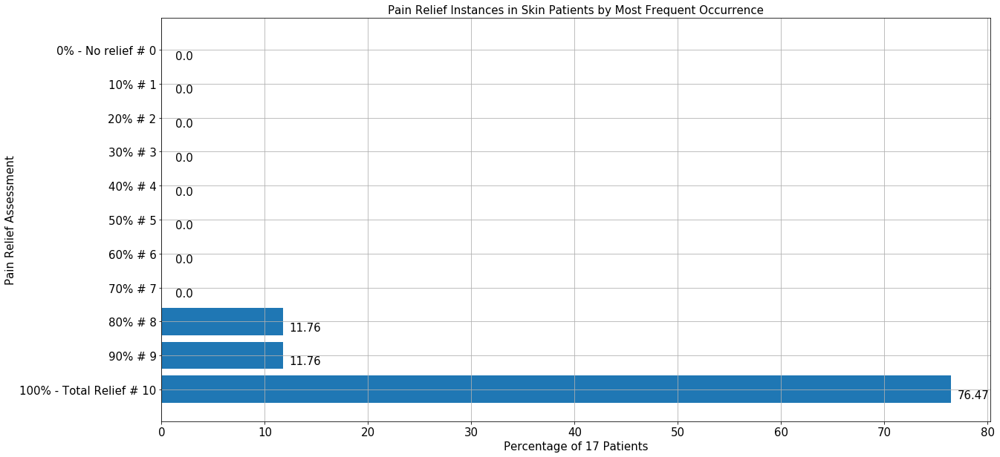

Num. of patients:  21


<Figure size 1440x720 with 0 Axes>

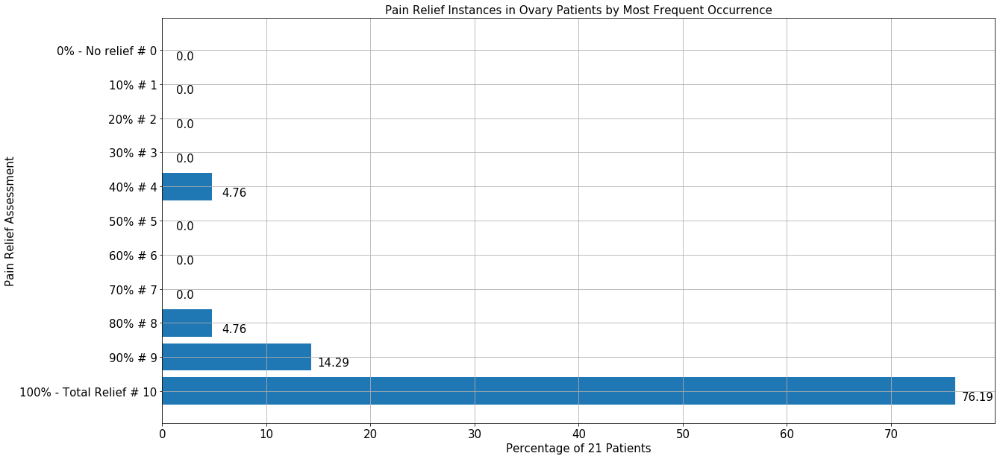

Num. of patients:  8


<Figure size 1440x720 with 0 Axes>

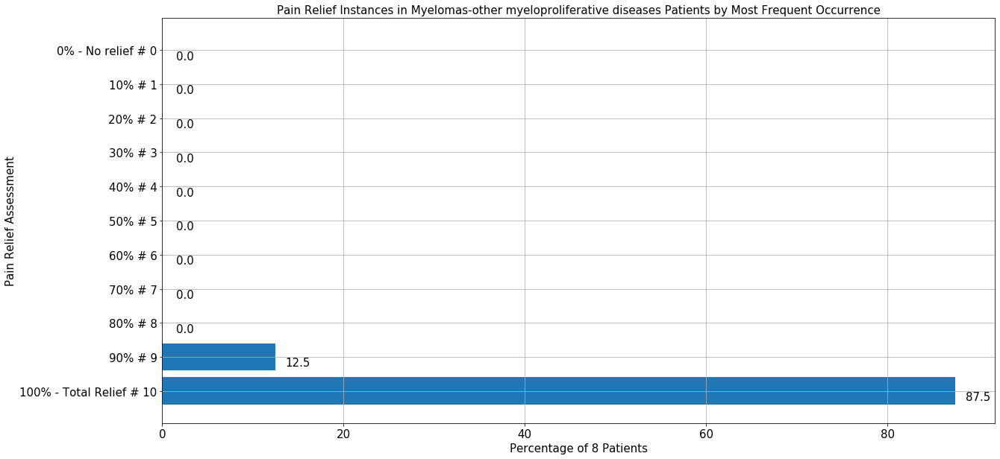

Num. of patients:  24


<Figure size 1440x720 with 0 Axes>

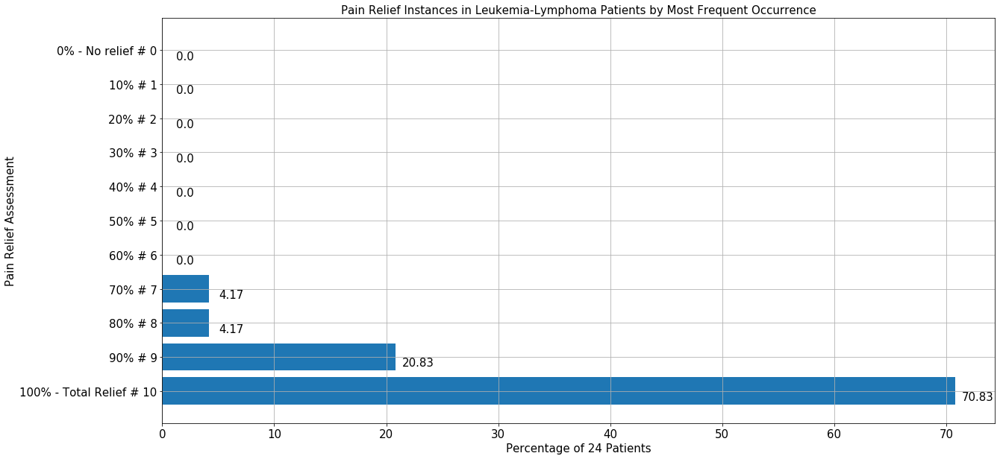

Num. of patients:  10


<Figure size 1440x720 with 0 Axes>

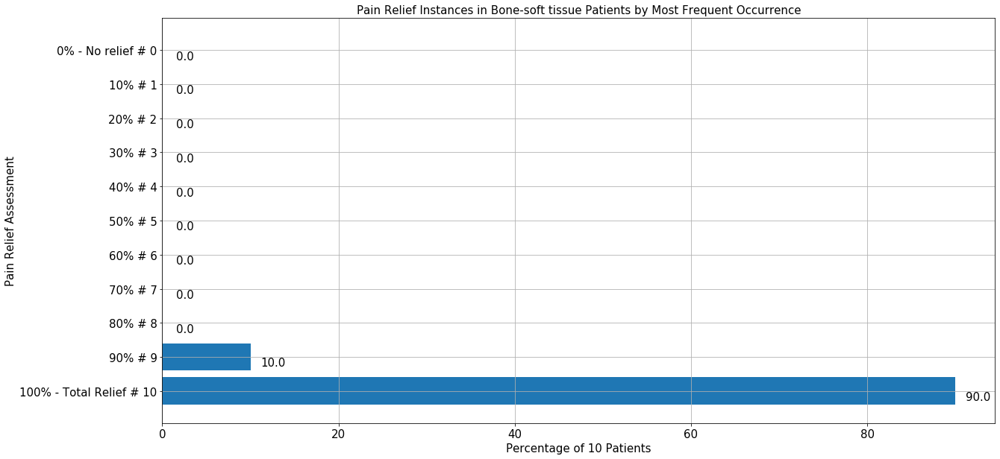

Num. of patients:  7


<Figure size 1440x720 with 0 Axes>

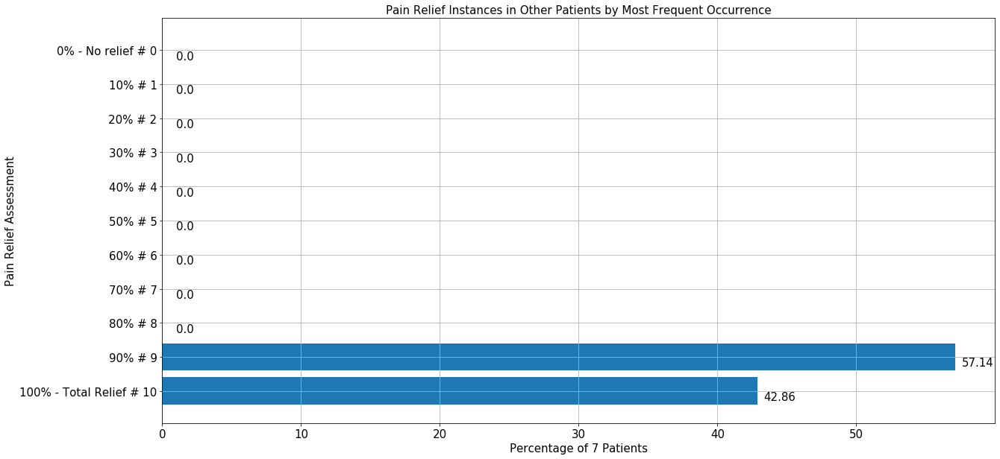

Num. of patients:  20


<Figure size 1440x720 with 0 Axes>

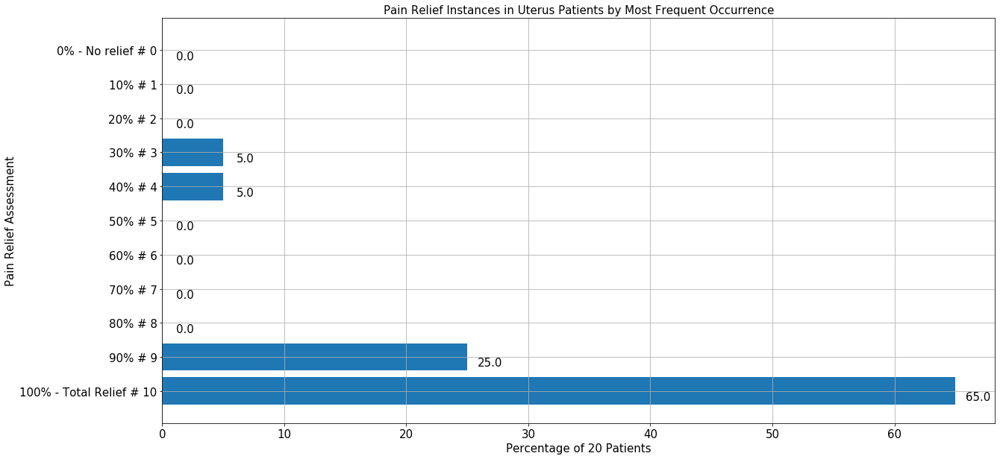

Num. of patients:  13


<Figure size 1440x720 with 0 Axes>

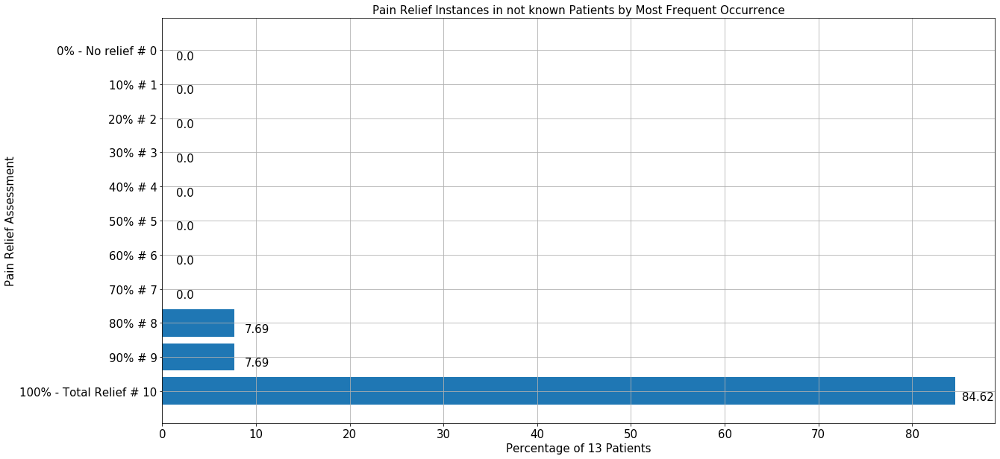

Num. of patients:  5


<Figure size 1440x720 with 0 Axes>

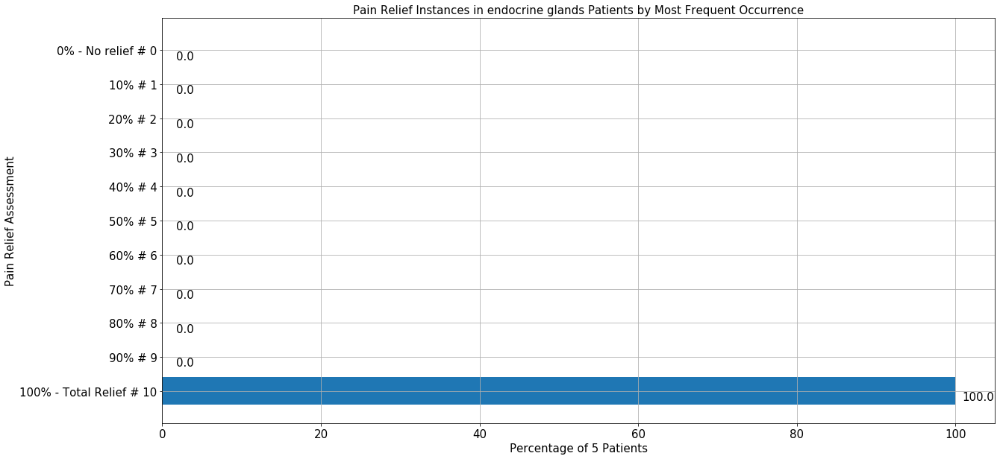

Num. of patients:  7


<Figure size 1440x720 with 0 Axes>

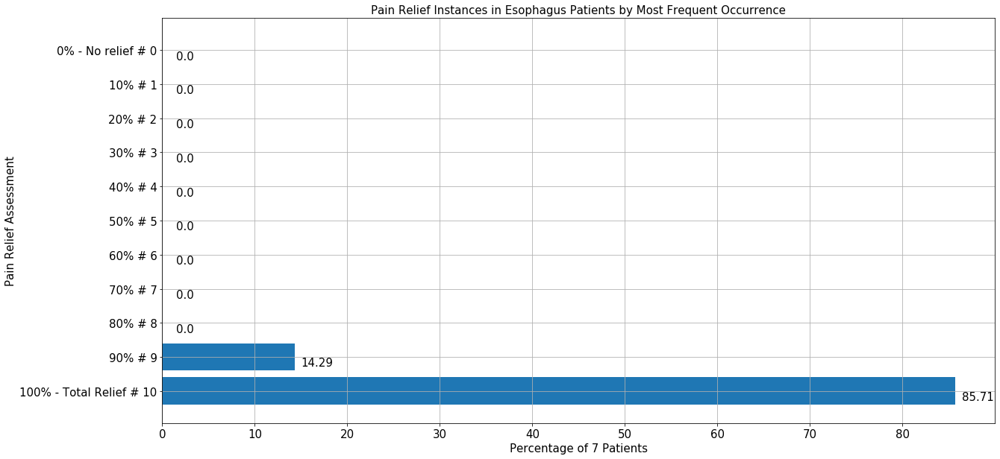

In [64]:
# sorting by PatientID
def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_width()
        ax.annotate('{}'.format(height),
                    xy=(height, rect.get_y()),
                    xytext=(30, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

for cancer in cancers:
    if isinstance(cancer, np.float):
        continue
    df_pid = df_ptc[df_ptc['Diagnosis'] == cancer].PatientID
    df_pid = df_pid.reset_index().drop(['index'], axis=1)
    df_pain = df_obs.merge(df_pid, on=['PatientID'], how='inner')
    
    df_temp = df_pain[['idehr', 'PatientID', 'pain_relief']]
    df_temp = df_temp.groupby(['PatientID', 'pain_relief']).size().reset_index(name='num_obs')
    df_temp = df_temp.sort_values(by=['PatientID', 'num_obs'], ascending=[True, False]).groupby('PatientID').first().reset_index()

    plt.rcParams['figure.figsize'] = [20, 10]
    matplotlib.rcParams.update({'font.size': 15})
    plt.figure()
    fig, ax = plt.subplots()
    labels = df_temp.pain_relief.value_counts(normalize=True).mul(100).round(2).reindex(df_obs['pain_relief'].dropna().unique(), fill_value=0)
#     label_errors = np.std(df_temp.num_obs.value_counts().reindex(df_obs['pain_relief'].dropna().unique(), fill_value=0).values)
    
    print("Num. of patients: ", len(df_temp.PatientID.unique()))
#     print("Std. Dev.: ", label_errors)
    
    bar1 = ax.barh(pd.Index(['100% - Total Relief # 10', '90% # 9', '80% # 8', '70% # 7', '60% # 6',
           '50% # 5', '40% # 4', '30% # 3', '20% # 2', '10% # 1', '0% - No relief # 0'], dtype='object'), labels)
    ax.set_ylabel('Pain Relief Assessment', fontsize=15)
    ax.set_xlabel('Percentage of ' + str(len(df_temp.PatientID.unique())) + ' Patients', fontsize=15)
    ax.set_title('Pain Relief Instances in ' + cancer + ' Patients by Most Frequent Occurrence', fontsize=15)
    autolabel(bar1)
    plt.grid()
    plt.show()

Num. of patients:  49


<Figure size 1440x720 with 0 Axes>

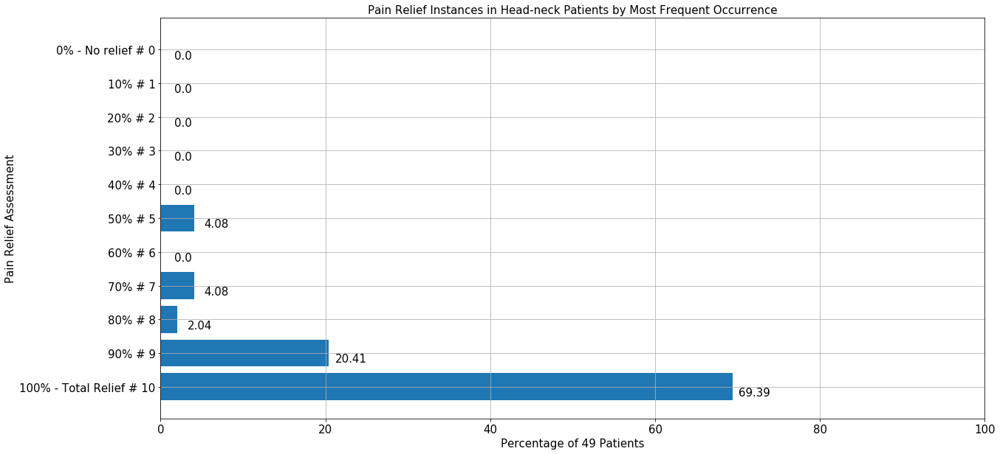

Num. of patients:  41


<Figure size 1440x720 with 0 Axes>

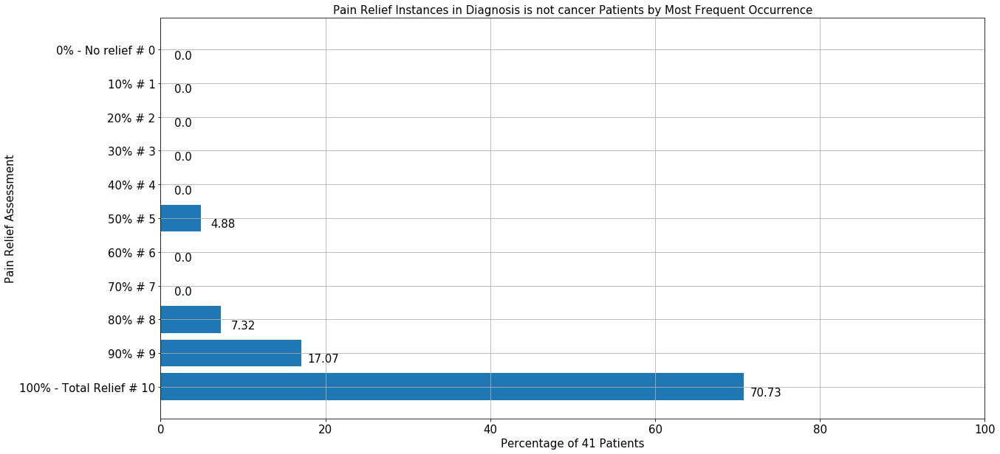

Num. of patients:  65


<Figure size 1440x720 with 0 Axes>

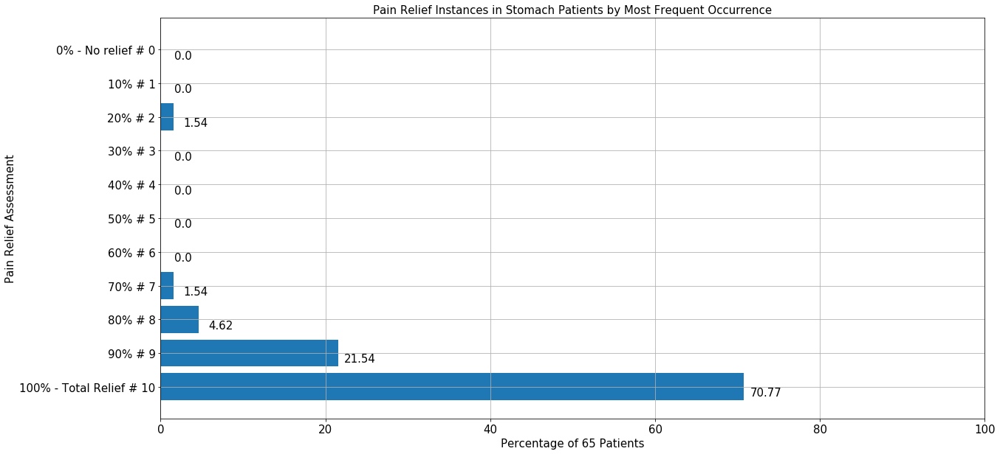

Num. of patients:  214


<Figure size 1440x720 with 0 Axes>

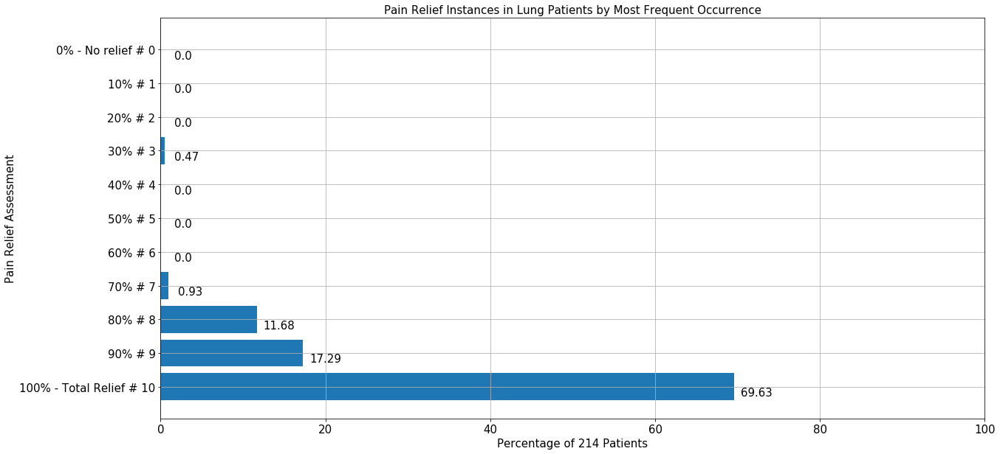

Num. of patients:  128


<Figure size 1440x720 with 0 Axes>

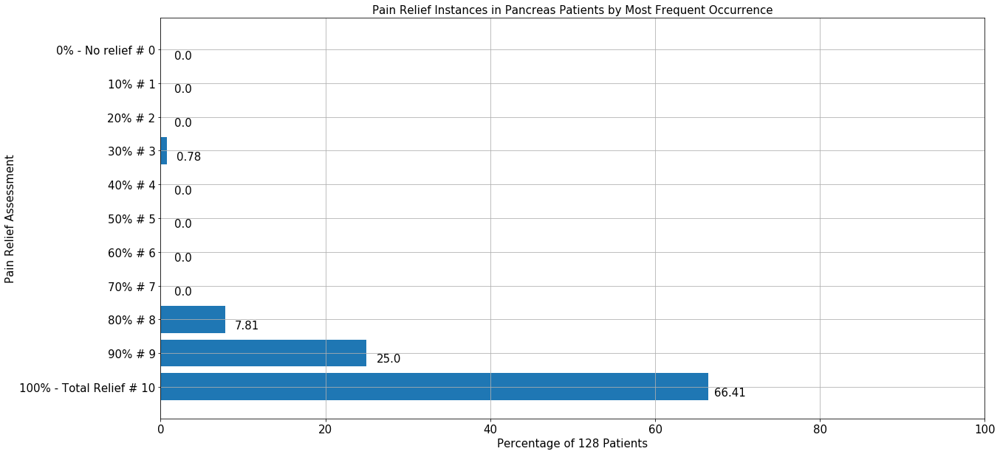

Num. of patients:  88


<Figure size 1440x720 with 0 Axes>

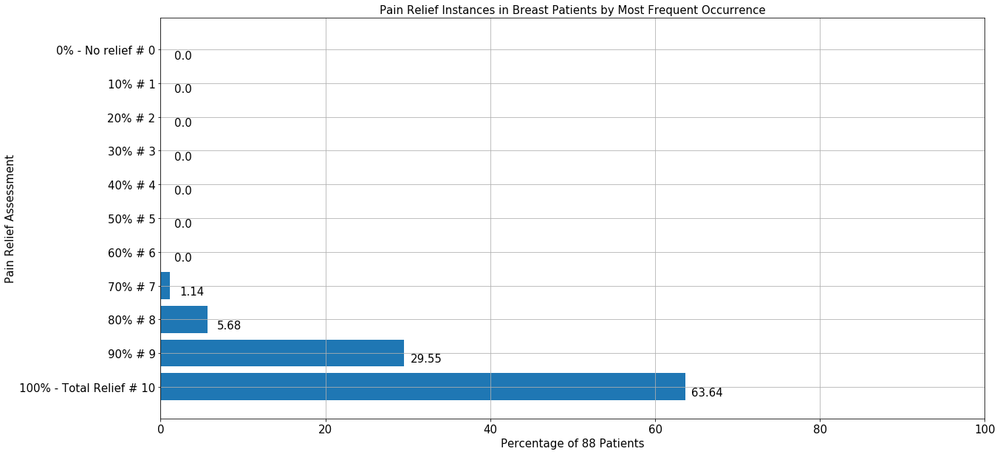

Num. of patients:  26


<Figure size 1440x720 with 0 Axes>

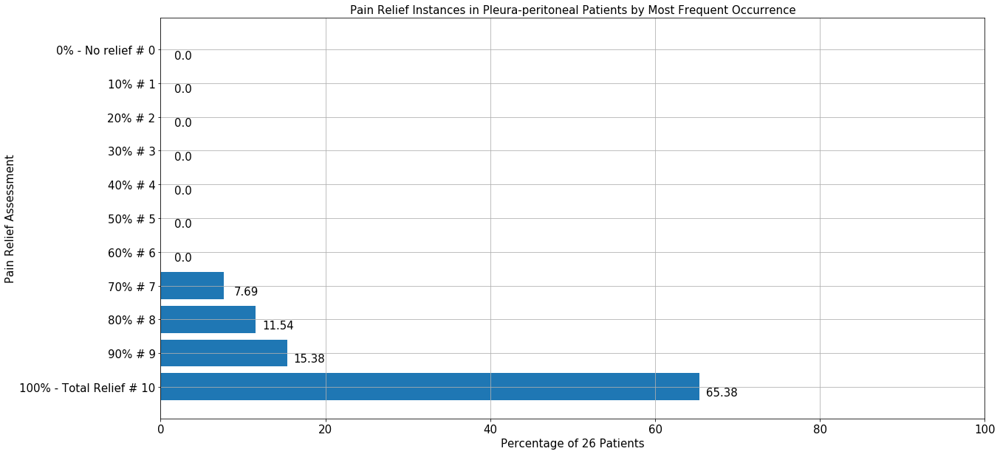

Num. of patients:  135


<Figure size 1440x720 with 0 Axes>

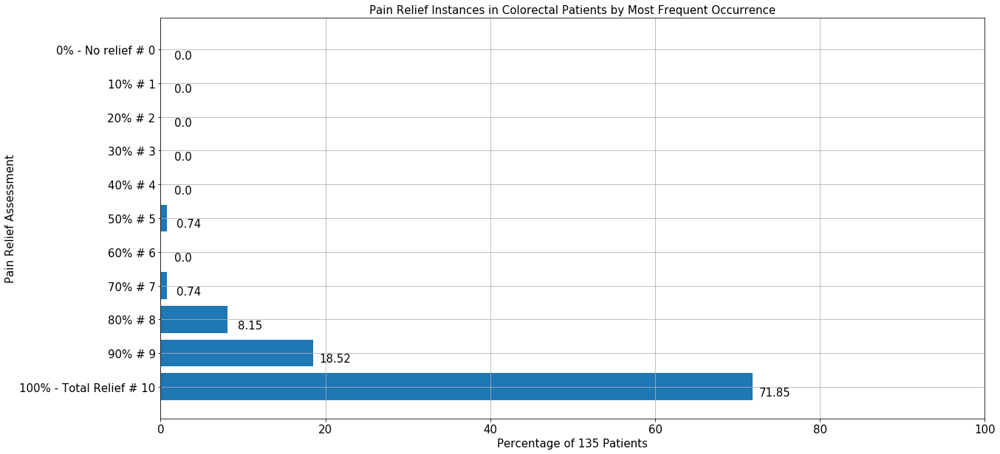

Num. of patients:  82


<Figure size 1440x720 with 0 Axes>

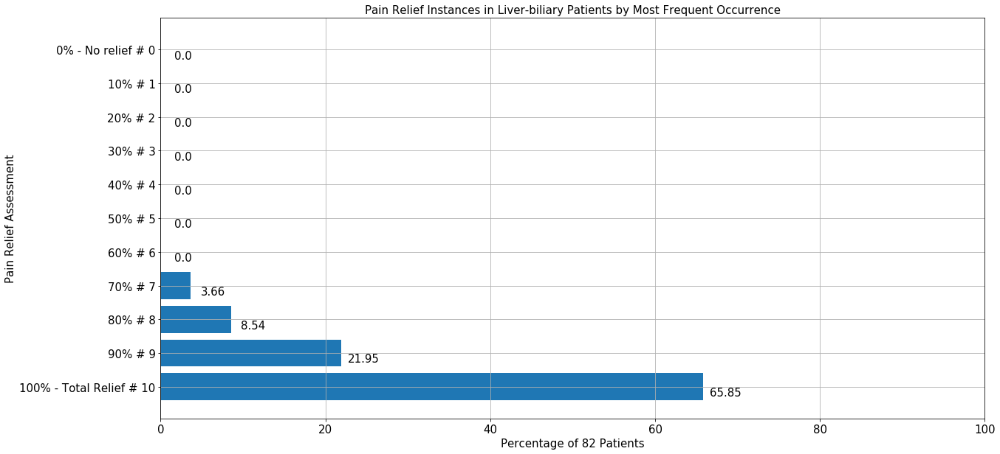

Num. of patients:  50


<Figure size 1440x720 with 0 Axes>

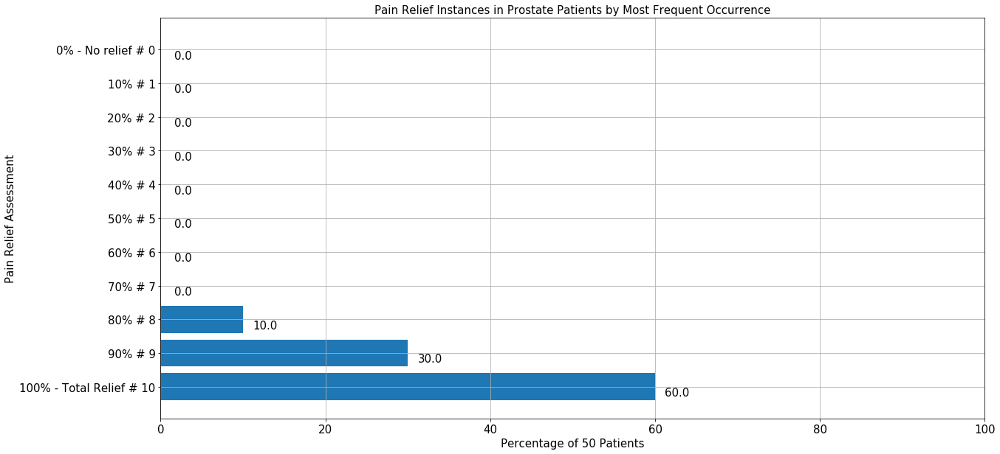

Num. of patients:  27


<Figure size 1440x720 with 0 Axes>

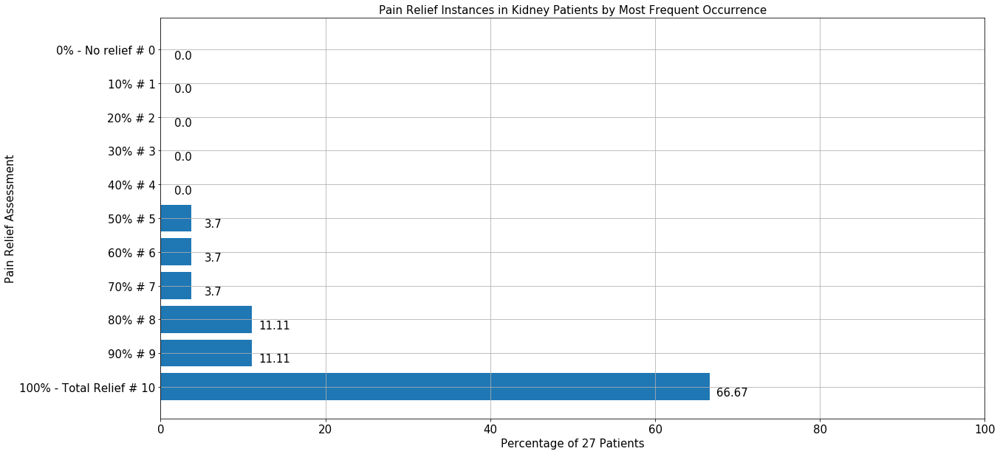

Num. of patients:  44


<Figure size 1440x720 with 0 Axes>

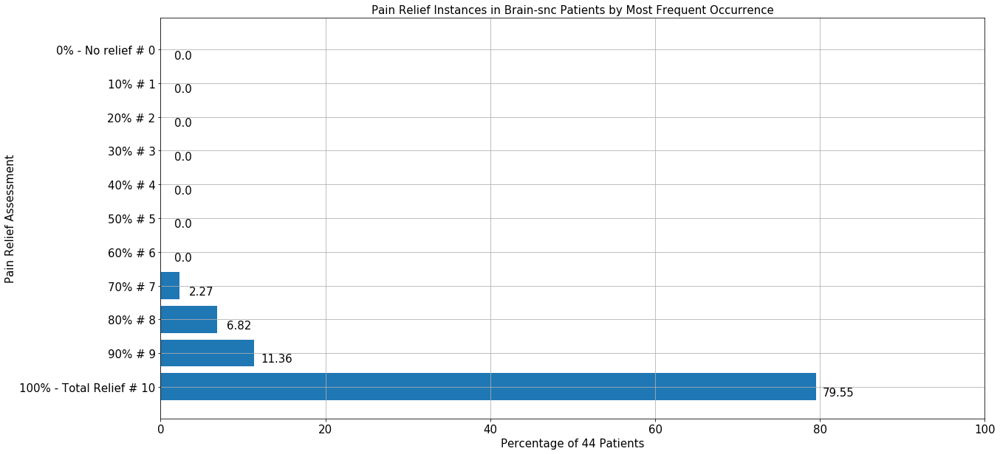

Num. of patients:  39


<Figure size 1440x720 with 0 Axes>

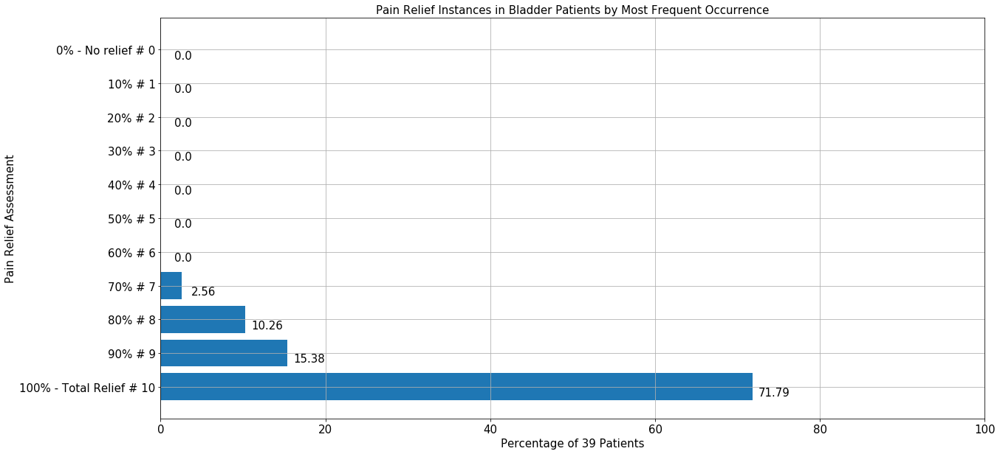

Num. of patients:  28


<Figure size 1440x720 with 0 Axes>

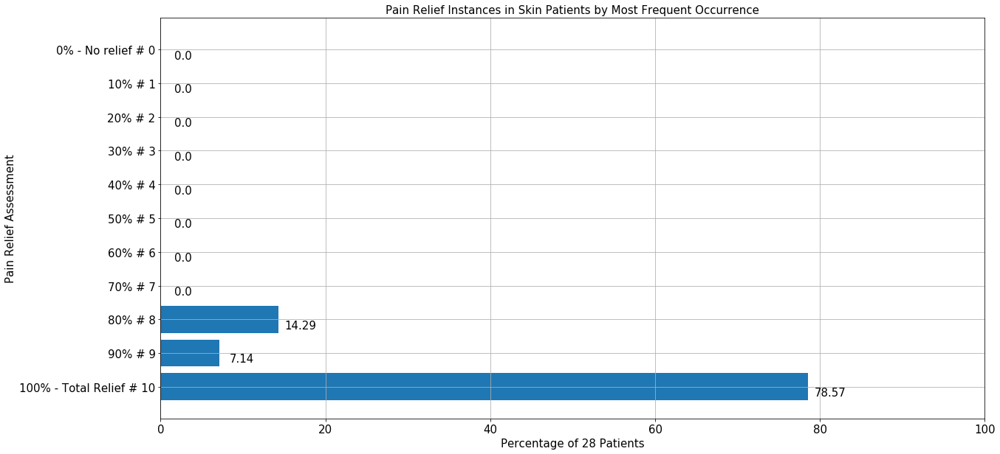

Num. of patients:  31


<Figure size 1440x720 with 0 Axes>

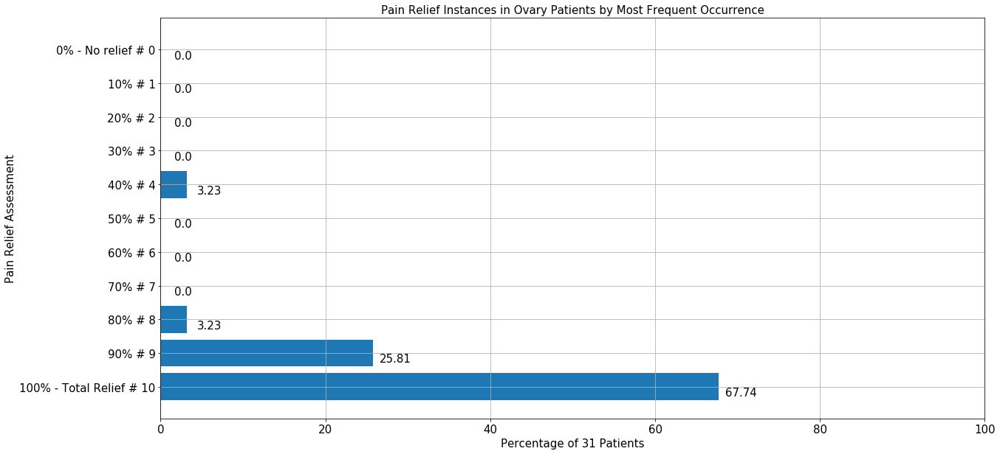

Num. of patients:  11


<Figure size 1440x720 with 0 Axes>

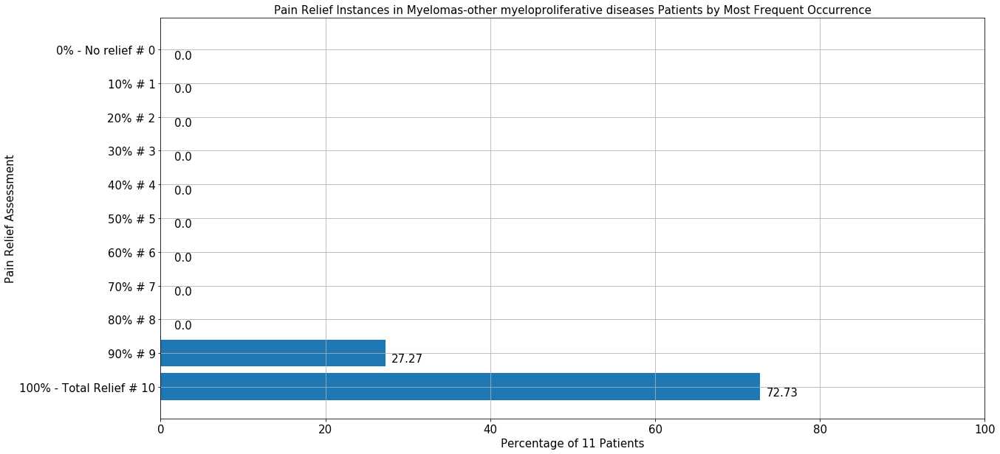

Num. of patients:  27


<Figure size 1440x720 with 0 Axes>

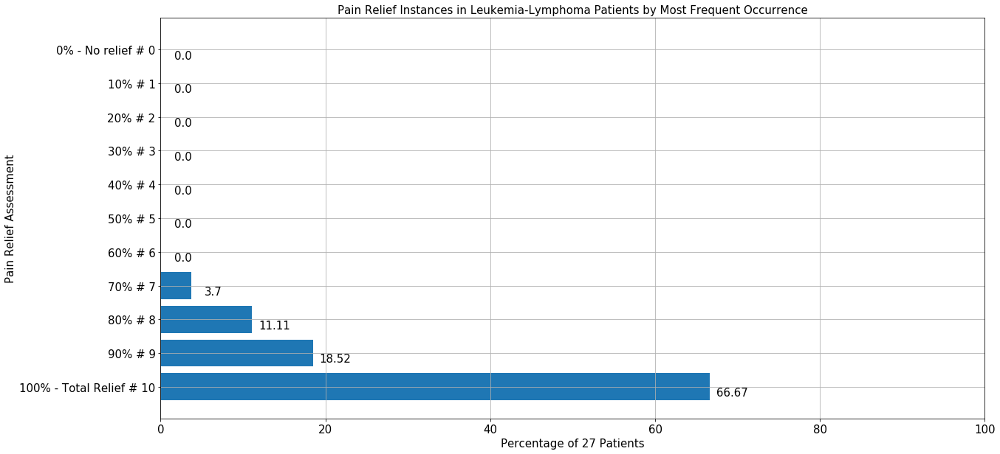

Num. of patients:  15


<Figure size 1440x720 with 0 Axes>

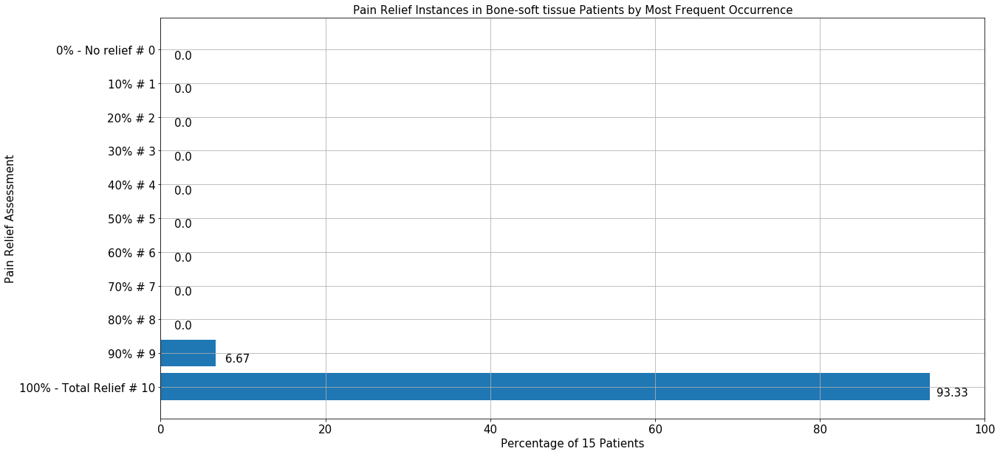

Num. of patients:  11


<Figure size 1440x720 with 0 Axes>

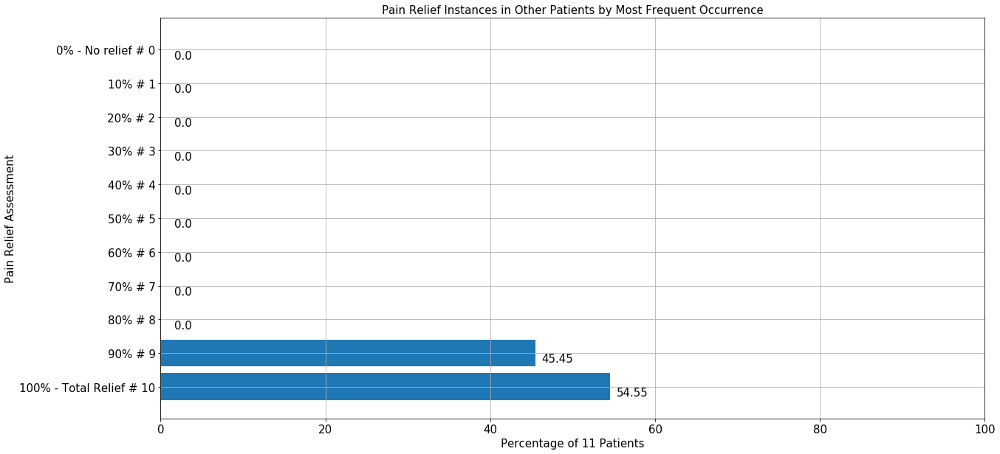

Num. of patients:  23


<Figure size 1440x720 with 0 Axes>

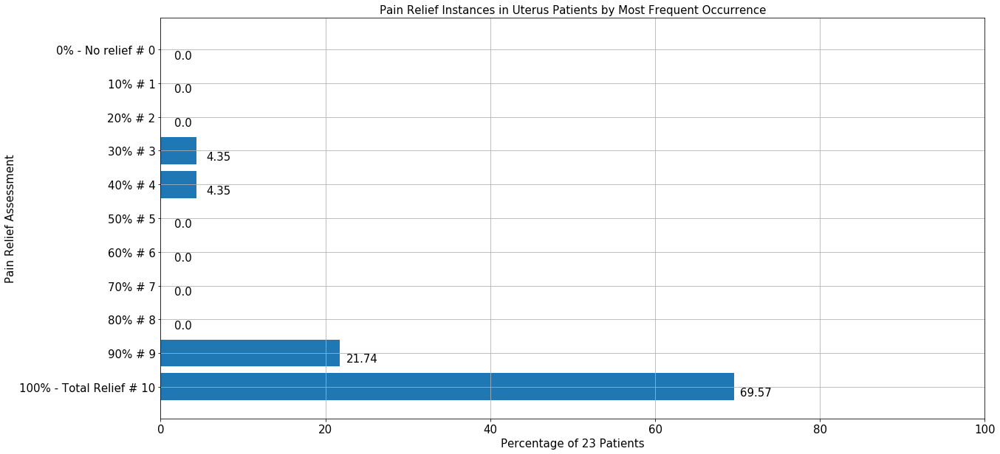

Num. of patients:  15


<Figure size 1440x720 with 0 Axes>

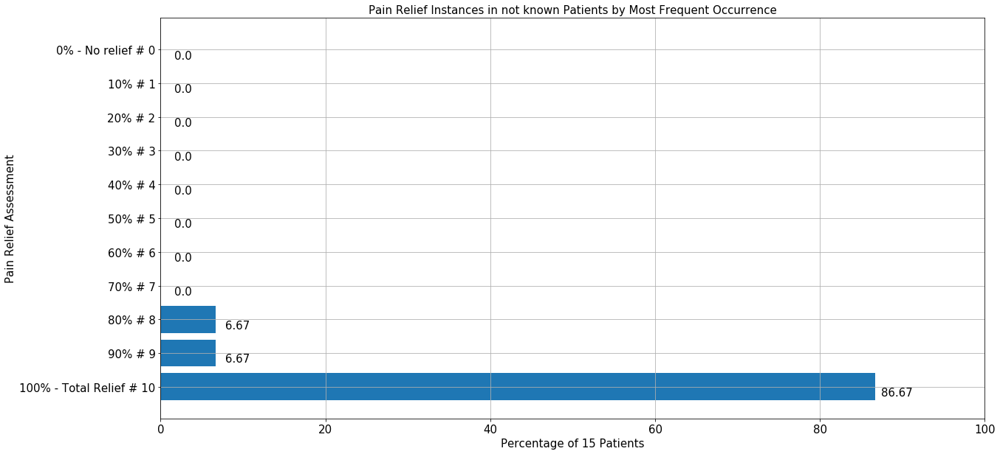

Num. of patients:  10


<Figure size 1440x720 with 0 Axes>

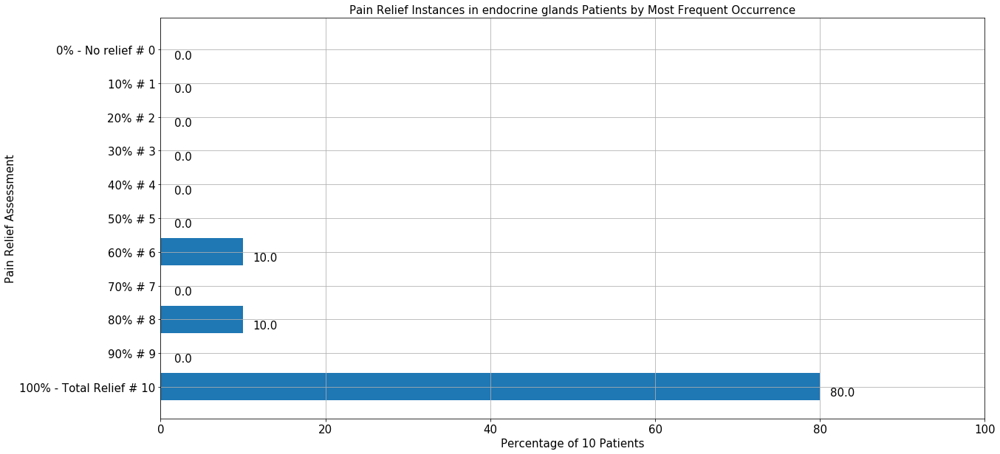

Num. of patients:  10


<Figure size 1440x720 with 0 Axes>

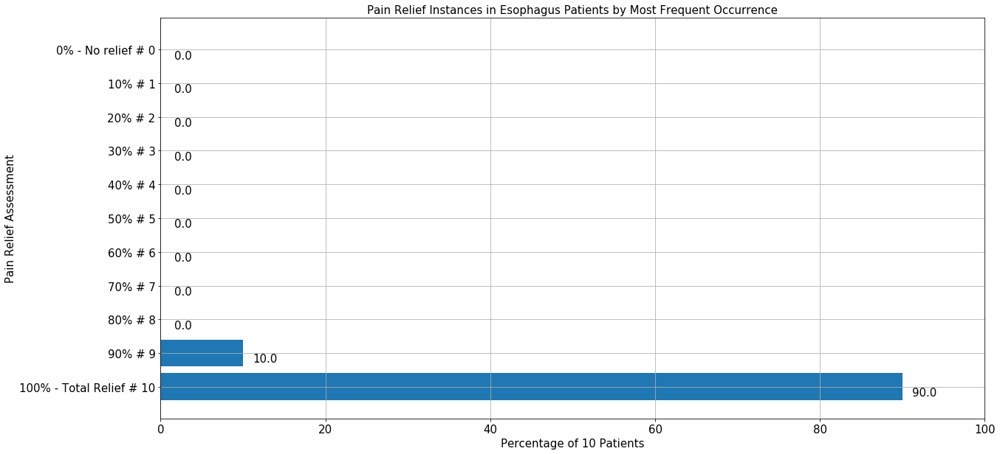

In [77]:
# sorting by IDEHR instead
def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_width()
        ax.annotate('{}'.format(height),
                    xy=(height, rect.get_y()),
                    xytext=(30, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

for cancer in cancers:
    if isinstance(cancer, np.float):
        continue
    df_pid = df_ptc[df_ptc['Diagnosis'] == cancer].PatientID
    df_pid = df_pid.reset_index().drop(['index'], axis=1)
    df_pain = df_obs.merge(df_pid, on=['PatientID'], how='inner')
    
    df_temp = df_pain[['idehr', 'PatientID', 'pain_relief']]
    df_temp = df_temp.groupby(['idehr', 'pain_relief']).size().reset_index(name='num_obs')
    df_temp = df_temp.sort_values(by=['idehr', 'num_obs'], ascending=[True, False]).groupby('idehr').first().reset_index()

    plt.rcParams['figure.figsize'] = [20, 10]
    matplotlib.rcParams.update({'font.size': 15})
    plt.figure()
    
    fig, ax = plt.subplots()
    labels = df_temp.pain_relief.value_counts(normalize=True).mul(100).round(2).reindex(df_obs['pain_relief'].dropna().unique(), fill_value=0)
#     label_errors = np.std(df_temp.num_obs.value_counts().reindex(df_obs['pain_relief'].dropna().unique(), fill_value=0).values)
    
    print("Num. of patients: ", len(df_temp.idehr.unique()))
#     print("Std. Dev.: ", label_errors)
    
    bar1 = ax.barh(pd.Index(['100% - Total Relief # 10', '90% # 9', '80% # 8', '70% # 7', '60% # 6',
           '50% # 5', '40% # 4', '30% # 3', '20% # 2', '10% # 1', '0% - No relief # 0'], dtype='object'), labels)
    ax.set_ylabel('Pain Relief Assessment', fontsize=15)
    ax.set_xlabel('Percentage of ' + str(len(df_temp.idehr.unique())) + ' Patients', fontsize=15)
    ax.set_title('Pain Relief Instances in ' + cancer + ' Patients by Most Frequent Occurrence', fontsize=15)
    ax.set_xlim(0, 100)
    autolabel(bar1)
    plt.grid()
    plt.savefig("./graphs/pain relief/pain_" + str(cancer) + ".png")
    plt.show()

Num. of patients:  2181


<Figure size 1440x720 with 0 Axes>

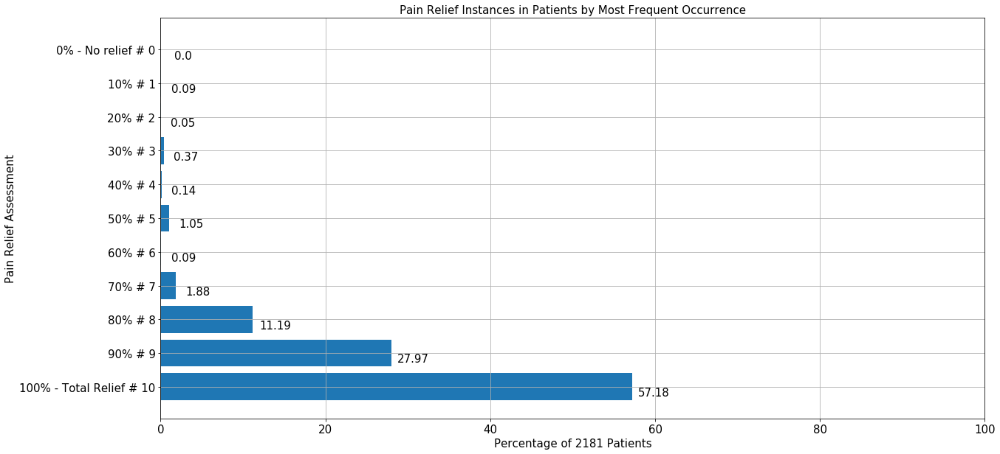

In [78]:
# for all patients (IDEHRs)
df_pid = df_ptc.PatientID
df_pid = df_pid.reset_index().drop(['index'], axis=1)
df_pain = df_obs.merge(df_pid, on=['PatientID'], how='inner')

df_temp = df_pain[['idehr', 'PatientID', 'pain_relief']]
df_temp = df_temp.groupby(['idehr', 'pain_relief']).size().reset_index(name='num_obs')
df_temp = df_temp.sort_values(by=['idehr', 'num_obs'], ascending=[True, False]).groupby('idehr').first().reset_index()

plt.rcParams['figure.figsize'] = [20, 10]
matplotlib.rcParams.update({'font.size': 15})
plt.figure()

fig, ax = plt.subplots()
labels = df_temp.pain_relief.value_counts(normalize=True).mul(100).round(2).reindex(df_obs['pain_relief'].dropna().unique(), fill_value=0)
#     label_errors = np.std(df_temp.num_obs.value_counts().reindex(df_obs['pain_relief'].dropna().unique(), fill_value=0).values)

print("Num. of patients: ", len(df_temp.idehr.unique()))
#     print("Std. Dev.: ", label_errors)

bar1 = ax.barh(pd.Index(['100% - Total Relief # 10', '90% # 9', '80% # 8', '70% # 7', '60% # 6',
       '50% # 5', '40% # 4', '30% # 3', '20% # 2', '10% # 1', '0% - No relief # 0'], dtype='object'), labels)
ax.set_ylabel('Pain Relief Assessment', fontsize=15)
ax.set_xlabel('Percentage of ' + str(len(df_temp.idehr.unique())) + ' Patients', fontsize=15)
ax.set_title('Pain Relief Instances in Patients by Most Frequent Occurrence', fontsize=15)
ax.set_xlim(0, 100)
autolabel(bar1)
plt.grid()
plt.savefig("./graphs/pain relief/pain_relief.png")
plt.show()

Number of AMB patients:  2122
Number of Non-AMB patients:  58


<Figure size 1440x720 with 0 Axes>

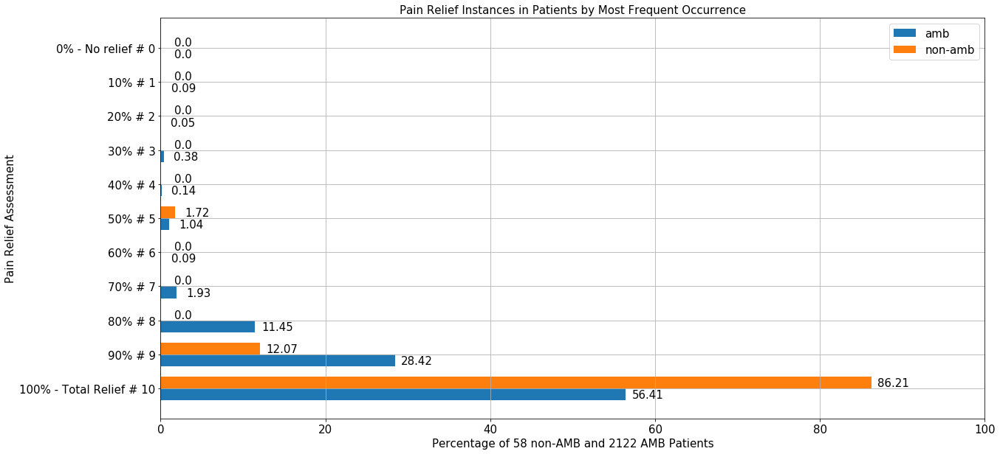

In [88]:
def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_width()
        ax.annotate('{}'.format(height),
                    xy=(height, rect.get_y()),
                    xytext=(30, 0),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')
        
# amb vs non-amb for all IDEHRs
df_pid_0 = df_ptc[df_ptc['AMB'] == 0]
df_pid_1 = df_ptc[df_ptc['AMB'] == 1]
df_pid_0 = df_pid_0.PatientID
df_pid_0 = df_pid_0.reset_index().drop(['index'], axis=1)
df_pain_0 = df_obs.merge(df_pid_0, on=['PatientID'], how='inner').dropna(subset=['pain_relief'])
df_pid_1 = df_pid_1.PatientID
df_pid_1 = df_pid_1.reset_index().drop(['index'], axis=1)
df_pain_1 = df_obs.merge(df_pid_1, on=['PatientID'], how='inner').dropna(subset=['pain_relief'])

df_temp_0 = df_pain_0[['idehr', 'PatientID', 'pain_relief']]
df_temp_0 = df_temp_0.groupby(['idehr', 'pain_relief']).size().reset_index(name='num_obs')
df_temp_0 = df_temp_0.sort_values(by=['idehr', 'num_obs'], ascending=[True, False]).groupby('idehr').first().reset_index()
df_temp_1 = df_pain_1[['idehr', 'PatientID', 'pain_relief']]
df_temp_1 = df_temp_1.groupby(['idehr', 'pain_relief']).size().reset_index(name='num_obs')
df_temp_1 = df_temp_1.sort_values(by=['idehr', 'num_obs'], ascending=[True, False]).groupby('idehr').first().reset_index()

plt.rcParams['figure.figsize'] = [20, 10]
matplotlib.rcParams.update({'font.size': 15})
plt.figure()
labels = pd.Index(['100% - Total Relief # 10', '90% # 9', '80% # 8', '70% # 7', '60% # 6',
       '50% # 5', '40% # 4', '30% # 3', '20% # 2', '10% # 1', '0% - No relief # 0'], dtype='object')
x = np.arange(len(labels))
width = 0.35

print('Number of AMB patients: ', len(df_temp_1.idehr.unique()))
print('Number of Non-AMB patients: ', len(df_temp_0.idehr.unique()))
fig, ax = plt.subplots()
non_amb = df_temp_0['pain_relief'].value_counts(normalize=True).mul(100).round(2).reindex(df_obs['pain_relief'].dropna().unique(), fill_value=0)
amb = df_temp_1['pain_relief'].value_counts(normalize=True).mul(100).round(2).reindex(df_obs['pain_relief'].dropna().unique(), fill_value=0)
bar1 = ax.barh(x - width/2, amb, width, label='amb')
bar2 = ax.barh(x + width/2, non_amb, width, label='non-amb')
ax.set_ylabel('Pain Relief Assessment', fontsize=15)
ax.set_xlabel('Percentage of ' + str(len(df_temp_0.idehr.unique())) + ' non-AMB and ' + str(len(df_temp_1.idehr.unique())) + ' AMB Patients' , fontsize=15)
ax.set_title('Pain Relief Instances in Patients by Most Frequent Occurrence', fontsize=15)
ax.set_yticks(x)
ax.set_yticklabels(labels)
ax.set_xlim(0, 100)
ax.legend()
autolabel(bar1)
autolabel(bar2)
plt.grid()
plt.savefig("./graphs/pain relief/pain_relief_amb.png")
plt.show()

Number of EHR patients:  1036
Number of Non-EHR patients:  1167


<Figure size 1440x720 with 0 Axes>

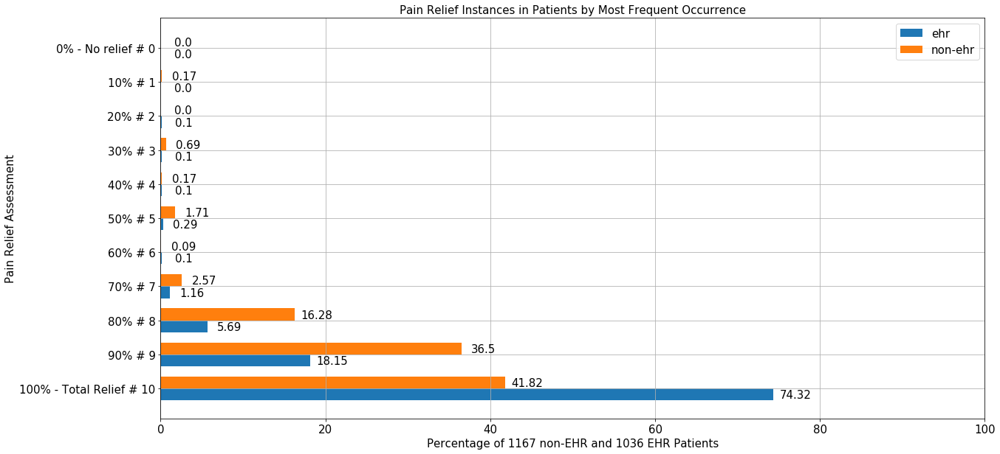

In [89]:
# ehr vs non-ehr for all IDEHRs
df_pid_0 = df_ptc[df_ptc['EHR'] == 0]
df_pid_1 = df_ptc[df_ptc['EHR'] == 1]
df_pid_0 = df_pid_0.PatientID
df_pid_0 = df_pid_0.reset_index().drop(['index'], axis=1)
df_pain_0 = df_obs.merge(df_pid_0, on=['PatientID'], how='inner').dropna(subset=['pain_relief'])
df_pid_1 = df_pid_1.PatientID
df_pid_1 = df_pid_1.reset_index().drop(['index'], axis=1)
df_pain_1 = df_obs.merge(df_pid_1, on=['PatientID'], how='inner').dropna(subset=['pain_relief'])

df_temp_0 = df_pain_0[['idehr', 'PatientID', 'pain_relief']]
df_temp_0 = df_temp_0.groupby(['idehr', 'pain_relief']).size().reset_index(name='num_obs')
df_temp_0 = df_temp_0.sort_values(by=['idehr', 'num_obs'], ascending=[True, False]).groupby('idehr').first().reset_index()
df_temp_1 = df_pain_1[['idehr', 'PatientID', 'pain_relief']]
df_temp_1 = df_temp_1.groupby(['idehr', 'pain_relief']).size().reset_index(name='num_obs')
df_temp_1 = df_temp_1.sort_values(by=['idehr', 'num_obs'], ascending=[True, False]).groupby('idehr').first().reset_index()

plt.rcParams['figure.figsize'] = [20, 10]
matplotlib.rcParams.update({'font.size': 15})
plt.figure()
labels = pd.Index(['100% - Total Relief # 10', '90% # 9', '80% # 8', '70% # 7', '60% # 6',
       '50% # 5', '40% # 4', '30% # 3', '20% # 2', '10% # 1', '0% - No relief # 0'], dtype='object')
x = np.arange(len(labels))
width = 0.35

print('Number of EHR patients: ', len(df_temp_1.idehr.unique()))
print('Number of Non-EHR patients: ', len(df_temp_0.idehr.unique()))
fig, ax = plt.subplots()
non_amb = df_temp_0['pain_relief'].value_counts(normalize=True).mul(100).round(2).reindex(df_obs['pain_relief'].dropna().unique(), fill_value=0)
amb = df_temp_1['pain_relief'].value_counts(normalize=True).mul(100).round(2).reindex(df_obs['pain_relief'].dropna().unique(), fill_value=0)
bar1 = ax.barh(x - width/2, amb, width, label='ehr')
bar2 = ax.barh(x + width/2, non_amb, width, label='non-ehr')
ax.set_ylabel('Pain Relief Assessment', fontsize=15)
ax.set_xlabel('Percentage of ' + str(len(df_temp_0.idehr.unique())) + ' non-EHR and ' + str(len(df_temp_1.idehr.unique())) + ' EHR Patients' , fontsize=15)
ax.set_title('Pain Relief Instances in Patients by Most Frequent Occurrence', fontsize=15)
ax.set_yticks(x)
ax.set_yticklabels(labels)
ax.set_xlim(0, 100)
ax.legend()
autolabel(bar1)
autolabel(bar2)
plt.savefig("./graphs/pain relief/pain_relief_ehr.png")
plt.grid()
plt.show()

Number of AMB patients:  49
Number of Non-AMB patients:  0


<Figure size 1440x720 with 0 Axes>

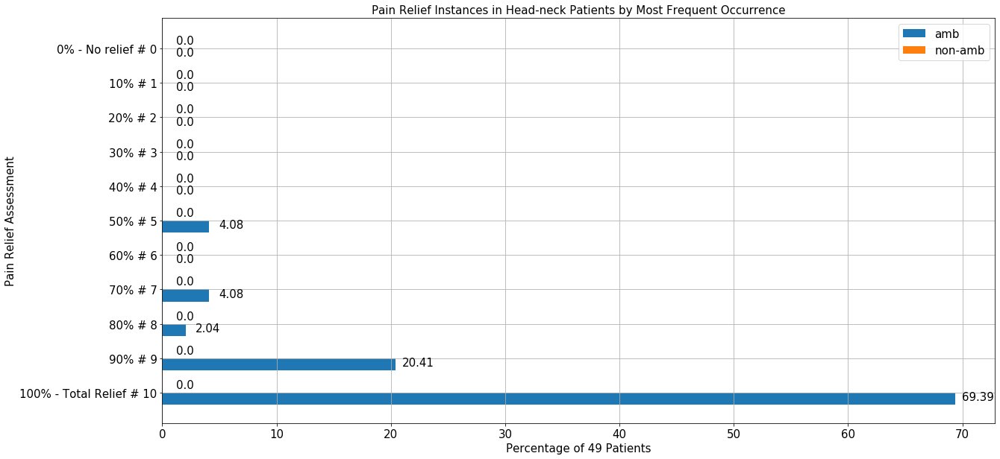

Number of AMB patients:  39
Number of Non-AMB patients:  2


<Figure size 1440x720 with 0 Axes>

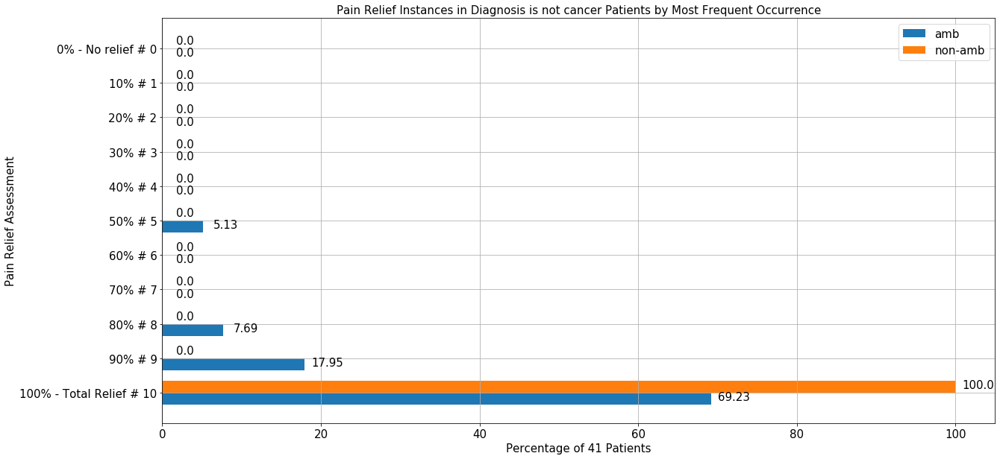

Number of AMB patients:  61
Number of Non-AMB patients:  4


<Figure size 1440x720 with 0 Axes>

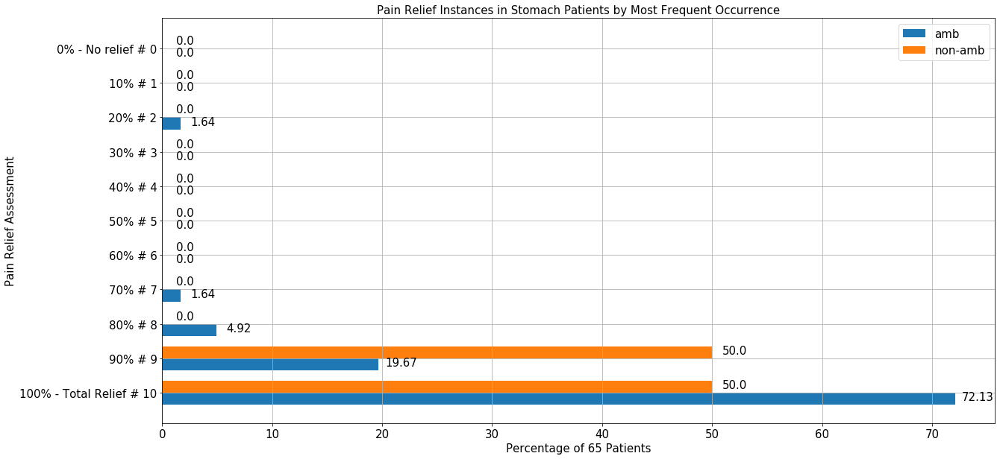

Number of AMB patients:  200
Number of Non-AMB patients:  14


<Figure size 1440x720 with 0 Axes>

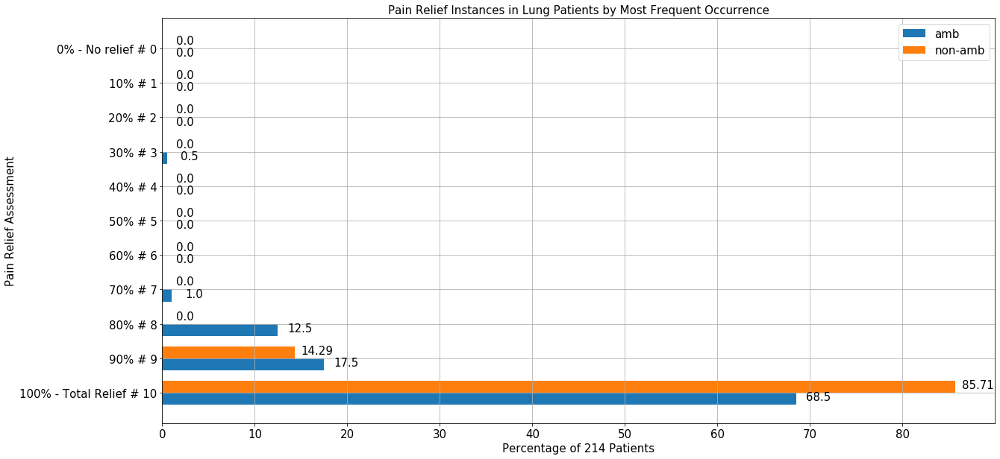

Number of AMB patients:  122
Number of Non-AMB patients:  6


<Figure size 1440x720 with 0 Axes>

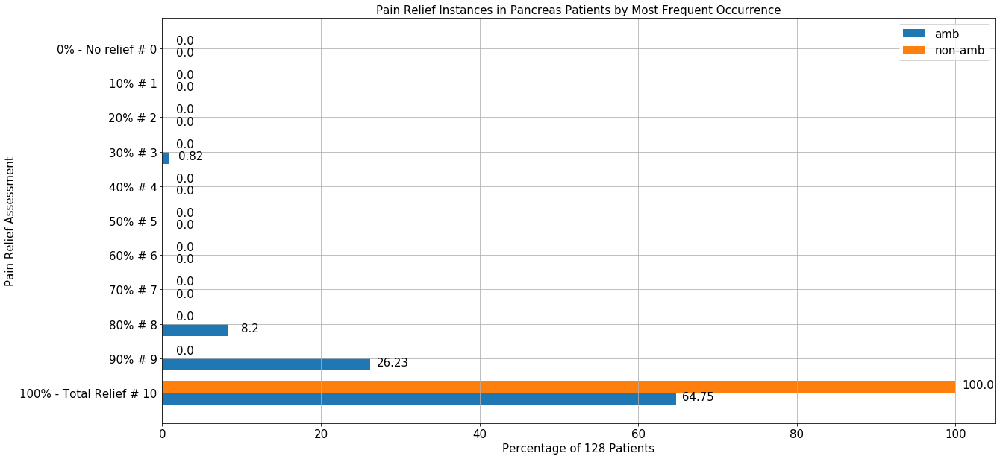

Number of AMB patients:  84
Number of Non-AMB patients:  4


<Figure size 1440x720 with 0 Axes>

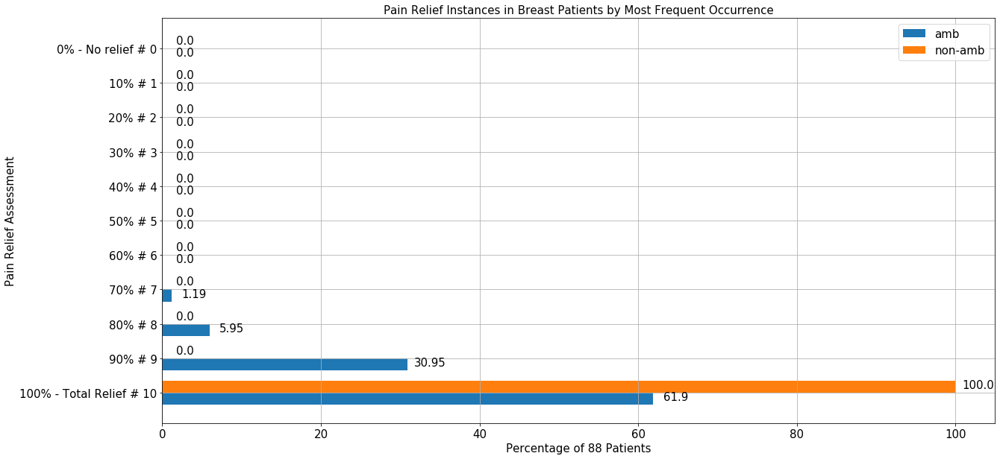

Number of AMB patients:  25
Number of Non-AMB patients:  1


<Figure size 1440x720 with 0 Axes>

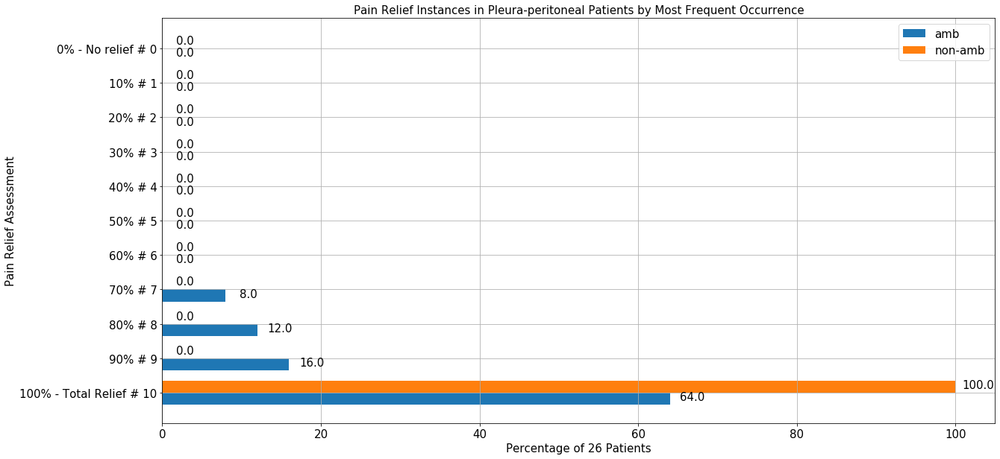

Number of AMB patients:  129
Number of Non-AMB patients:  6


<Figure size 1440x720 with 0 Axes>

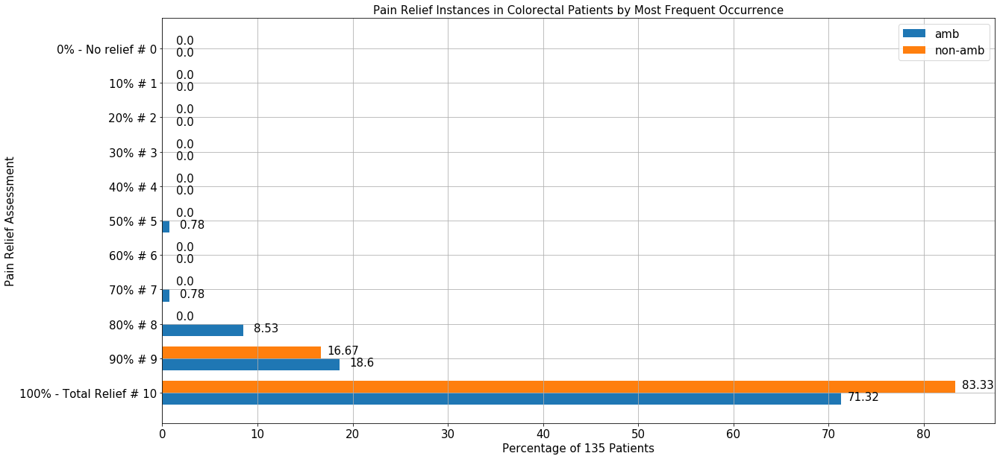

Number of AMB patients:  77
Number of Non-AMB patients:  5


<Figure size 1440x720 with 0 Axes>

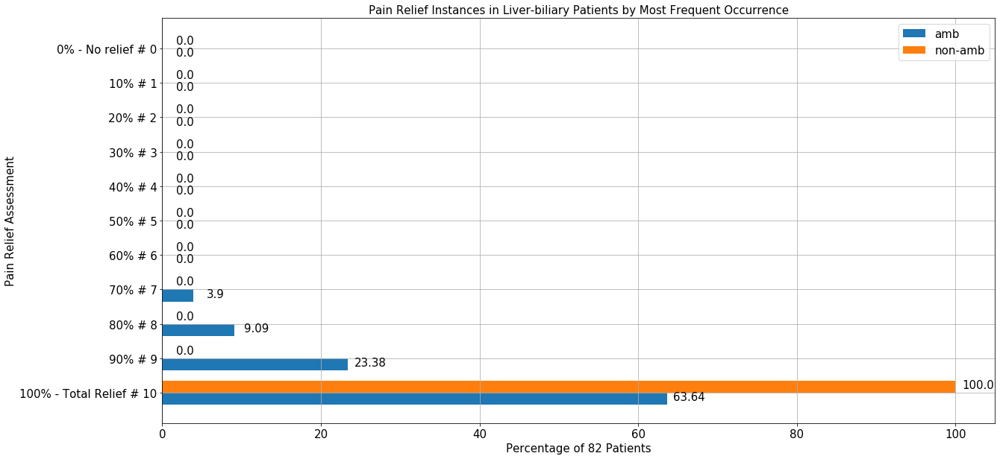

Number of AMB patients:  47
Number of Non-AMB patients:  3


<Figure size 1440x720 with 0 Axes>

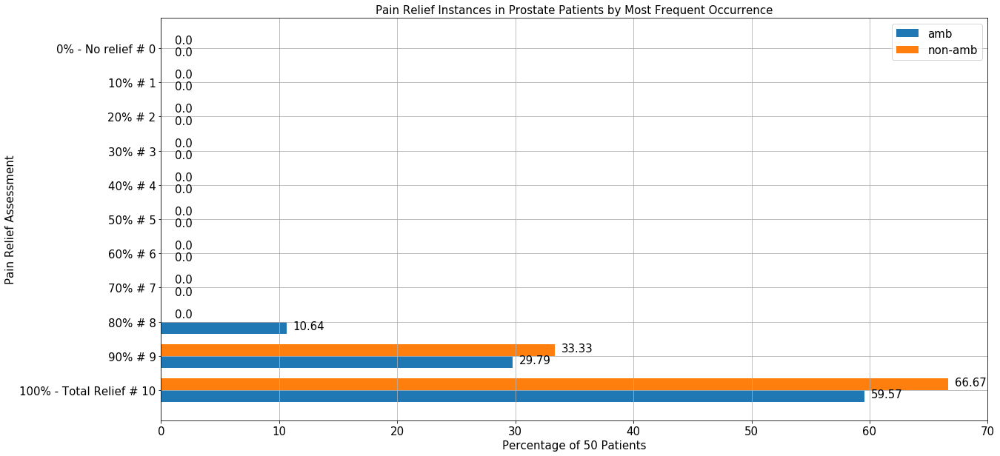

Number of AMB patients:  25
Number of Non-AMB patients:  2


<Figure size 1440x720 with 0 Axes>

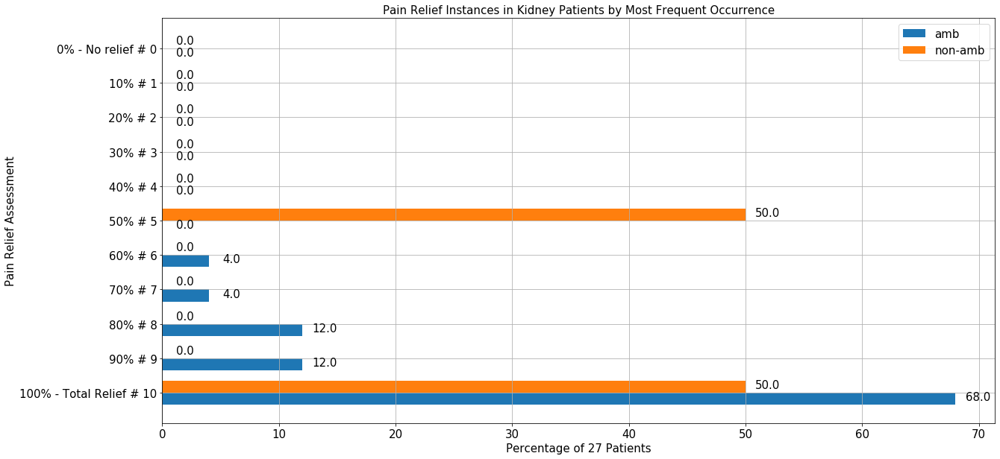

Number of AMB patients:  41
Number of Non-AMB patients:  3


<Figure size 1440x720 with 0 Axes>

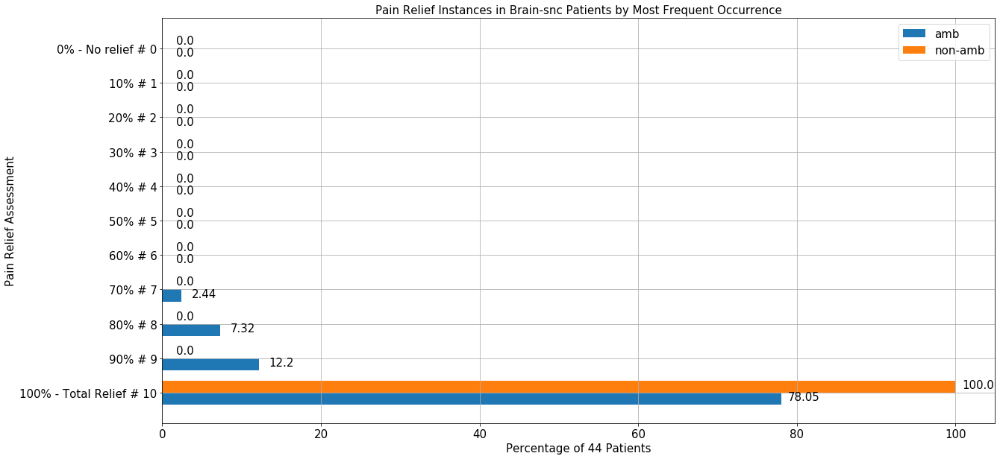

Number of AMB patients:  37
Number of Non-AMB patients:  2


<Figure size 1440x720 with 0 Axes>

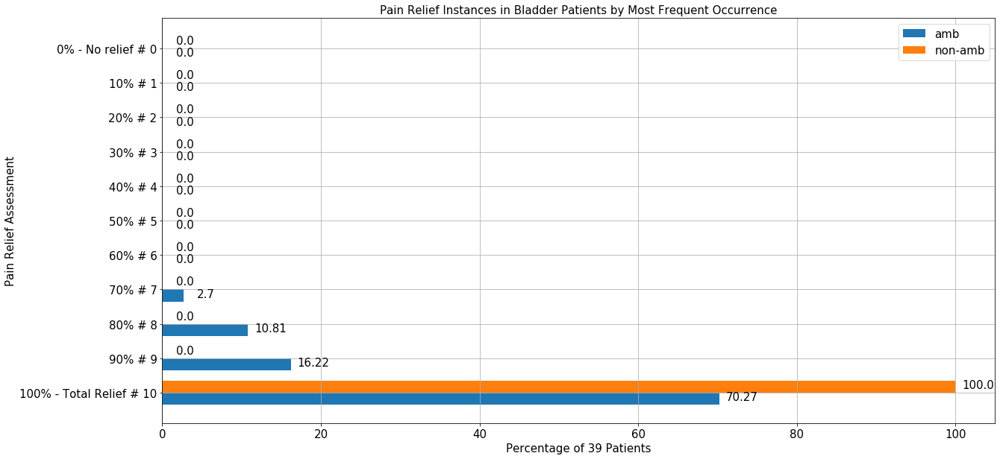

Number of AMB patients:  28
Number of Non-AMB patients:  0


<Figure size 1440x720 with 0 Axes>

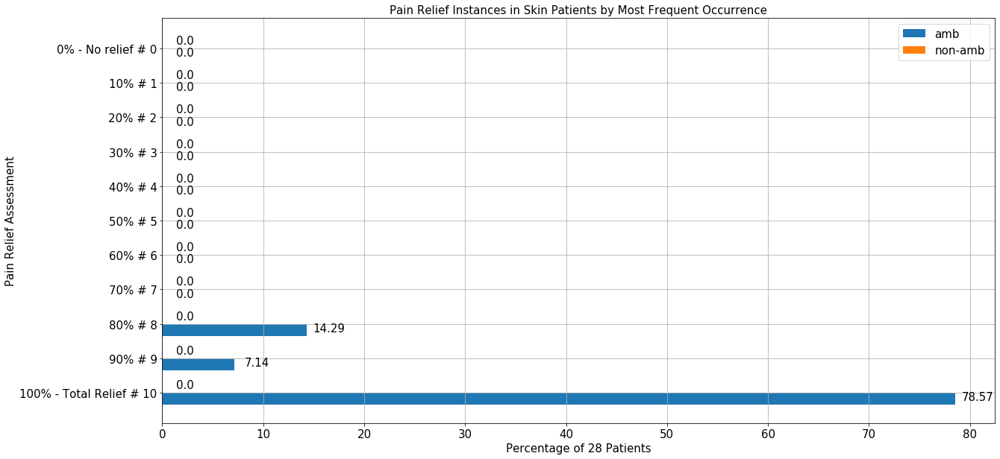

Number of AMB patients:  30
Number of Non-AMB patients:  1


<Figure size 1440x720 with 0 Axes>

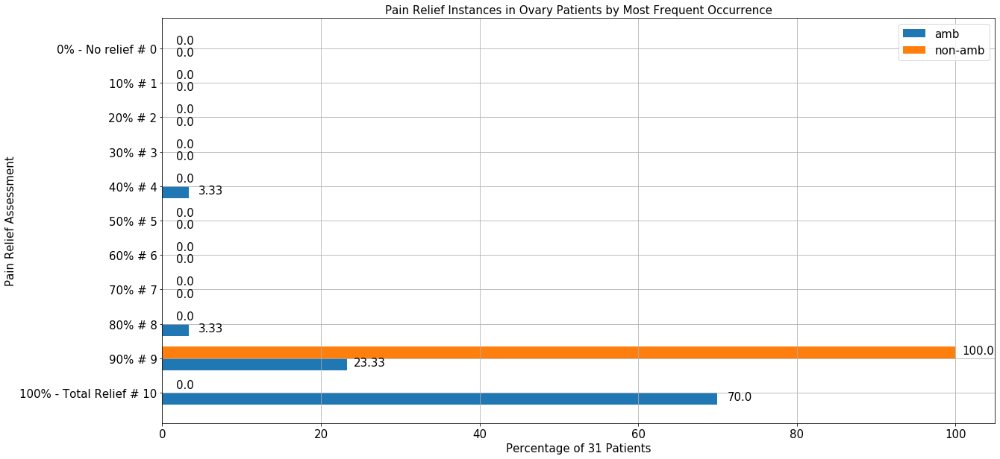

Number of AMB patients:  10
Number of Non-AMB patients:  1


<Figure size 1440x720 with 0 Axes>

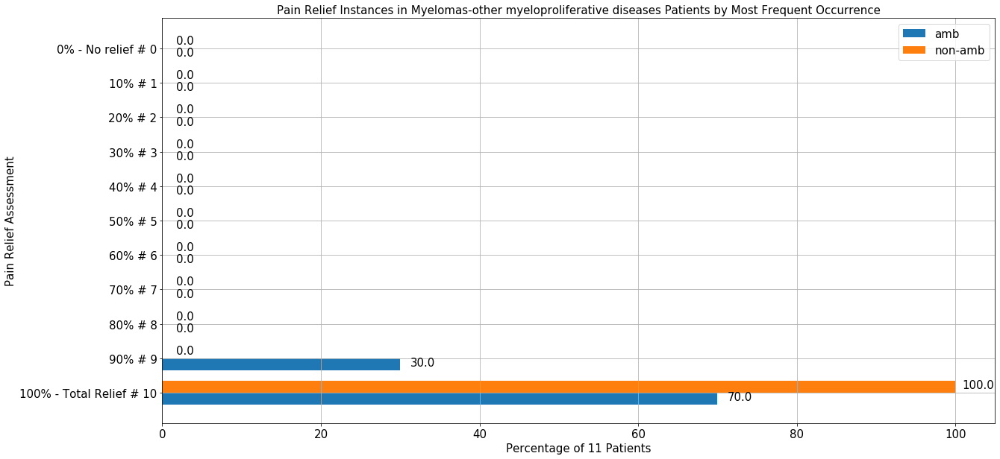

Number of AMB patients:  26
Number of Non-AMB patients:  1


<Figure size 1440x720 with 0 Axes>

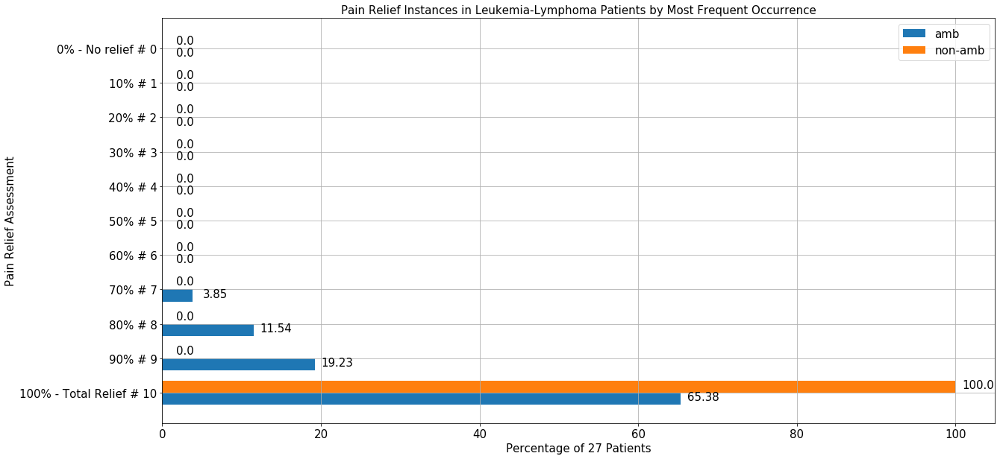

Number of AMB patients:  15
Number of Non-AMB patients:  0


<Figure size 1440x720 with 0 Axes>

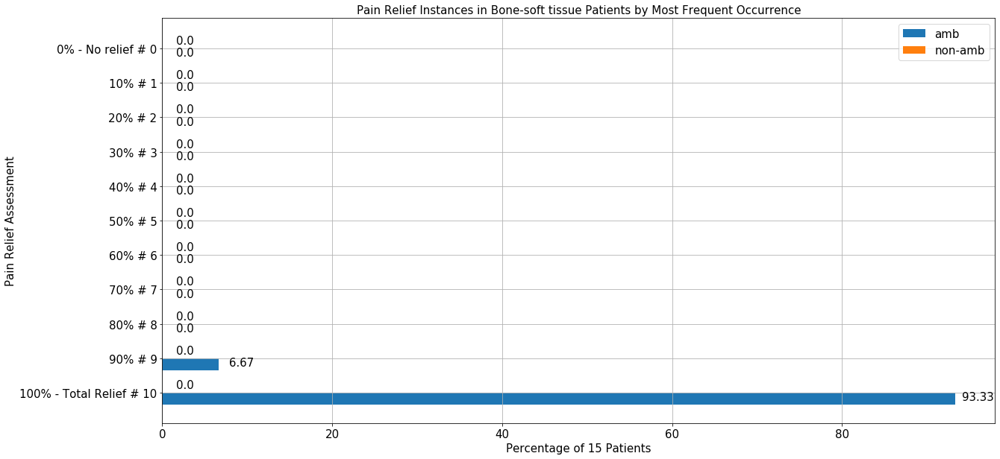

Number of AMB patients:  11
Number of Non-AMB patients:  0


<Figure size 1440x720 with 0 Axes>

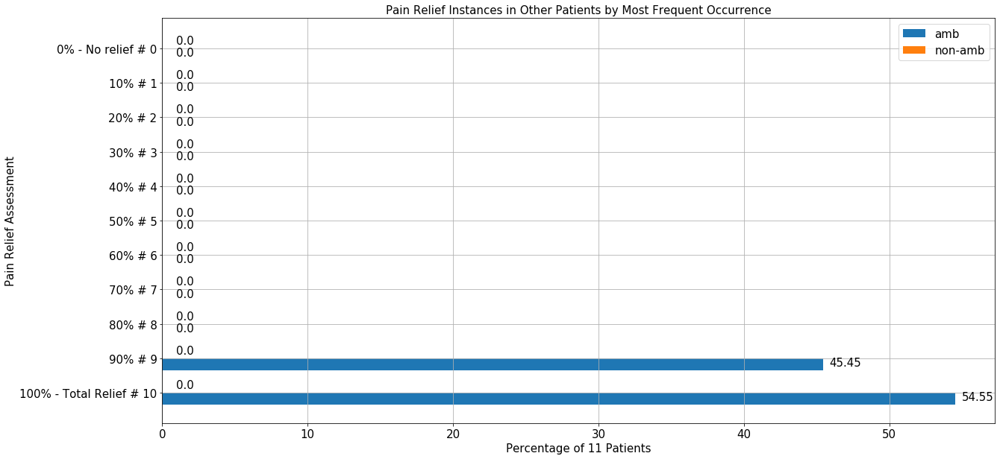

Number of AMB patients:  22
Number of Non-AMB patients:  1


<Figure size 1440x720 with 0 Axes>

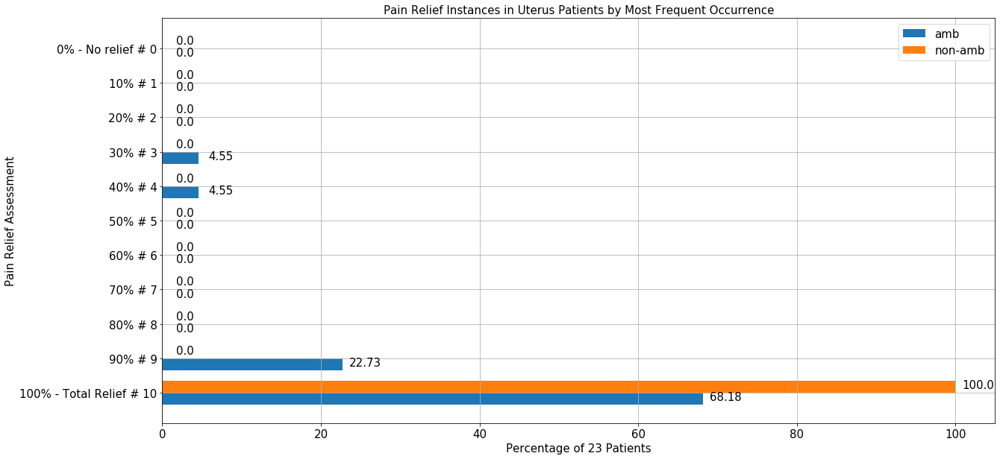

Number of AMB patients:  14
Number of Non-AMB patients:  1


<Figure size 1440x720 with 0 Axes>

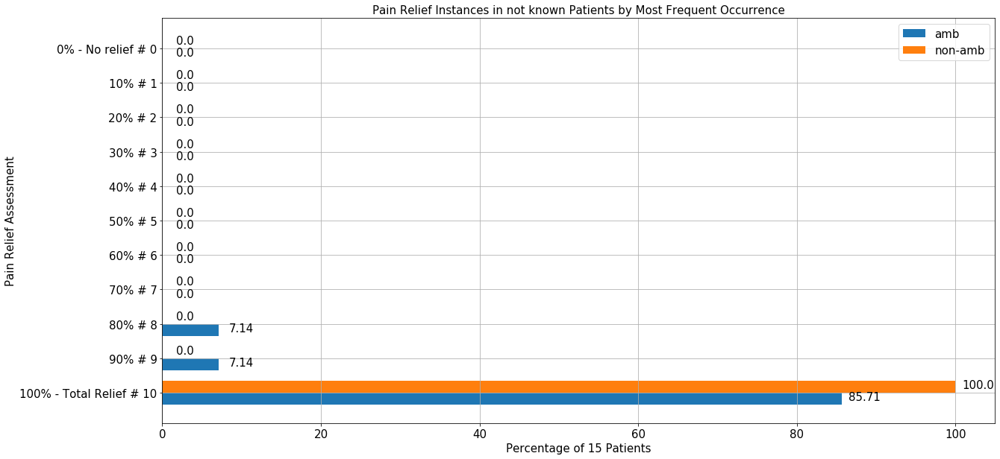

Number of AMB patients:  10
Number of Non-AMB patients:  0


<Figure size 1440x720 with 0 Axes>

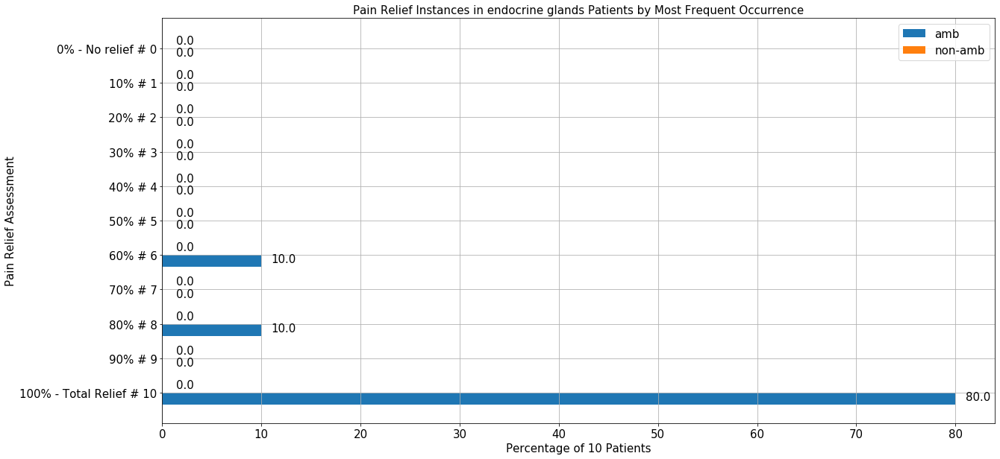

Number of AMB patients:  10
Number of Non-AMB patients:  0


<Figure size 1440x720 with 0 Axes>

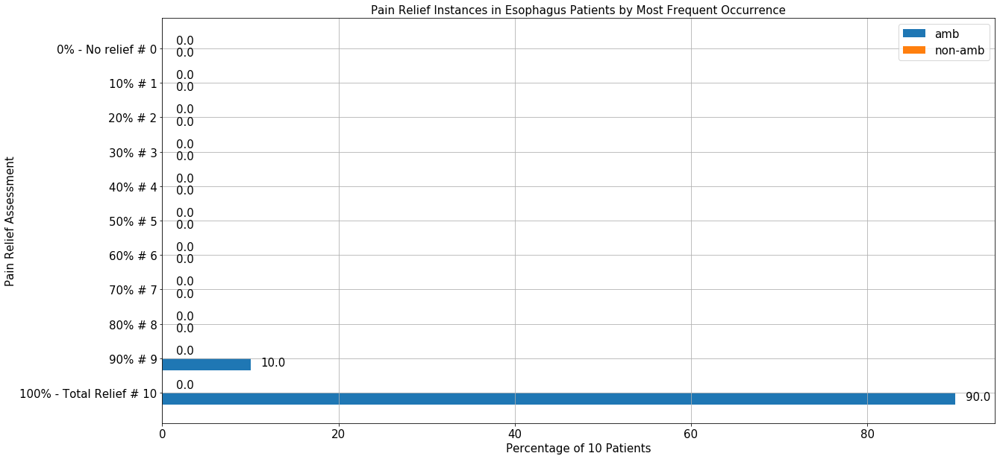

In [66]:
# amb vs non-amb grouped by IDEHR
for cancer in cancers:
    if isinstance(cancer, np.float):
        continue
    df_pid_0 = df_ptc[df_ptc['AMB'] == 0]
    df_pid_1 = df_ptc[df_ptc['AMB'] == 1]
    df_pid_0 = df_pid_0[df_pid_0['Diagnosis'] == cancer].PatientID
    df_pid_0 = df_pid_0.reset_index().drop(['index'], axis=1)
    df_pain_0 = df_obs.merge(df_pid_0, on=['PatientID'], how='inner').dropna(subset=['pain_relief'])
    df_pid_1 = df_pid_1[df_pid_1['Diagnosis'] == cancer].PatientID
    df_pid_1 = df_pid_1.reset_index().drop(['index'], axis=1)
    df_pain_1 = df_obs.merge(df_pid_1, on=['PatientID'], how='inner').dropna(subset=['pain_relief'])
    
    df_temp_0 = df_pain_0[['idehr', 'PatientID', 'pain_relief']]
    df_temp_0 = df_temp_0.groupby(['idehr', 'pain_relief']).size().reset_index(name='num_obs')
    df_temp_0 = df_temp_0.sort_values(by=['idehr', 'num_obs'], ascending=[True, False]).groupby('idehr').first().reset_index()
    df_temp_1 = df_pain_1[['idehr', 'PatientID', 'pain_relief']]
    df_temp_1 = df_temp_1.groupby(['idehr', 'pain_relief']).size().reset_index(name='num_obs')
    df_temp_1 = df_temp_1.sort_values(by=['idehr', 'num_obs'], ascending=[True, False]).groupby('idehr').first().reset_index()
    
    plt.rcParams['figure.figsize'] = [20, 10]
    matplotlib.rcParams.update({'font.size': 15})
    plt.figure()
    labels = pd.Index(['100% - Total Relief # 10', '90% # 9', '80% # 8', '70% # 7', '60% # 6',
           '50% # 5', '40% # 4', '30% # 3', '20% # 2', '10% # 1', '0% - No relief # 0'], dtype='object')
    x = np.arange(len(labels))
    width = 0.35
    
    print('Number of AMB patients: ', len(df_temp_1.idehr.unique()))
    print('Number of Non-AMB patients: ', len(df_temp_0.idehr.unique()))
    fig, ax = plt.subplots()
    non_amb = df_temp_0['pain_relief'].value_counts(normalize=True).mul(100).round(2).reindex(df_obs['pain_relief'].dropna().unique(), fill_value=0)
    amb = df_temp_1['pain_relief'].value_counts(normalize=True).mul(100).round(2).reindex(df_obs['pain_relief'].dropna().unique(), fill_value=0)
    bar1 = ax.barh(x - width/2, amb, width, label='amb')
    bar2 = ax.barh(x + width/2, non_amb, width, label='non-amb')
    ax.set_ylabel('Pain Relief Assessment', fontsize=15)
    ax.set_xlabel('Percentage of ' + str(len(df_temp_0.idehr.unique()) + len(df_temp_1.idehr.unique())) + ' Patients' , fontsize=15)
    ax.set_title('Pain Relief Instances in ' + cancer + ' Patients by Most Frequent Occurrence', fontsize=15)
    ax.set_yticks(x)
    ax.set_yticklabels(labels)
    ax.legend()
    autolabel(bar1)
    autolabel(bar2)
    plt.grid()
    plt.show()

Number of EHR patients:  45
Number of Non-EHR patients:  4


<Figure size 1440x720 with 0 Axes>

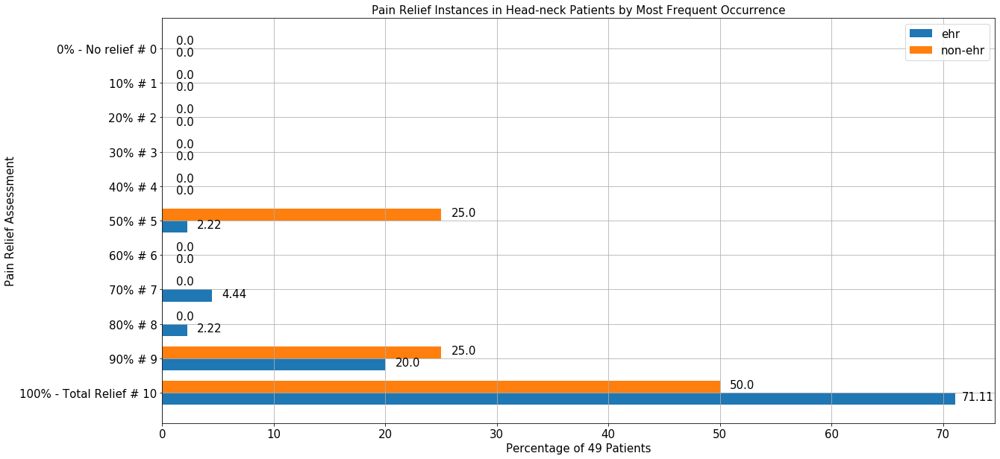

Number of EHR patients:  38
Number of Non-EHR patients:  3


<Figure size 1440x720 with 0 Axes>

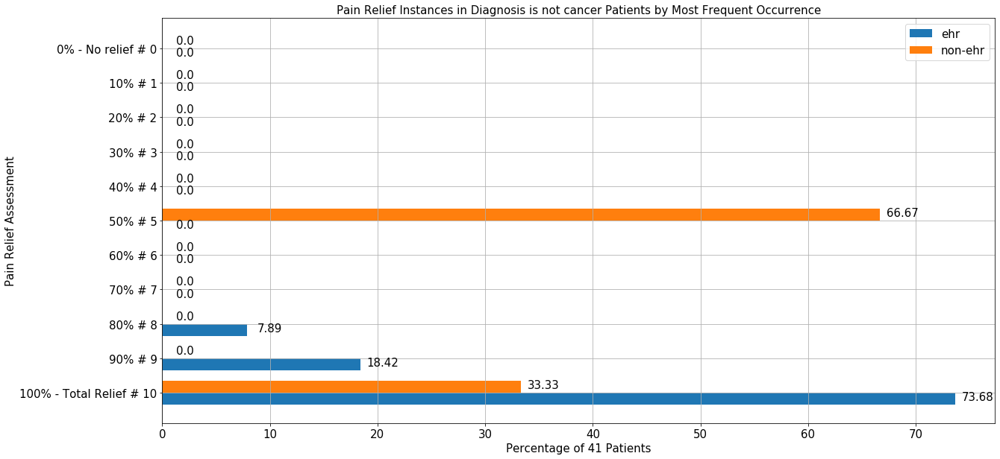

Number of EHR patients:  59
Number of Non-EHR patients:  6


<Figure size 1440x720 with 0 Axes>

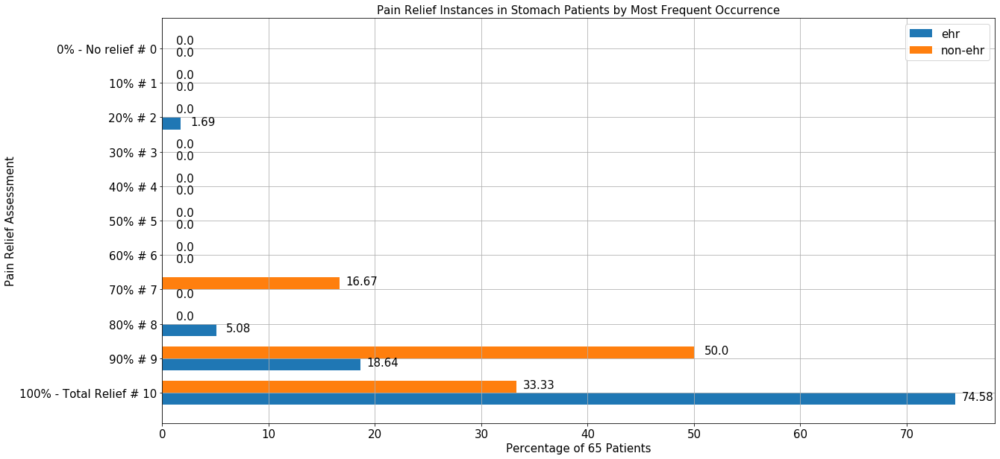

Number of EHR patients:  184
Number of Non-EHR patients:  30


<Figure size 1440x720 with 0 Axes>

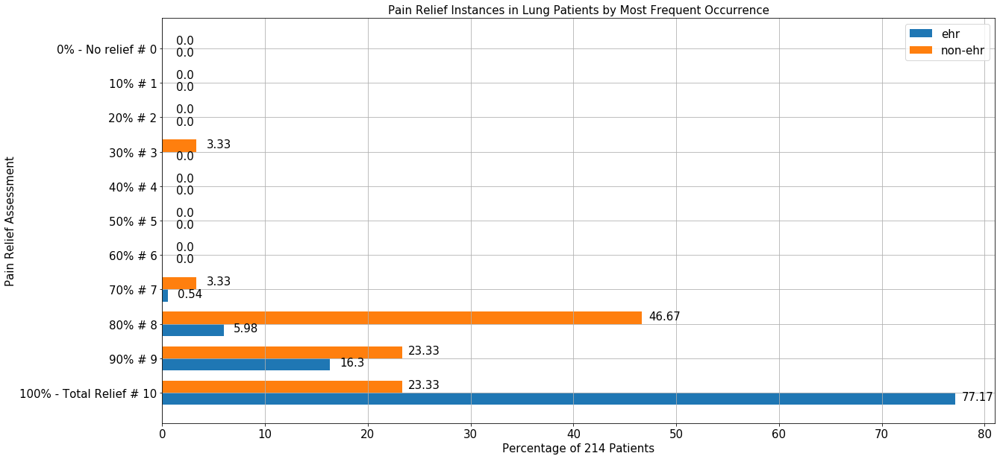

Number of EHR patients:  110
Number of Non-EHR patients:  18


<Figure size 1440x720 with 0 Axes>

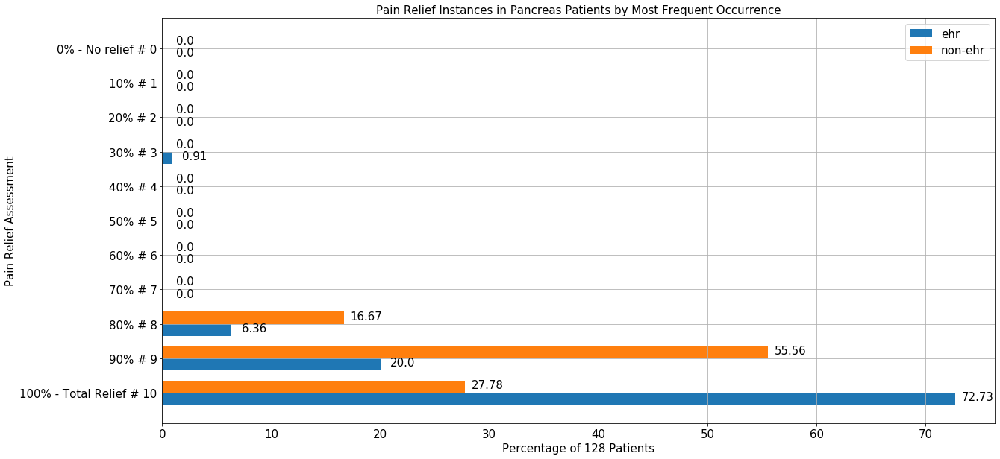

Number of EHR patients:  76
Number of Non-EHR patients:  12


<Figure size 1440x720 with 0 Axes>

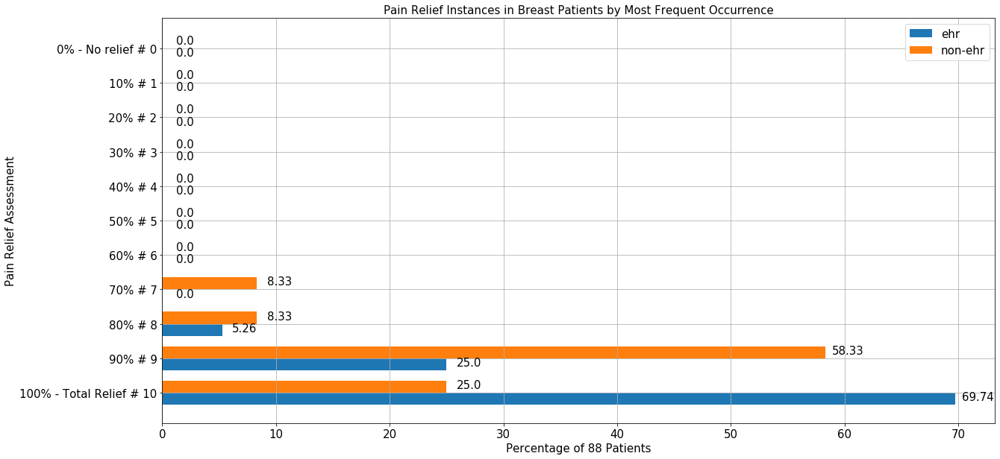

Number of EHR patients:  24
Number of Non-EHR patients:  2


<Figure size 1440x720 with 0 Axes>

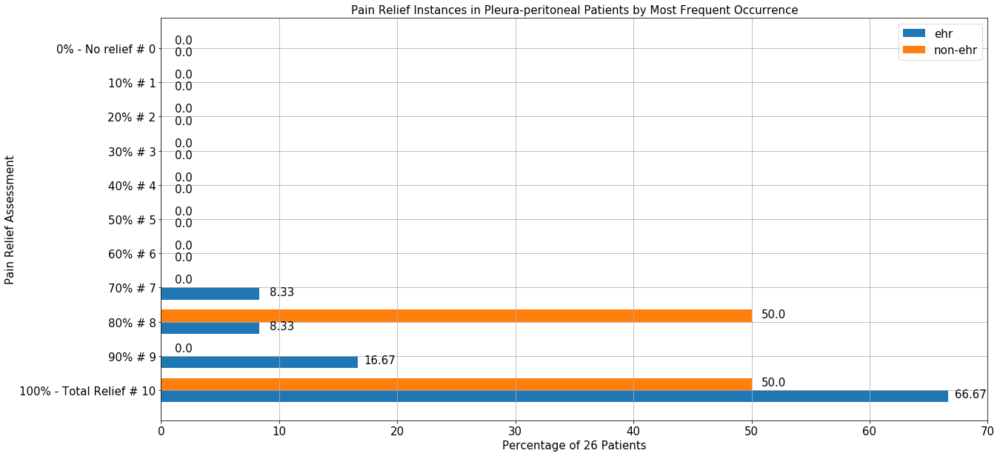

Number of EHR patients:  124
Number of Non-EHR patients:  11


<Figure size 1440x720 with 0 Axes>

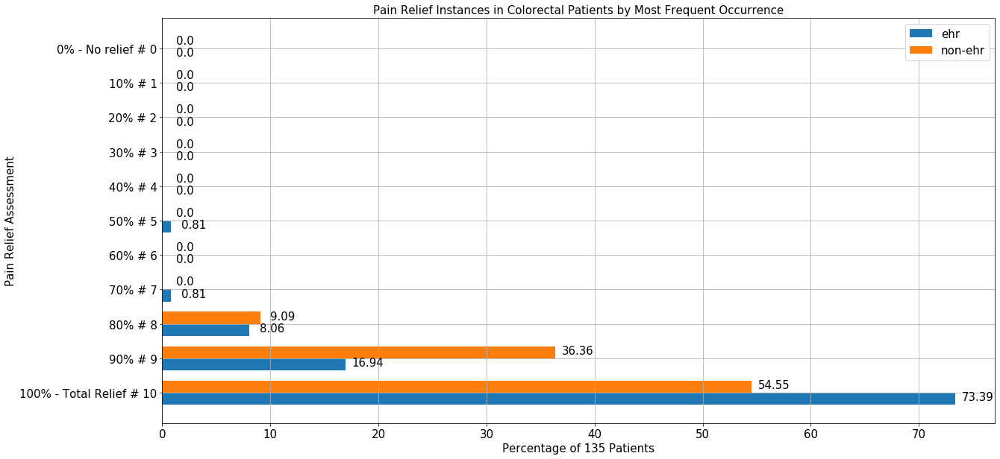

Number of EHR patients:  74
Number of Non-EHR patients:  8


<Figure size 1440x720 with 0 Axes>

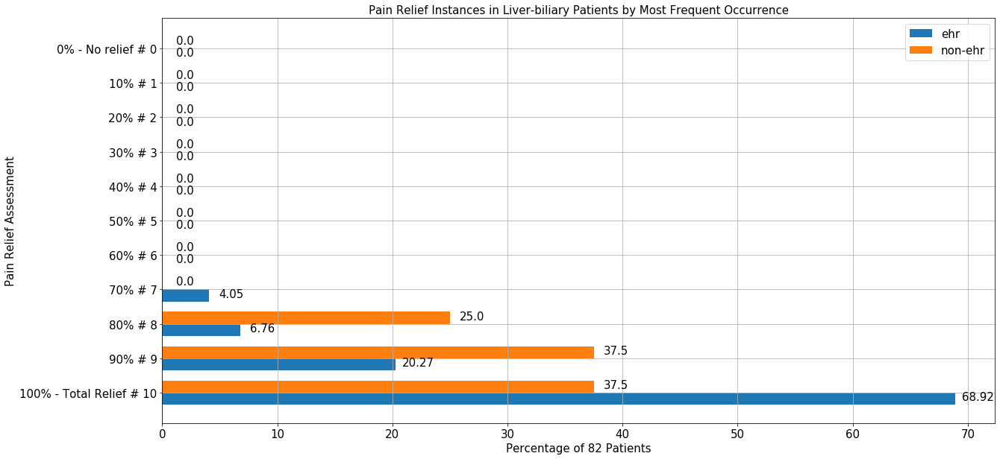

Number of EHR patients:  43
Number of Non-EHR patients:  7


<Figure size 1440x720 with 0 Axes>

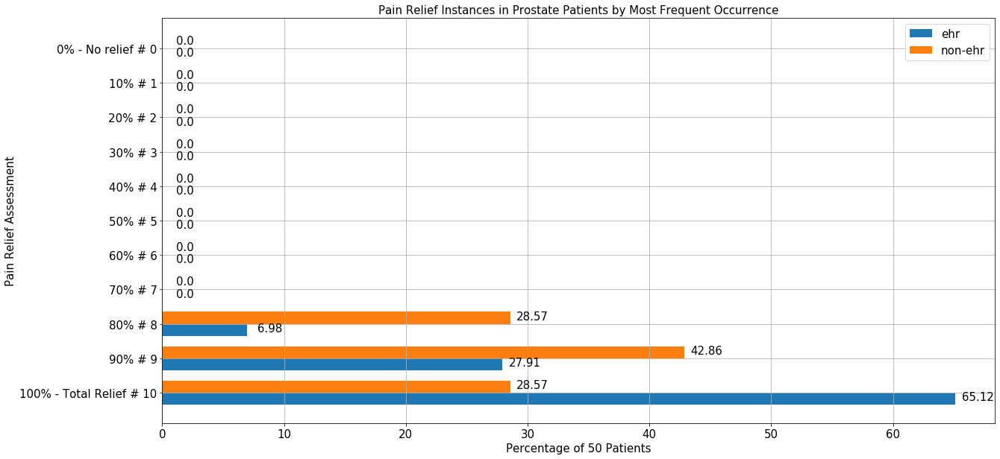

Number of EHR patients:  24
Number of Non-EHR patients:  3


<Figure size 1440x720 with 0 Axes>

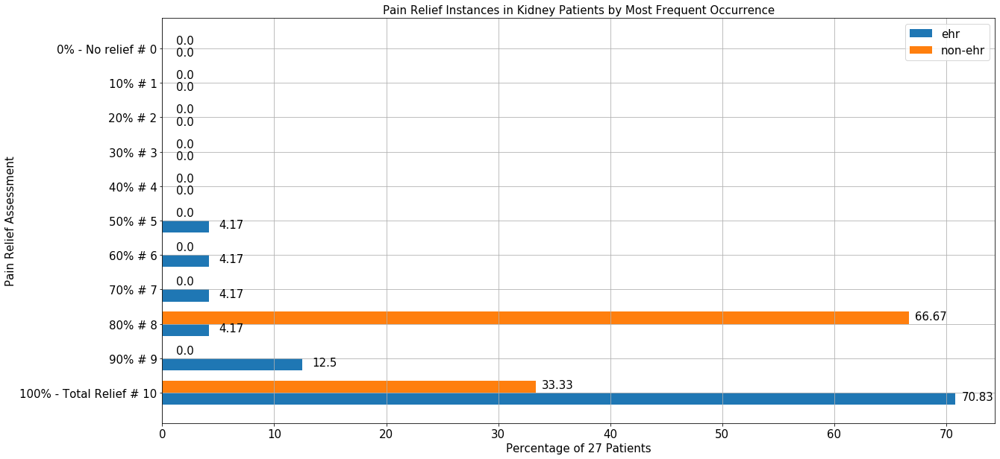

Number of EHR patients:  42
Number of Non-EHR patients:  2


<Figure size 1440x720 with 0 Axes>

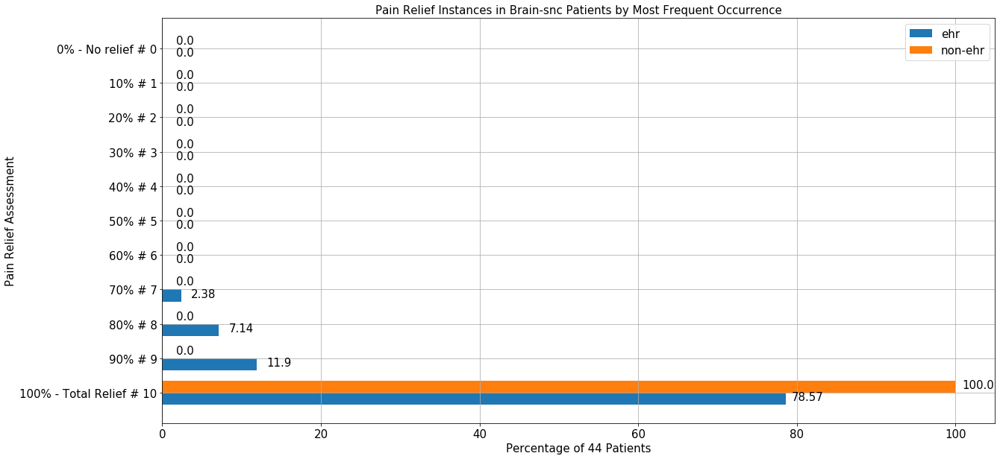

Number of EHR patients:  33
Number of Non-EHR patients:  6


<Figure size 1440x720 with 0 Axes>

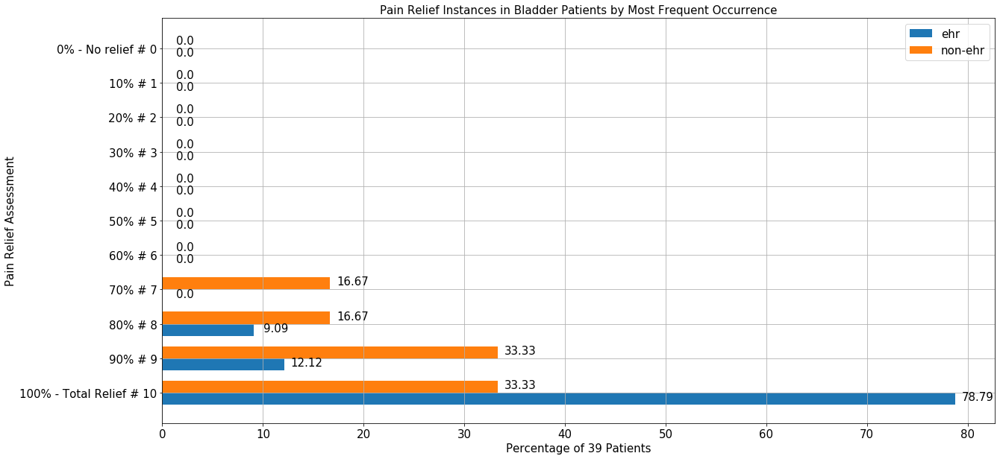

Number of EHR patients:  28
Number of Non-EHR patients:  0


<Figure size 1440x720 with 0 Axes>

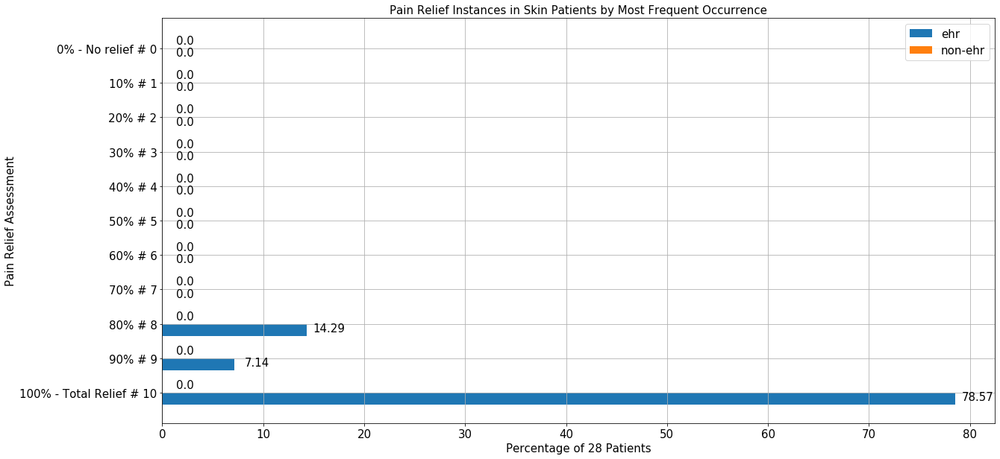

Number of EHR patients:  28
Number of Non-EHR patients:  3


<Figure size 1440x720 with 0 Axes>

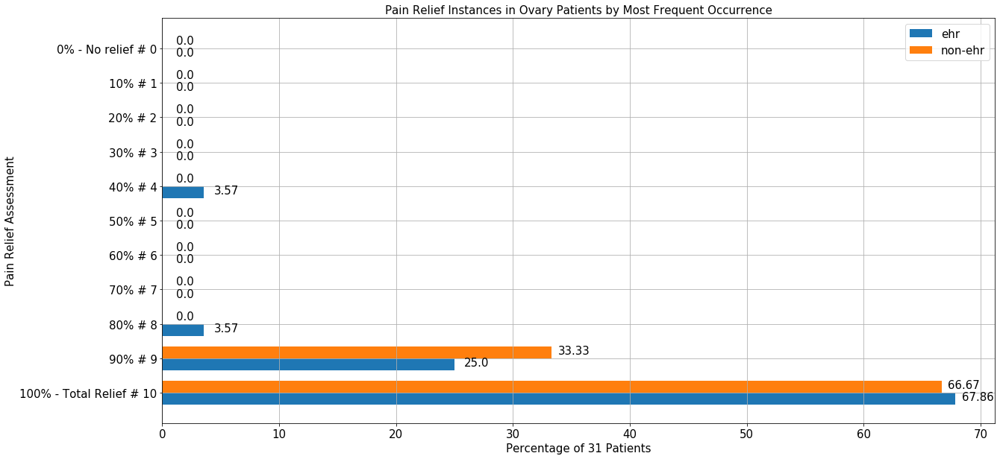

Number of EHR patients:  11
Number of Non-EHR patients:  0


<Figure size 1440x720 with 0 Axes>

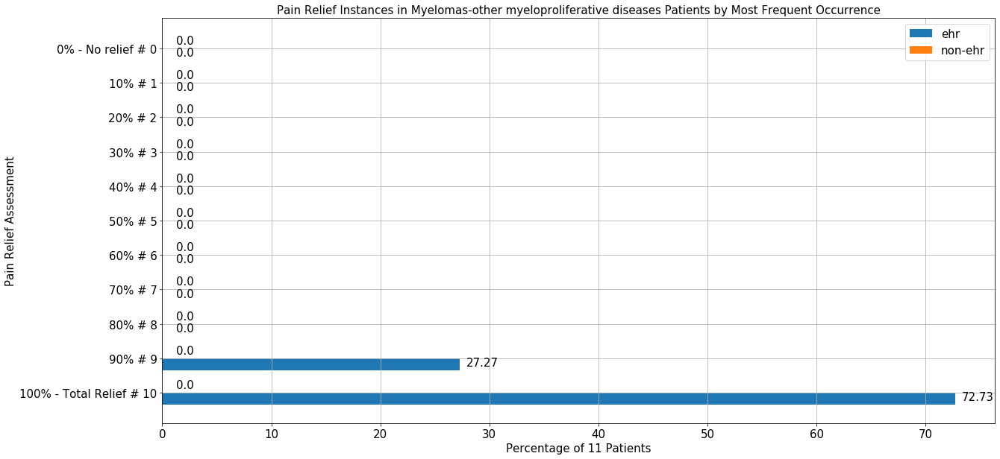

Number of EHR patients:  22
Number of Non-EHR patients:  5


<Figure size 1440x720 with 0 Axes>

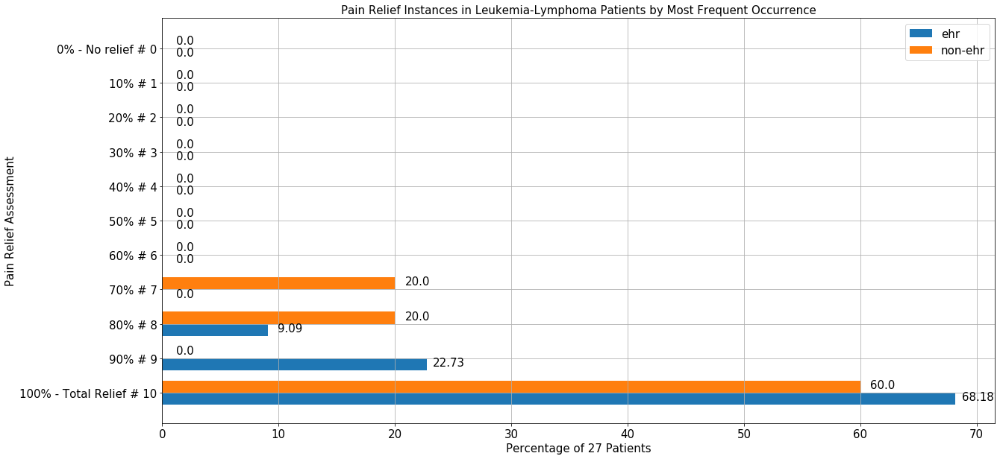

Number of EHR patients:  15
Number of Non-EHR patients:  0


<Figure size 1440x720 with 0 Axes>

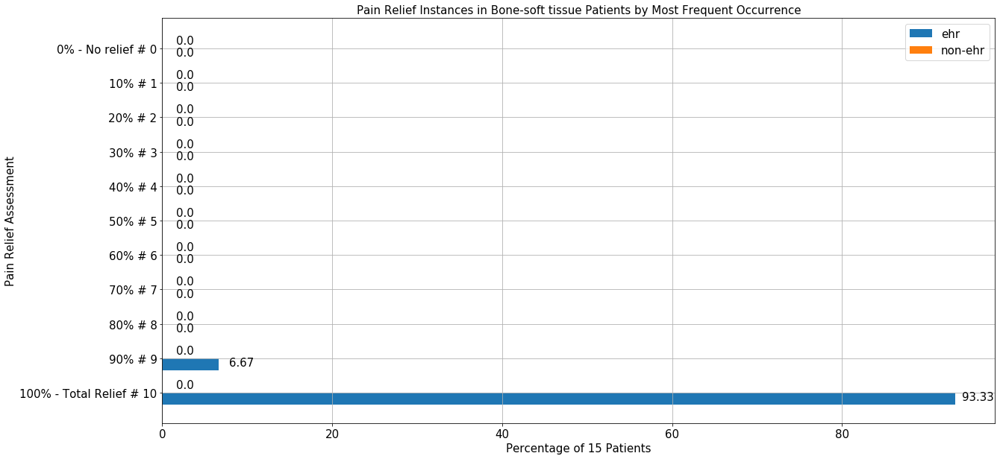

Number of EHR patients:  10
Number of Non-EHR patients:  1


<Figure size 1440x720 with 0 Axes>

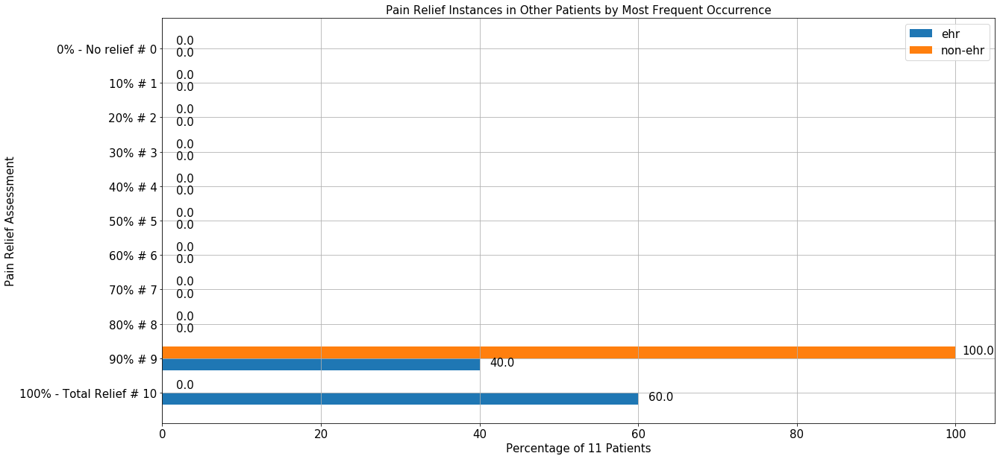

Number of EHR patients:  17
Number of Non-EHR patients:  6


<Figure size 1440x720 with 0 Axes>

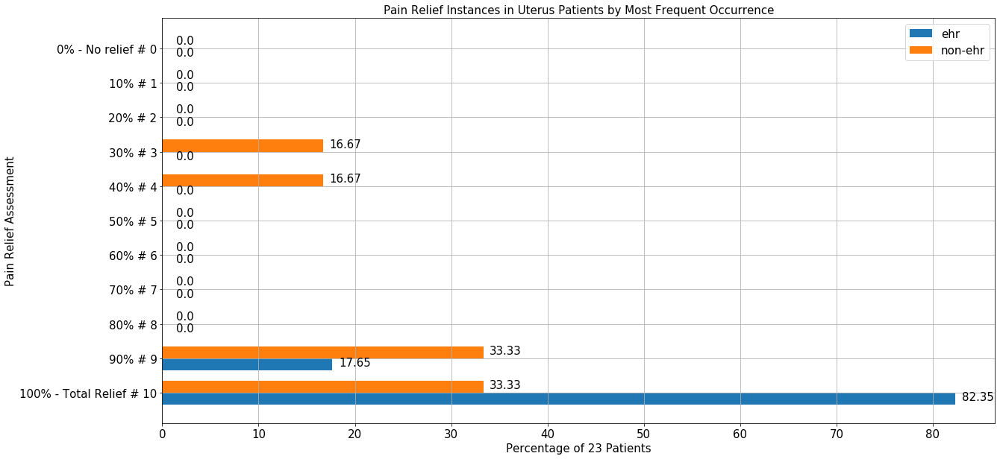

Number of EHR patients:  14
Number of Non-EHR patients:  1


<Figure size 1440x720 with 0 Axes>

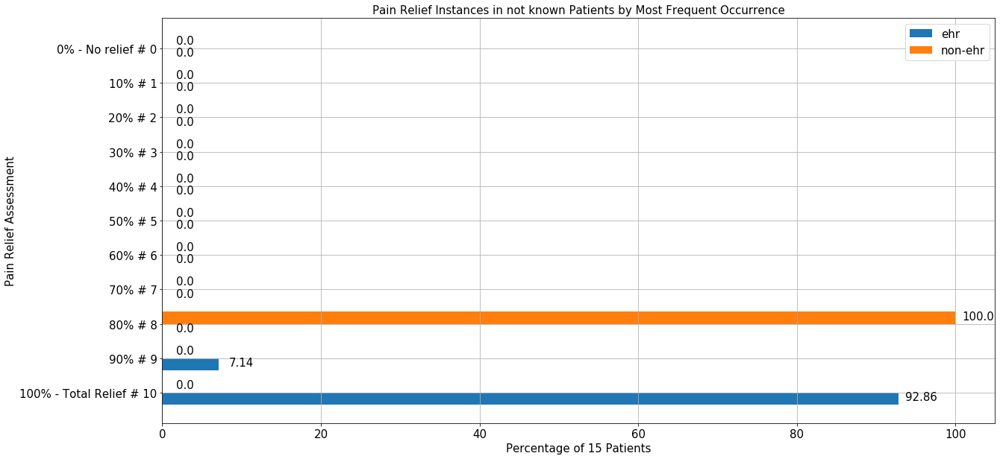

Number of EHR patients:  9
Number of Non-EHR patients:  1


<Figure size 1440x720 with 0 Axes>

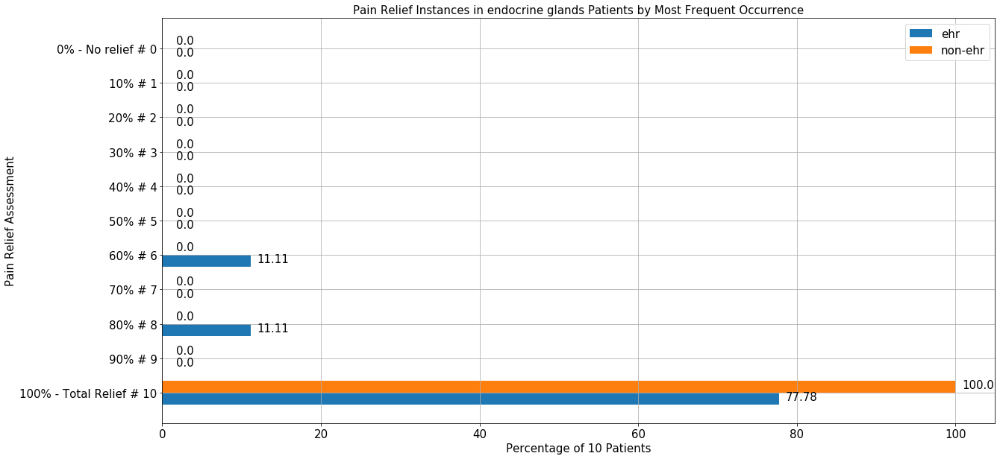

Number of EHR patients:  9
Number of Non-EHR patients:  1


<Figure size 1440x720 with 0 Axes>

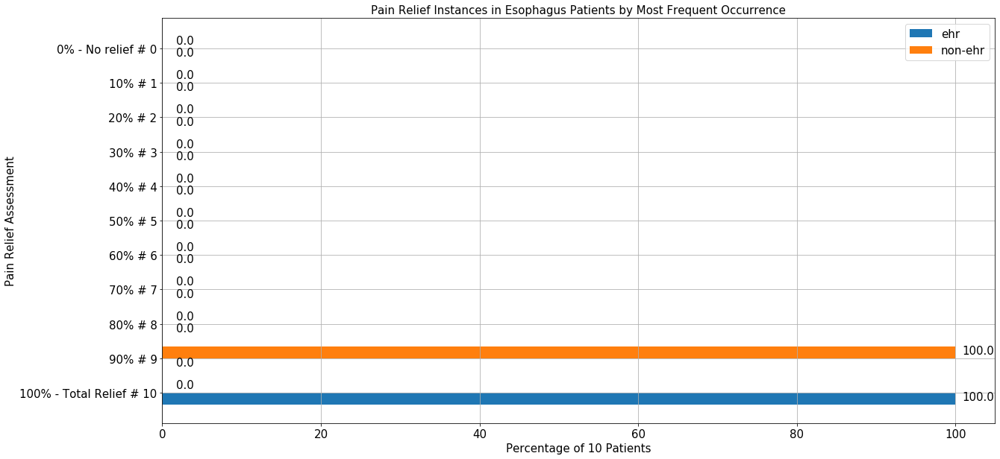

In [86]:
# ehr vs non-ehr grouped by IDEHR
for cancer in cancers:
    if isinstance(cancer, np.float):
        continue
    df_pid_0 = df_ptc[df_ptc['EHR'] == 0]
    df_pid_1 = df_ptc[df_ptc['EHR'] == 1]
    df_pid_0 = df_pid_0[df_pid_0['Diagnosis'] == cancer].PatientID
    df_pid_0 = df_pid_0.reset_index().drop(['index'], axis=1)
    df_pain_0 = df_obs.merge(df_pid_0, on=['PatientID'], how='inner').dropna(subset=['pain_relief'])
    df_pid_1 = df_pid_1[df_pid_1['Diagnosis'] == cancer].PatientID
    df_pid_1 = df_pid_1.reset_index().drop(['index'], axis=1)
    df_pain_1 = df_obs.merge(df_pid_1, on=['PatientID'], how='inner').dropna(subset=['pain_relief'])
    
    df_temp_0 = df_pain_0[['idehr', 'PatientID', 'pain_relief']]
    df_temp_0 = df_temp_0.groupby(['idehr', 'pain_relief']).size().reset_index(name='num_obs')
    df_temp_0 = df_temp_0.sort_values(by=['idehr', 'num_obs'], ascending=[True, False]).groupby('idehr').first().reset_index()
    df_temp_1 = df_pain_1[['idehr', 'PatientID', 'pain_relief']]
    df_temp_1 = df_temp_1.groupby(['idehr', 'pain_relief']).size().reset_index(name='num_obs')
    df_temp_1 = df_temp_1.sort_values(by=['idehr', 'num_obs'], ascending=[True, False]).groupby('idehr').first().reset_index()
    
    plt.rcParams['figure.figsize'] = [20, 10]
    matplotlib.rcParams.update({'font.size': 15})
    plt.figure()
    labels = pd.Index(['100% - Total Relief # 10', '90% # 9', '80% # 8', '70% # 7', '60% # 6',
           '50% # 5', '40% # 4', '30% # 3', '20% # 2', '10% # 1', '0% - No relief # 0'], dtype='object')
    x = np.arange(len(labels))
    width = 0.35
    
    print('Number of EHR patients: ', len(df_temp_1.idehr.unique()))
    print('Number of Non-EHR patients: ', len(df_temp_0.idehr.unique()))
    fig, ax = plt.subplots()
    non_amb = df_temp_0['pain_relief'].value_counts(normalize=True).mul(100).round(2).reindex(df_obs['pain_relief'].dropna().unique(), fill_value=0)
    amb = df_temp_1['pain_relief'].value_counts(normalize=True).mul(100).round(2).reindex(df_obs['pain_relief'].dropna().unique(), fill_value=0)
    bar1 = ax.barh(x - width/2, amb, width, label='ehr')
    bar2 = ax.barh(x + width/2, non_amb, width, label='non-ehr')
    ax.set_ylabel('Pain Relief Assessment', fontsize=15)
    ax.set_xlabel('Percentage of ' + str(len(df_temp_0.idehr.unique()) + len(df_temp_1.idehr.unique())) + ' Patients' , fontsize=15)
    ax.set_title('Pain Relief Instances in ' + cancer + ' Patients by Most Frequent Occurrence', fontsize=15)
    ax.set_yticks(x)
    ax.set_yticklabels(labels)
    ax.legend()
    autolabel(bar1)
    autolabel(bar2)
    plt.grid()
    plt.show()

In [130]:
# pain relief graphs for patients
df_obs = pd.read_csv("./hospiedata/obs_table_cleaned_expanded_thresholded.csv", parse_dates=['timestamp_insert'])
df_obs = df_obs.rename(columns={'patientid': 'PatientID'})
df_ptc.head()

C:\Users\prate\Anaconda3\envs\det2\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning: Columns (4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,PatientID,EHR,AMB,Age,Sex,when_needed,standard,Diagnosis
0,96,1.0,1.0,81.0,M,1.0,1.0,Head-neck
1,100,1.0,1.0,65.0,M,1.0,1.0,Diagnosis is not cancer
2,103,1.0,1.0,87.0,F,1.0,1.0,Head-neck
3,101,0.0,1.0,NaN,NaN,NaN,NaN,NaN
4,15,1.0,1.0,40.0,F,1.0,1.0,Stomach


In [131]:
df_obs.head()

,Unnamed: 0,idehr,timestamp_insert,PatientID,opt_hypotrophy,opt_anxiety,chk_eloquence,anorexia,personal_hygiene,urine_elimination,mobility,hemorrhagic_manifestation,speech,cough,nausea,memory_deficit,cognitive_deficit,active_diuresis,lack_of_appetite,opt_cooperation,opt_memory_deficit_type,opt_care_giver,chk_gastrointestinal_symptoms,chk_bowel_symptoms,opt_dehydration,opt_attitude,pain_freq,pain_relief,breath,consolability,body_language,facial_expression,awareness,asthenia,cachexia,dyspnoea,motor_performance,body_temp,agitation_behavior_freq,diet,cognitive_state,feces_elimination,consumption_help,chk_ausili_presidi_urinary_catheter,chk_ausili_presidi_bladder_catheter,chk_ausili_presidi_absorbency,chk_ausili_presidi_urocondom,chk_ausili_presidi_disposable_sleepers,mood_fear,mood_despair,mood_sadness,mood_helplessness,mood_denial,mood_hopelessness,mood_sense_of_helplessness,mood_negation,mood_sense_of_solitude,mood_senso_dimpotenza,mood_desperation,mood_sense_of_impotence,mood_apathy,mood_hostility,mood_loneliness,mood_closure_in_itself,mood_sense_of_powerlessness,mood_serenity,mood_sense_of_loneliness,mood_demoralisation,mood_happiness,mood_irritability,mood_disappointment,mood_rage,mood_anger
0,0,15,2015-01-12 11:11:44.807,70,NaN,NaN,fluent speech # 0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Severe # 3,NaN,NaN,NaN,Apyrexia,quiet # 0,NaN,memory deficits # 3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,1,11,2015-01-12 11:16:03.327,66,Hypotrophy # 0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Moderate # 2,NaN,applicant from severe stress # 8,NaN,Apyrexia,quiet # 0,NaN,memory deficits # 3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,16,2015-01-12 11:40:00.510,71,Hypotrophy # 0,NaN,confabulation # 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Severe # 3,NaN,NaN,NaN,Apyrexia,quiet # 0,NaN,confused at times 0 #,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3,16,2015-01-12 11:42:15.270,71,Hypotrophy # 0,NaN,confabulation # 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Severe # 3,NaN,NaN,NaN,Apyrexia,quiet # 0,NaN,confused at times 0 #,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,1020,2015-01-12 11:59:29.773,86,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Moderate # 2,NaN,applicant mild strain # 6,NaN,Apyrexia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [132]:
df_pain = df_obs.merge(df_ptc, on='PatientID', how='inner')
df_pain.head()

,Unnamed: 0,idehr,timestamp_insert,PatientID,opt_hypotrophy,opt_anxiety,chk_eloquence,anorexia,personal_hygiene,urine_elimination,mobility,hemorrhagic_manifestation,speech,cough,nausea,memory_deficit,cognitive_deficit,active_diuresis,lack_of_appetite,opt_cooperation,opt_memory_deficit_type,opt_care_giver,chk_gastrointestinal_symptoms,chk_bowel_symptoms,opt_dehydration,opt_attitude,pain_freq,pain_relief,breath,consolability,body_language,facial_expression,awareness,asthenia,cachexia,dyspnoea,motor_performance,body_temp,agitation_behavior_freq,diet,cognitive_state,feces_elimination,consumption_help,chk_ausili_presidi_urinary_catheter,chk_ausili_presidi_bladder_catheter,chk_ausili_presidi_absorbency,chk_ausili_presidi_urocondom,chk_ausili_presidi_disposable_sleepers,mood_fear,mood_despair,mood_sadness,mood_helplessness,mood_denial,mood_hopelessness,mood_sense_of_helplessness,mood_negation,mood_sense_of_solitude,mood_senso_dimpotenza,mood_desperation,mood_sense_of_impotence,mood_apathy,mood_hostility,mood_loneliness,mood_closure_in_itself,mood_sense_of_powerlessness,mood_serenity,mood_sense_of_loneliness,mood_demoralisation,mood_happiness,mood_irritability,mood_disappointment,mood_rage,mood_anger,EHR,AMB,Age,Sex,when_needed,standard,Diagnosis
0,0,15,2015-01-12 11:11:44.807,70,NaN,NaN,fluent speech # 0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Severe # 3,NaN,NaN,NaN,Apyrexia,quiet # 0,NaN,memory deficits # 3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,85.0,F,1.0,1.0,Uterus
1,45,15,2015-01-19 10:15:30.477,70,NaN,NaN,fluent speech # 0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Severe # 3,NaN,NaN,NaN,Apyrexia,quiet # 0,NaN,memory deficits # 3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,85.0,F,1.0,1.0,Uterus
2,122,15,2015-01-27 10:14:01.937,70,NaN,NaN,fluent speech # 0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Severe # 3,NaN,NaN,NaN,Apyrexia,quiet # 0,NaN,memory deficits # 3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,85.0,F,1.0,1.0,Uterus
3,144,15,2015-01-29 11:13:07.423,70,NaN,NaN,fluent speech # 0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Severe # 3,NaN,NaN,NaN,Apyrexia,quiet # 0,NaN,memory deficits # 3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,85.0,F,1.0,1.0,Uterus
4,188,15,2015-02-03 12:48:52.160,70,Hypotrophy # 0,NaN,confabulation # 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Severe # 3,NaN,NaN,NaN,Fever,quiet # 0,NaN,memory deficits # 3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,85.0,F,1.0,1.0,Uterus


In [133]:
df1 = df_pain[df_pain['PatientID'] == 70]
df1.shape

(323, 80)

In [134]:
df1.head()

,Unnamed: 0,idehr,timestamp_insert,PatientID,opt_hypotrophy,opt_anxiety,chk_eloquence,anorexia,personal_hygiene,urine_elimination,mobility,hemorrhagic_manifestation,speech,cough,nausea,memory_deficit,cognitive_deficit,active_diuresis,lack_of_appetite,opt_cooperation,opt_memory_deficit_type,opt_care_giver,chk_gastrointestinal_symptoms,chk_bowel_symptoms,opt_dehydration,opt_attitude,pain_freq,pain_relief,breath,consolability,body_language,facial_expression,awareness,asthenia,cachexia,dyspnoea,motor_performance,body_temp,agitation_behavior_freq,diet,cognitive_state,feces_elimination,consumption_help,chk_ausili_presidi_urinary_catheter,chk_ausili_presidi_bladder_catheter,chk_ausili_presidi_absorbency,chk_ausili_presidi_urocondom,chk_ausili_presidi_disposable_sleepers,mood_fear,mood_despair,mood_sadness,mood_helplessness,mood_denial,mood_hopelessness,mood_sense_of_helplessness,mood_negation,mood_sense_of_solitude,mood_senso_dimpotenza,mood_desperation,mood_sense_of_impotence,mood_apathy,mood_hostility,mood_loneliness,mood_closure_in_itself,mood_sense_of_powerlessness,mood_serenity,mood_sense_of_loneliness,mood_demoralisation,mood_happiness,mood_irritability,mood_disappointment,mood_rage,mood_anger,EHR,AMB,Age,Sex,when_needed,standard,Diagnosis
0,0,15,2015-01-12 11:11:44.807,70,NaN,NaN,fluent speech # 0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Severe # 3,NaN,NaN,NaN,Apyrexia,quiet # 0,NaN,memory deficits # 3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,85.0,F,1.0,1.0,Uterus
1,45,15,2015-01-19 10:15:30.477,70,NaN,NaN,fluent speech # 0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Severe # 3,NaN,NaN,NaN,Apyrexia,quiet # 0,NaN,memory deficits # 3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,85.0,F,1.0,1.0,Uterus
2,122,15,2015-01-27 10:14:01.937,70,NaN,NaN,fluent speech # 0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Severe # 3,NaN,NaN,NaN,Apyrexia,quiet # 0,NaN,memory deficits # 3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,85.0,F,1.0,1.0,Uterus
3,144,15,2015-01-29 11:13:07.423,70,NaN,NaN,fluent speech # 0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Severe # 3,NaN,NaN,NaN,Apyrexia,quiet # 0,NaN,memory deficits # 3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,85.0,F,1.0,1.0,Uterus
4,188,15,2015-02-03 12:48:52.160,70,Hypotrophy # 0,NaN,confabulation # 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Severe # 3,NaN,NaN,NaN,Fever,quiet # 0,NaN,memory deficits # 3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,85.0,F,1.0,1.0,Uterus


In [135]:
df1 = df1[['idehr', 'PatientID', 'timestamp_insert', 'Diagnosis', 'pain_relief']]
df1.pain_relief.unique()

array([nan, '100% - Total Relief # 10', '90% # 9', '80% # 8'],
      dtype=object)

In [136]:
df1.head()

,idehr,PatientID,timestamp_insert,Diagnosis,pain_relief
0,15,70,2015-01-12 11:11:44.807,Uterus,NaN
1,15,70,2015-01-19 10:15:30.477,Uterus,NaN
2,15,70,2015-01-27 10:14:01.937,Uterus,NaN
3,15,70,2015-01-29 11:13:07.423,Uterus,NaN
4,15,70,2015-02-03 12:48:52.160,Uterus,NaN


In [137]:
df1['Day'] = df1['timestamp_insert'].dt.strftime('%D')
df1['Hour'] = df1['timestamp_insert'].dt.strftime('%H')

In [138]:
df1.head()

,idehr,PatientID,timestamp_insert,Diagnosis,pain_relief,Day,Hour
0,15,70,2015-01-12 11:11:44.807,Uterus,NaN,01/12/15,11
1,15,70,2015-01-19 10:15:30.477,Uterus,NaN,01/19/15,10
2,15,70,2015-01-27 10:14:01.937,Uterus,NaN,01/27/15,10
3,15,70,2015-01-29 11:13:07.423,Uterus,NaN,01/29/15,11
4,15,70,2015-02-03 12:48:52.160,Uterus,NaN,02/03/15,12


In [139]:
df1 = df1.dropna().sort_values(by=['Day', 'Hour'], ascending=[True, True]).reset_index(drop=True)
df1

,idehr,PatientID,timestamp_insert,Diagnosis,pain_relief,Day,Hour
0,15,70,2015-01-15 17:43:44,Uterus,100% - Total Relief # 10,01/15/15,17
1,15,70,2015-01-18 16:44:22,Uterus,90% # 9,01/18/15,16
2,15,70,2015-01-21 06:03:19,Uterus,100% - Total Relief # 10,01/21/15,06
3,15,70,2015-01-21 12:49:56,Uterus,80% # 8,01/21/15,12
4,15,70,2015-01-21 16:39:30,Uterus,80% # 8,01/21/15,16
5,15,70,2015-01-22 01:51:44,Uterus,100% - Total Relief # 10,01/22/15,01
6,15,70,2015-01-22 15:24:39,Uterus,100% - Total Relief # 10,01/22/15,15
7,15,70,2015-01-22 17:35:16,Uterus,90% # 9,01/22/15,17
8,15,70,2015-01-23 06:04:07,Uterus,90% # 9,01/23/15,06
9,15,70,2015-01-23 15:29:50,Uterus,80% # 8,01/23/15,15


<Figure size 1440x720 with 0 Axes>

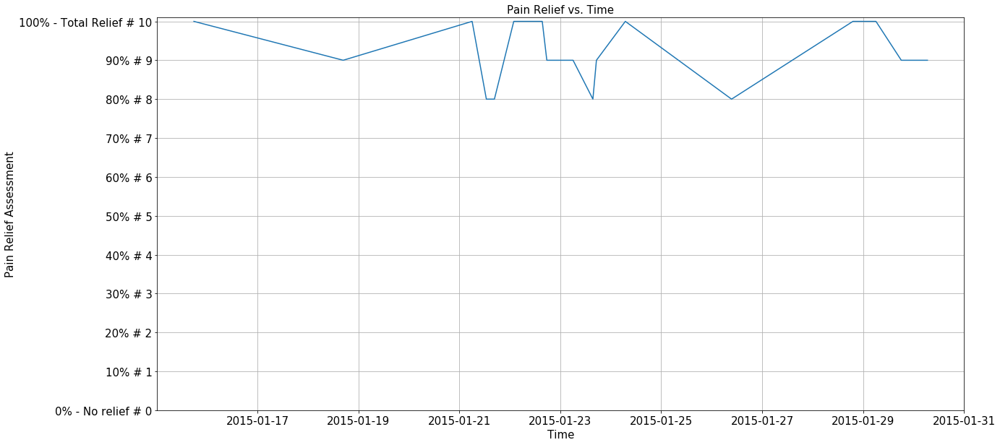

In [140]:
ylabels = pd.Index(['100% - Total Relief # 10', '90% # 9', '80% # 8', '70% # 7', '60% # 6',
           '50% # 5', '40% # 4', '30% # 3', '20% # 2', '10% # 1', '0% - No relief # 0'], dtype='object')
plt.rcParams['figure.figsize'] = [20, 10]
matplotlib.rcParams.update({'font.size': 15})
plt.figure()
fig, ax = plt.subplots()
timest = df1.timestamp_insert.values
pain_val = df1.pain_relief.values
plot1 = ax.plot(timest, pain_val)
ax.set_ylabel('Pain Relief Assessment', fontsize=15)
ax.set_xlabel('Time', fontsize=15)
ax.set_title('Pain Relief vs. Time', fontsize=15)
ax.set_yticks(ylabels)
plt.grid()
# reverse y_ticks
ax = plt.gca()
ax.set_ylim(ax.get_ylim()[::-1])
plt.show()

In [141]:
# get pain relief vs. time for random patients
df_obs = pd.read_csv("./hospiedata/obs_table_cleaned_expanded_thresholded.csv", parse_dates=['timestamp_insert'])
df_obs = df_obs.rename(columns={'patientid': 'PatientID'})
df_pain = df_obs.merge(df_ptc, on='PatientID', how='inner')

C:\Users\prate\Anaconda3\envs\det2\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning: Columns (4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [142]:
df_pain.head()

,Unnamed: 0,idehr,timestamp_insert,PatientID,opt_hypotrophy,opt_anxiety,chk_eloquence,anorexia,personal_hygiene,urine_elimination,mobility,hemorrhagic_manifestation,speech,cough,nausea,memory_deficit,cognitive_deficit,active_diuresis,lack_of_appetite,opt_cooperation,opt_memory_deficit_type,opt_care_giver,chk_gastrointestinal_symptoms,chk_bowel_symptoms,opt_dehydration,opt_attitude,pain_freq,pain_relief,breath,consolability,body_language,facial_expression,awareness,asthenia,cachexia,dyspnoea,motor_performance,body_temp,agitation_behavior_freq,diet,cognitive_state,feces_elimination,consumption_help,chk_ausili_presidi_urinary_catheter,chk_ausili_presidi_bladder_catheter,chk_ausili_presidi_absorbency,chk_ausili_presidi_urocondom,chk_ausili_presidi_disposable_sleepers,mood_fear,mood_despair,mood_sadness,mood_helplessness,mood_denial,mood_hopelessness,mood_sense_of_helplessness,mood_negation,mood_sense_of_solitude,mood_senso_dimpotenza,mood_desperation,mood_sense_of_impotence,mood_apathy,mood_hostility,mood_loneliness,mood_closure_in_itself,mood_sense_of_powerlessness,mood_serenity,mood_sense_of_loneliness,mood_demoralisation,mood_happiness,mood_irritability,mood_disappointment,mood_rage,mood_anger,EHR,AMB,Age,Sex,when_needed,standard,Diagnosis
0,0,15,2015-01-12 11:11:44.807,70,NaN,NaN,fluent speech # 0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Severe # 3,NaN,NaN,NaN,Apyrexia,quiet # 0,NaN,memory deficits # 3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,85.0,F,1.0,1.0,Uterus
1,45,15,2015-01-19 10:15:30.477,70,NaN,NaN,fluent speech # 0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Severe # 3,NaN,NaN,NaN,Apyrexia,quiet # 0,NaN,memory deficits # 3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,85.0,F,1.0,1.0,Uterus
2,122,15,2015-01-27 10:14:01.937,70,NaN,NaN,fluent speech # 0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Severe # 3,NaN,NaN,NaN,Apyrexia,quiet # 0,NaN,memory deficits # 3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,85.0,F,1.0,1.0,Uterus
3,144,15,2015-01-29 11:13:07.423,70,NaN,NaN,fluent speech # 0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Severe # 3,NaN,NaN,NaN,Apyrexia,quiet # 0,NaN,memory deficits # 3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,85.0,F,1.0,1.0,Uterus
4,188,15,2015-02-03 12:48:52.160,70,Hypotrophy # 0,NaN,confabulation # 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Severe # 3,NaN,NaN,NaN,Fever,quiet # 0,NaN,memory deficits # 3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,85.0,F,1.0,1.0,Uterus


In [143]:
pid_arr = np.random.choice(df_pain.PatientID.unique(), 100)
pid_arr

array([42844, 41639, 43201, 41324, 41504, 42286,   157, 42580, 42801,
       42887, 41913, 30629, 43333, 43394, 43622, 43122, 43368, 30895,
       20472, 43006, 42749, 30602, 42350, 30515, 43755, 41944, 42927,
       30897, 10294, 43268, 42997,    97, 43864, 42918, 43585, 41490,
       30535, 42065, 41845, 41269, 41735, 43470, 30528, 43499, 43106,
       43009, 41515, 42068, 43554, 43546, 43247, 43252, 43335, 42276,
       20408, 41958, 43261, 43737, 41697, 41062, 42925, 41238,   217,
       42549, 41056, 42685, 42616, 41463, 30943, 30922, 44042, 41730,
       41007,   265, 42920, 43098, 43554, 43703, 41680, 42265, 20481,
       41178, 30613, 43336, 40991,   134, 41505, 41894, 30546,   199,
       30605, 30976, 41499, 43499, 41516, 41894, 42783, 41356, 41140,
       20485], dtype=int64)

<Figure size 1440x720 with 0 Axes>

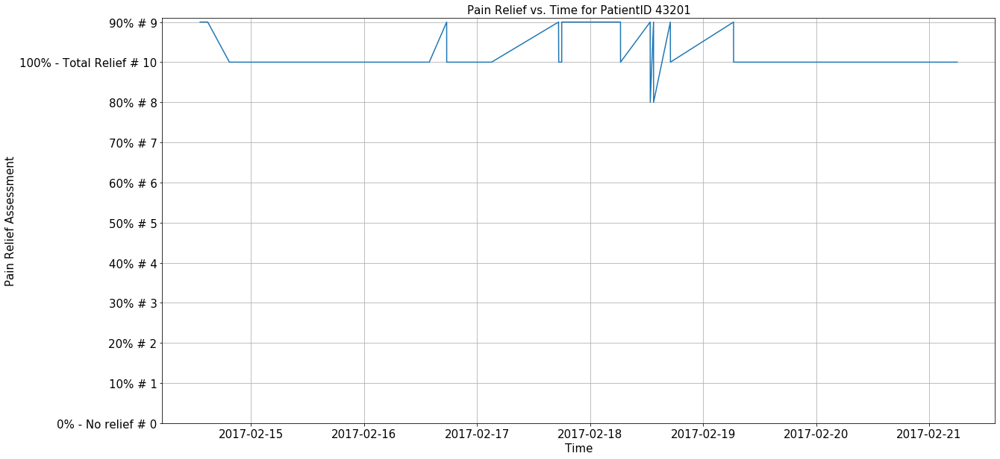

<Figure size 1440x720 with 0 Axes>

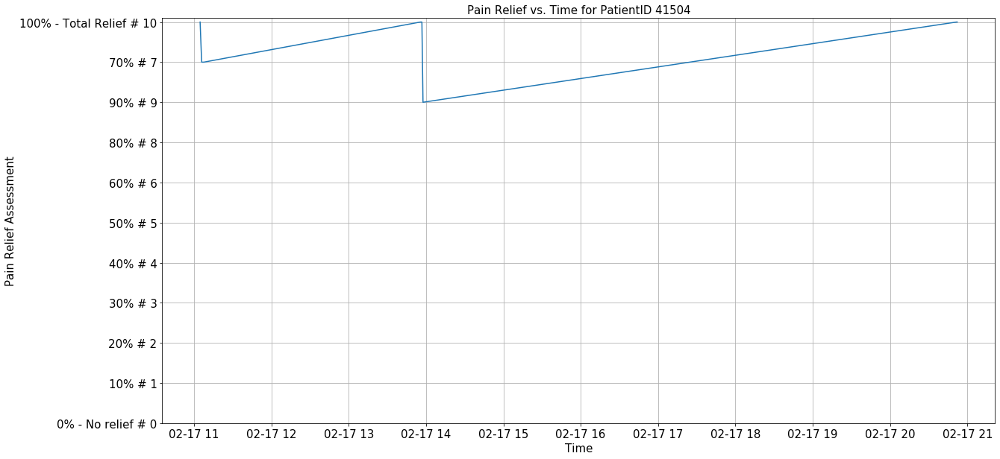

<Figure size 1440x720 with 0 Axes>

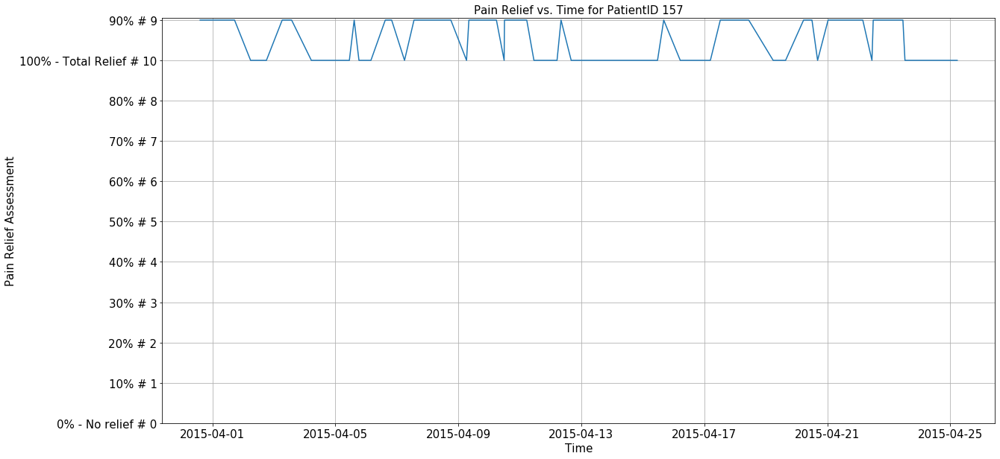

<Figure size 1440x720 with 0 Axes>

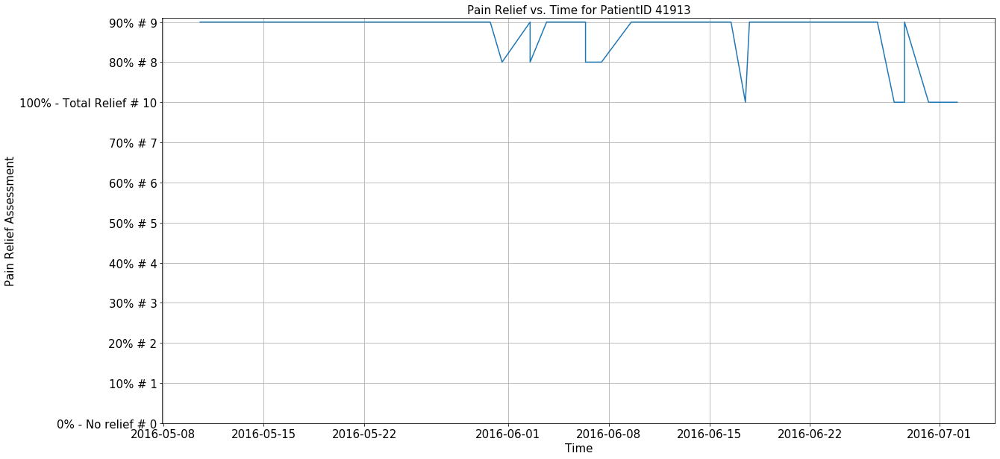

<Figure size 1440x720 with 0 Axes>

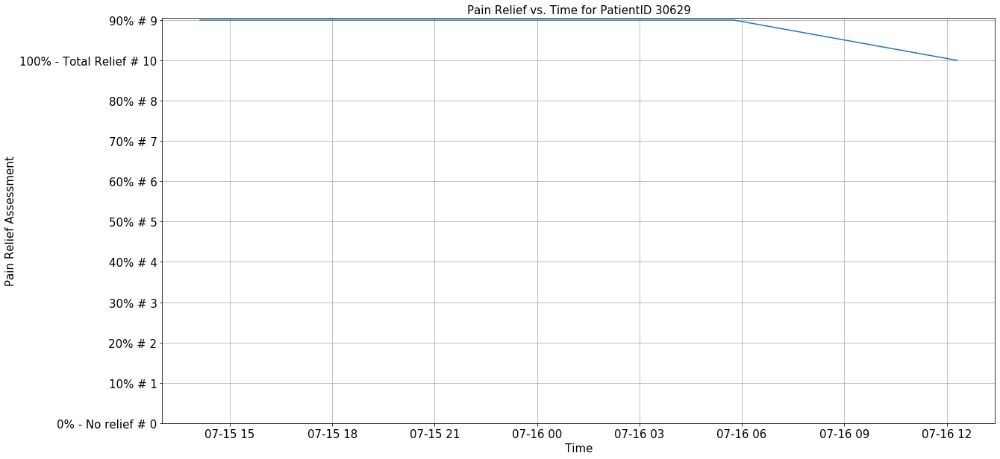

<Figure size 1440x720 with 0 Axes>

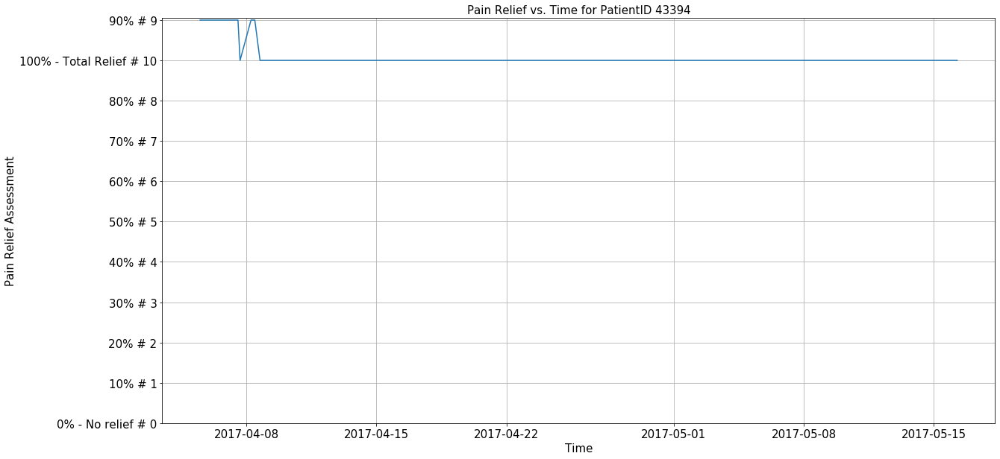

<Figure size 1440x720 with 0 Axes>

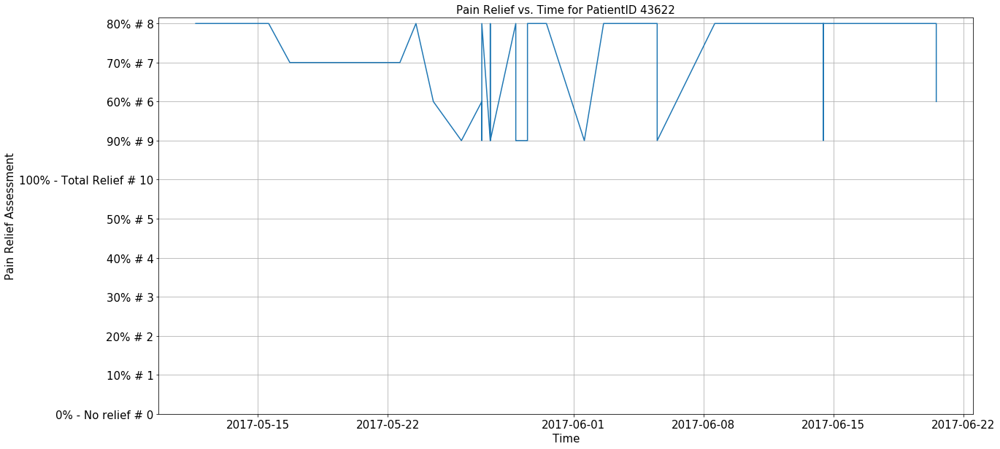

<Figure size 1440x720 with 0 Axes>

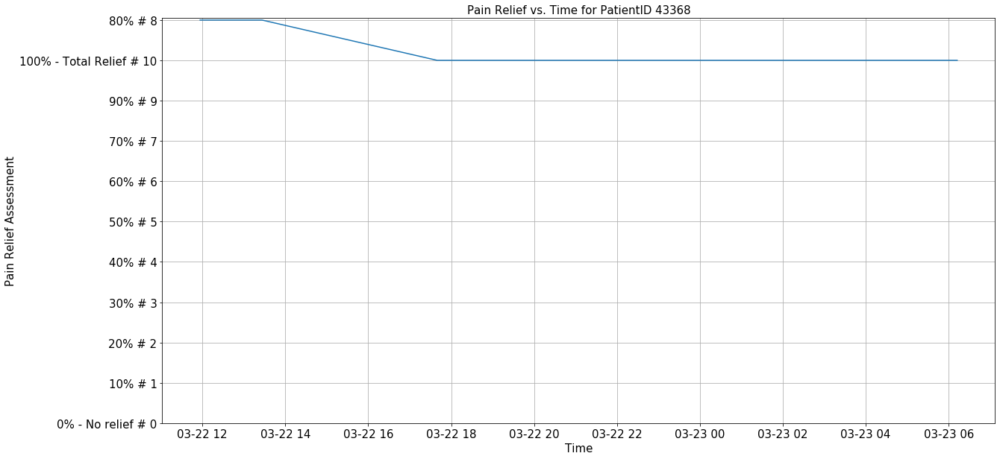

<Figure size 1440x720 with 0 Axes>

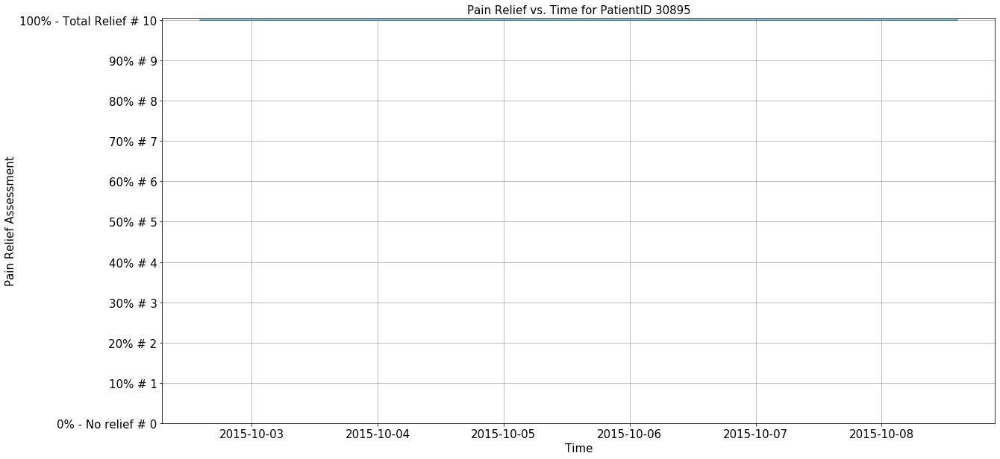

<Figure size 1440x720 with 0 Axes>

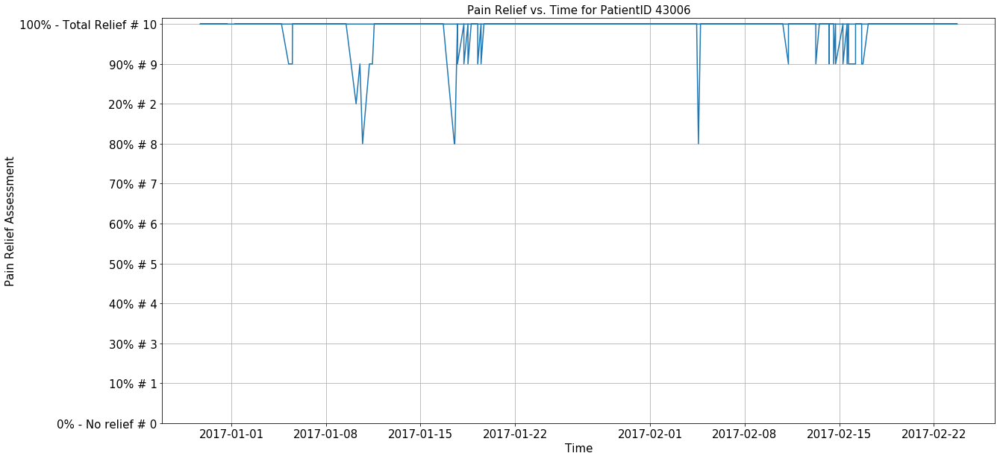

<Figure size 1440x720 with 0 Axes>

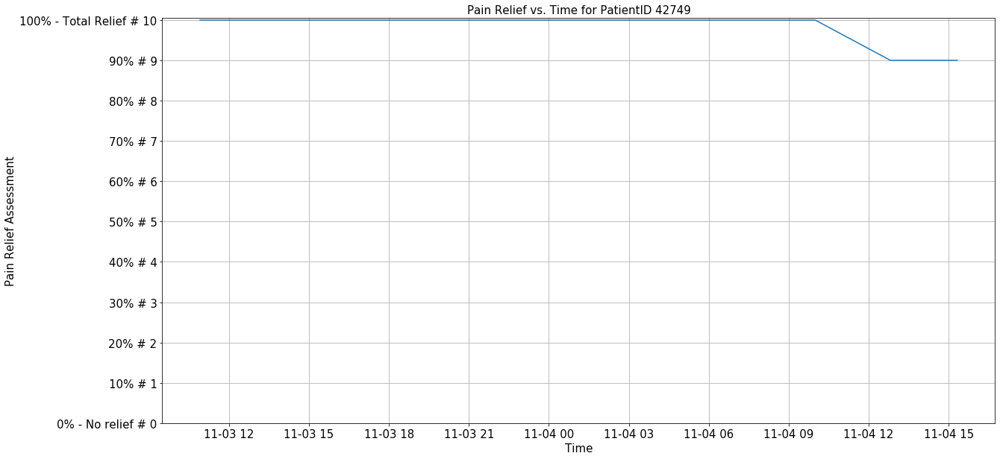

<Figure size 1440x720 with 0 Axes>

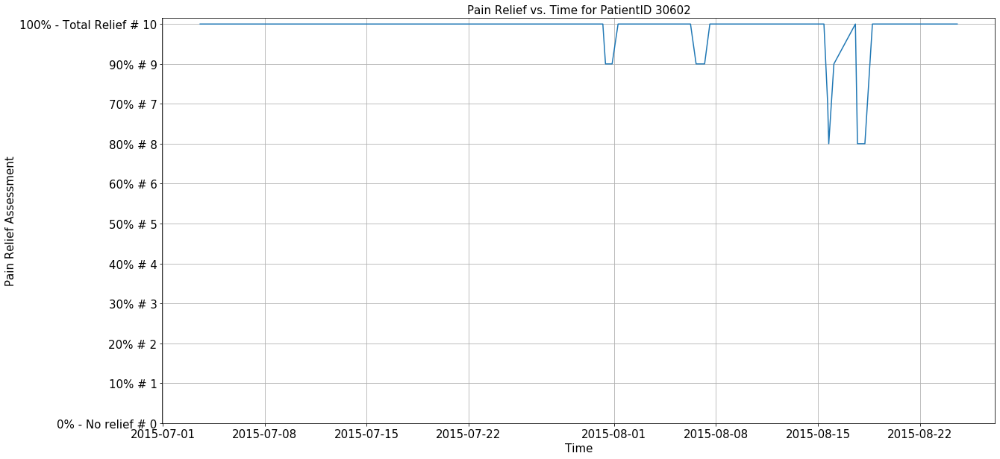

<Figure size 1440x720 with 0 Axes>

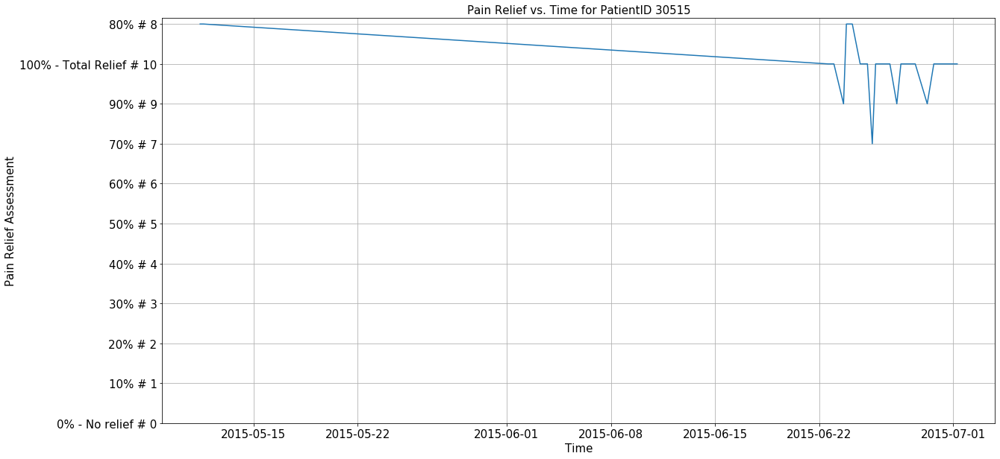

<Figure size 1440x720 with 0 Axes>

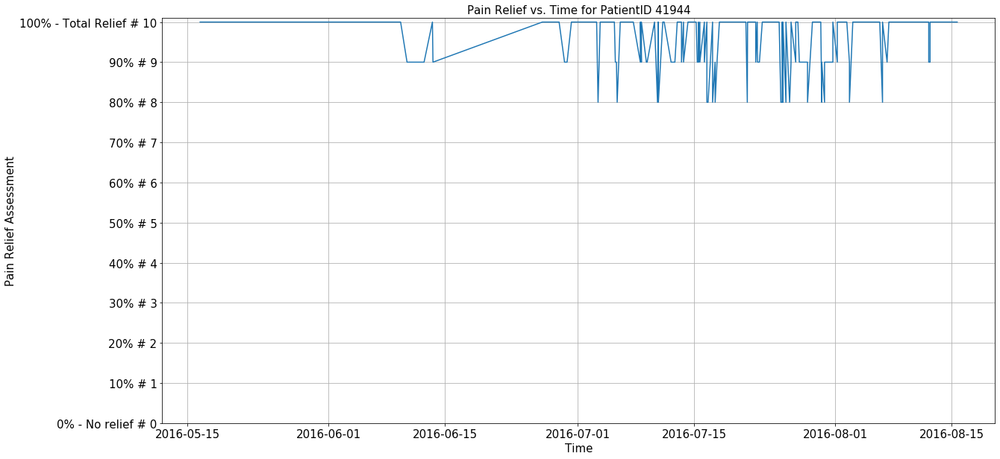

<Figure size 1440x720 with 0 Axes>

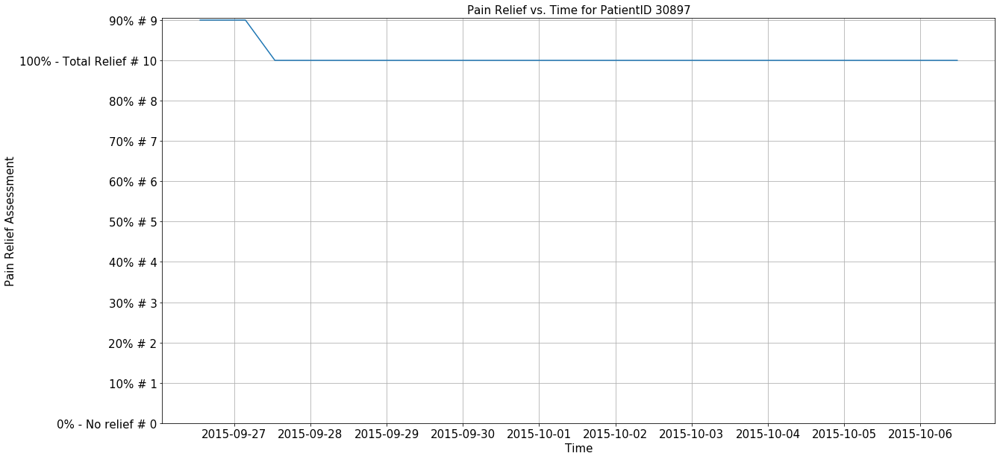

<Figure size 1440x720 with 0 Axes>

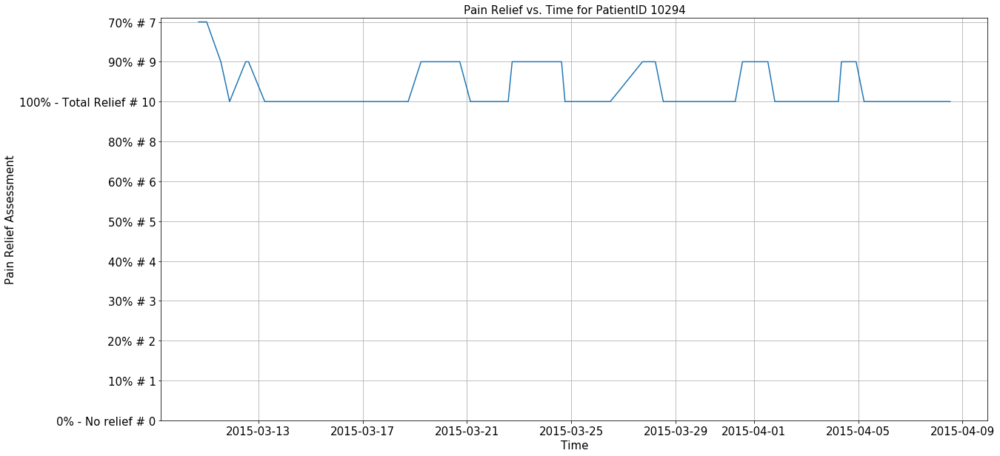

<Figure size 1440x720 with 0 Axes>

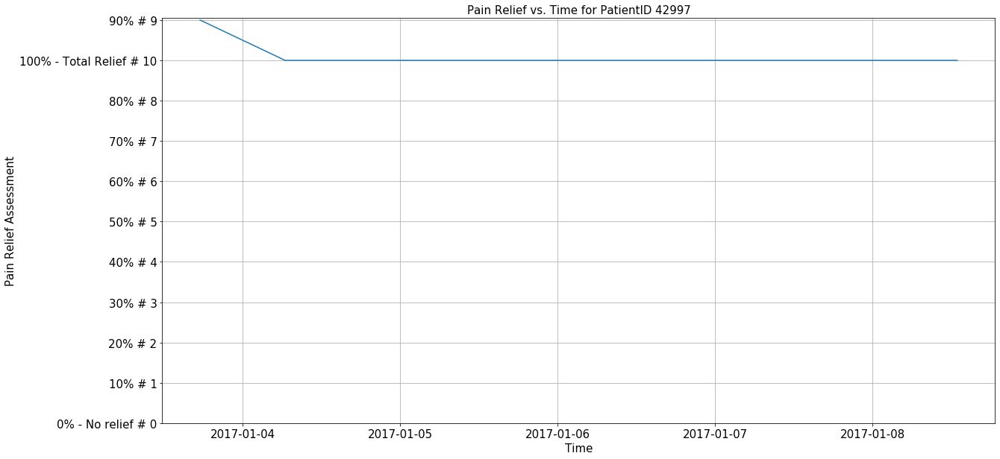

<Figure size 1440x720 with 0 Axes>

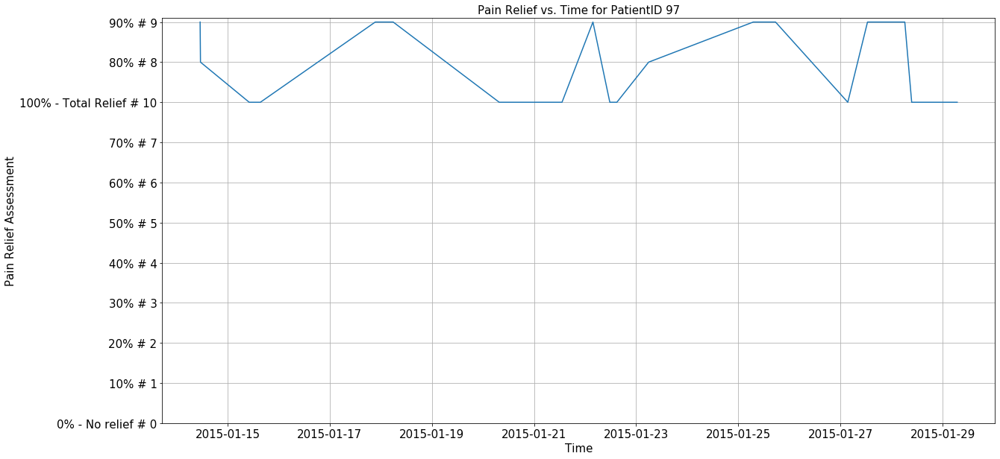

<Figure size 1440x720 with 0 Axes>

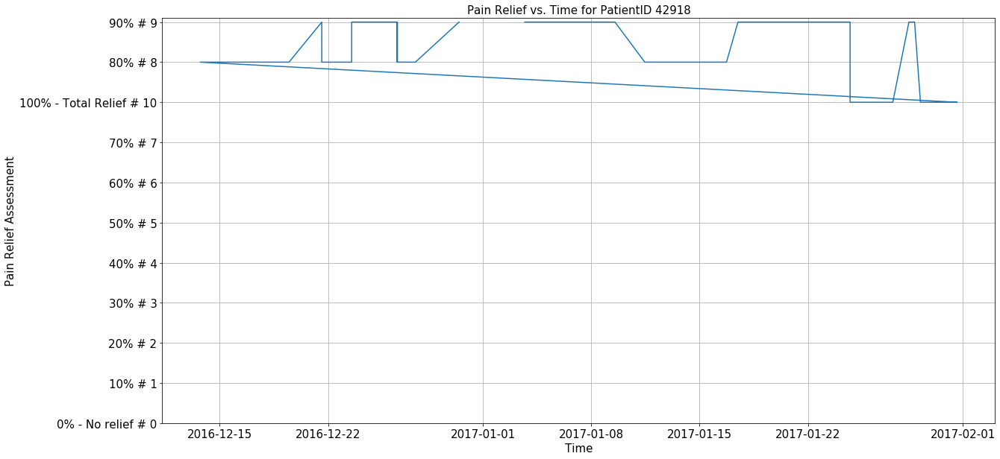

<Figure size 1440x720 with 0 Axes>

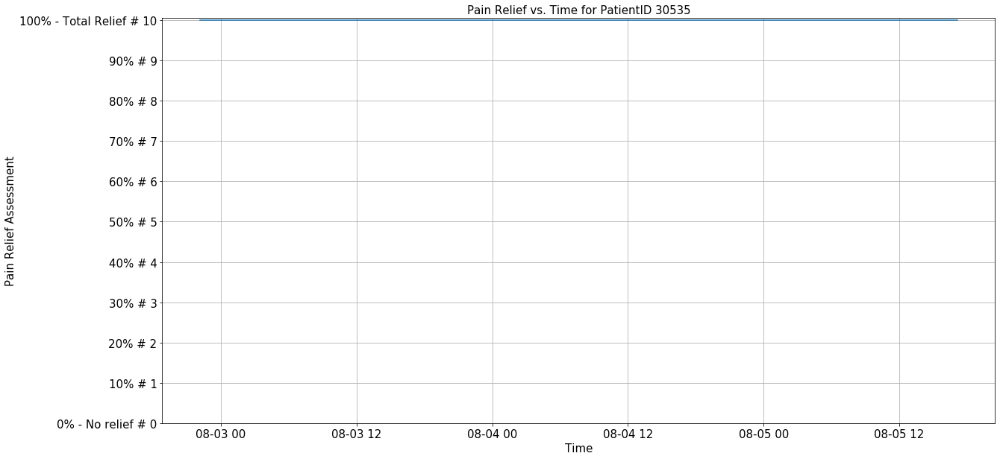

<Figure size 1440x720 with 0 Axes>

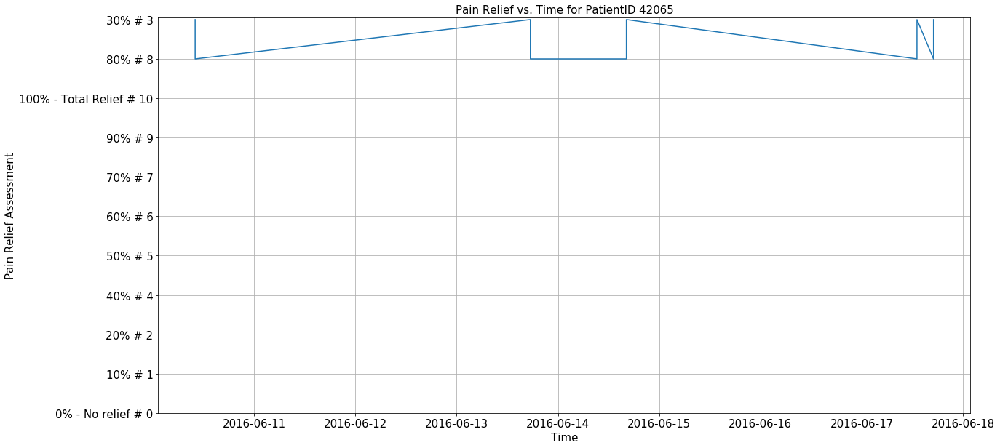

<Figure size 1440x720 with 0 Axes>

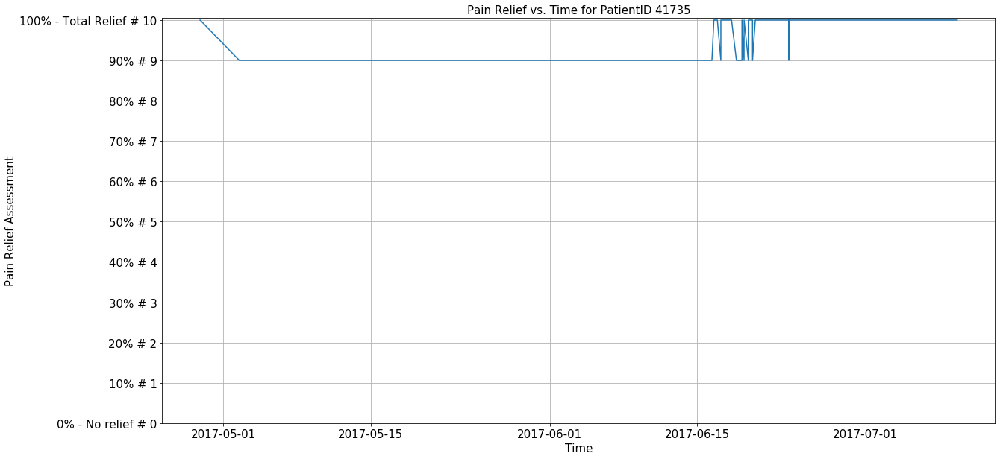

<Figure size 1440x720 with 0 Axes>

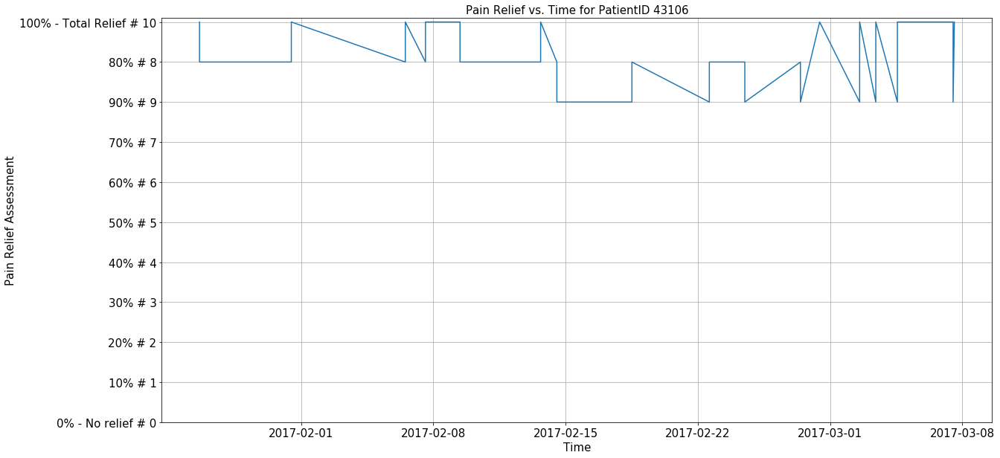

<Figure size 1440x720 with 0 Axes>

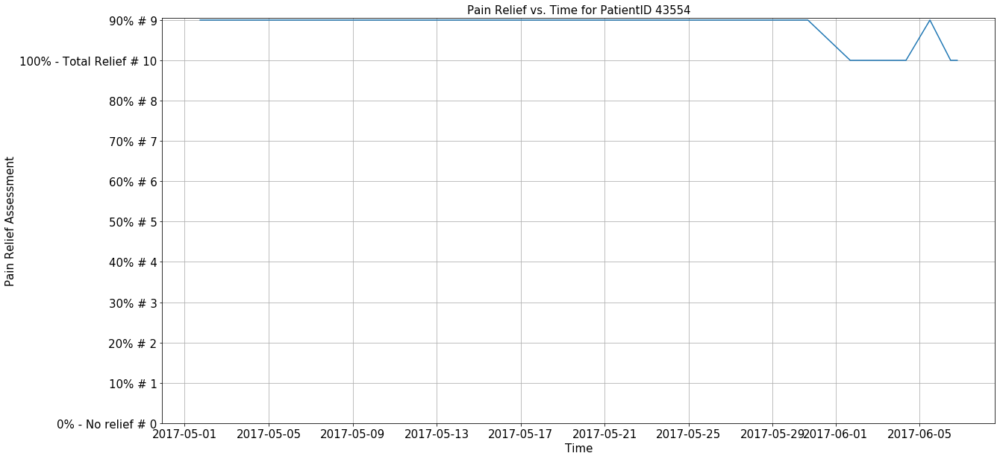

<Figure size 1440x720 with 0 Axes>

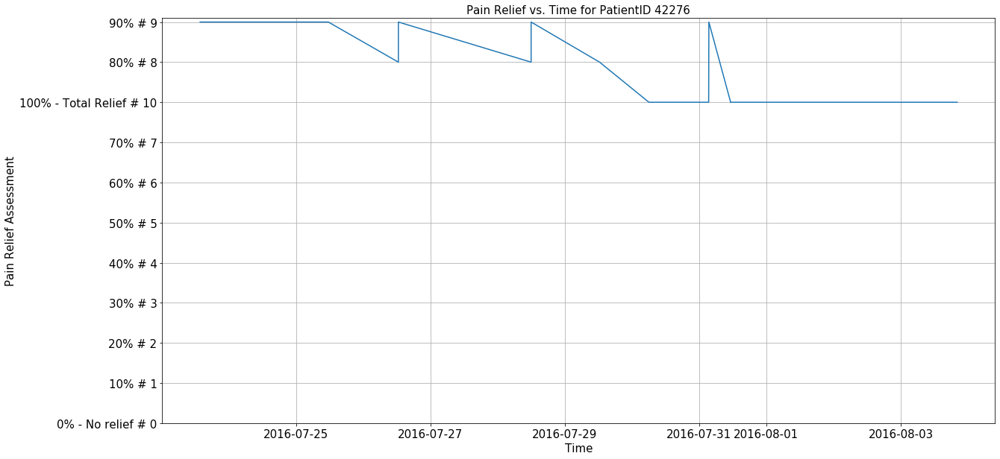

<Figure size 1440x720 with 0 Axes>

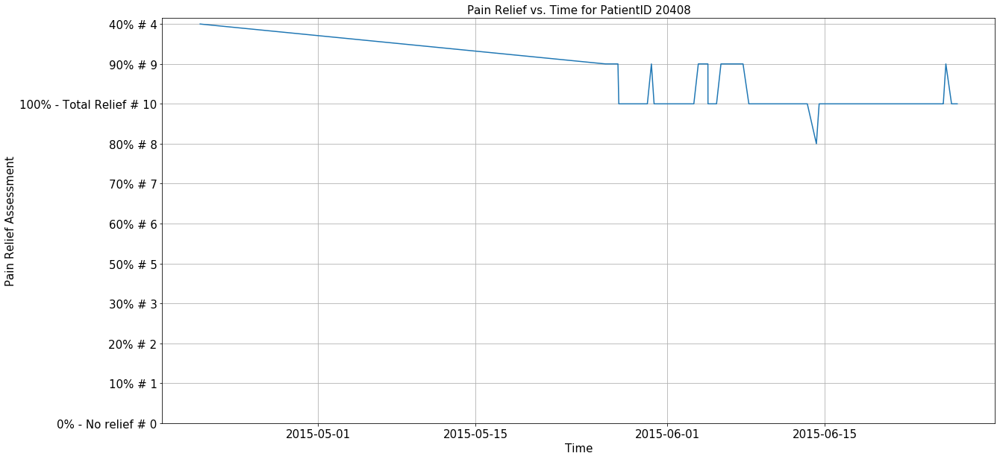

<Figure size 1440x720 with 0 Axes>

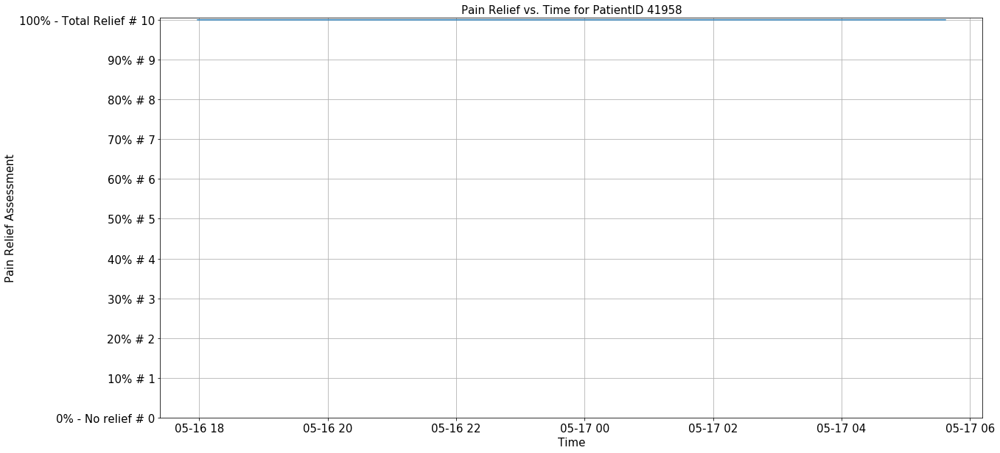

<Figure size 1440x720 with 0 Axes>

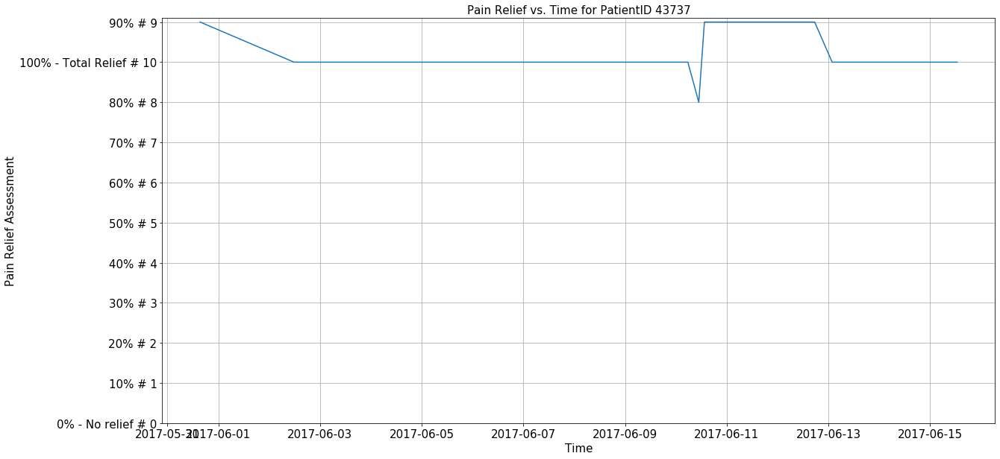

<Figure size 1440x720 with 0 Axes>

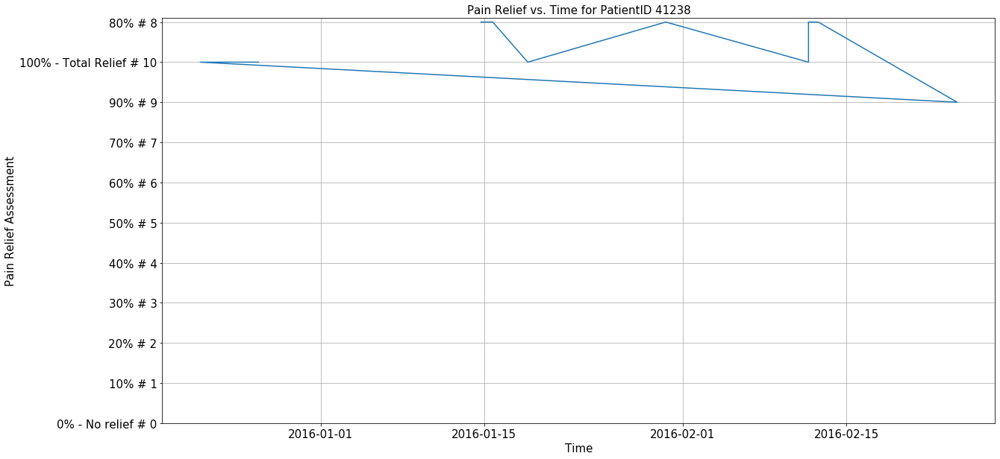

<Figure size 1440x720 with 0 Axes>

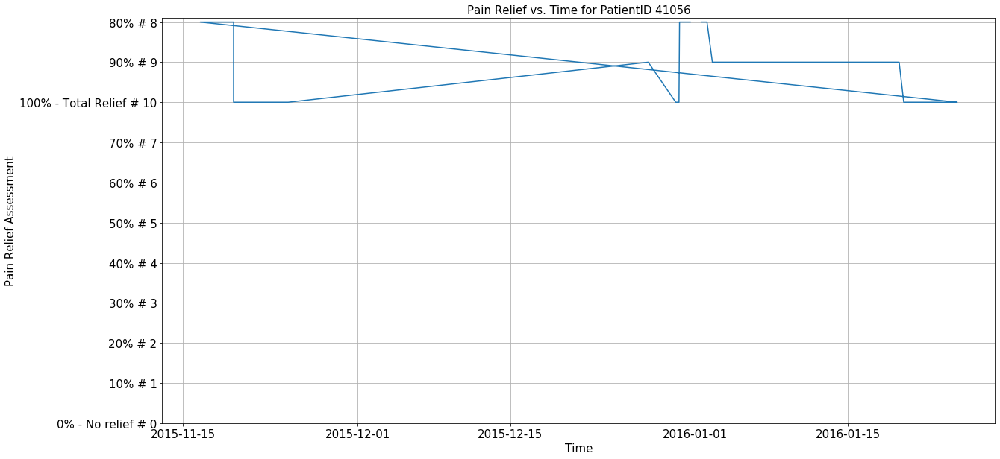

<Figure size 1440x720 with 0 Axes>

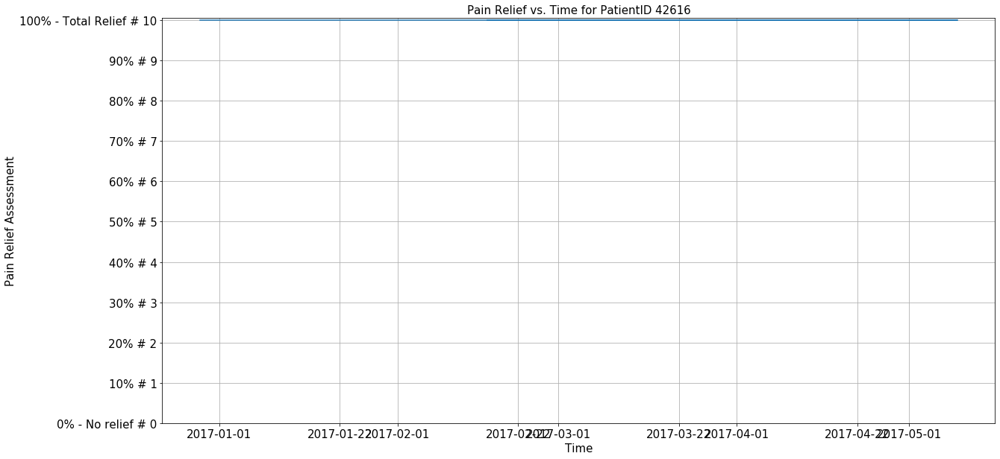

<Figure size 1440x720 with 0 Axes>

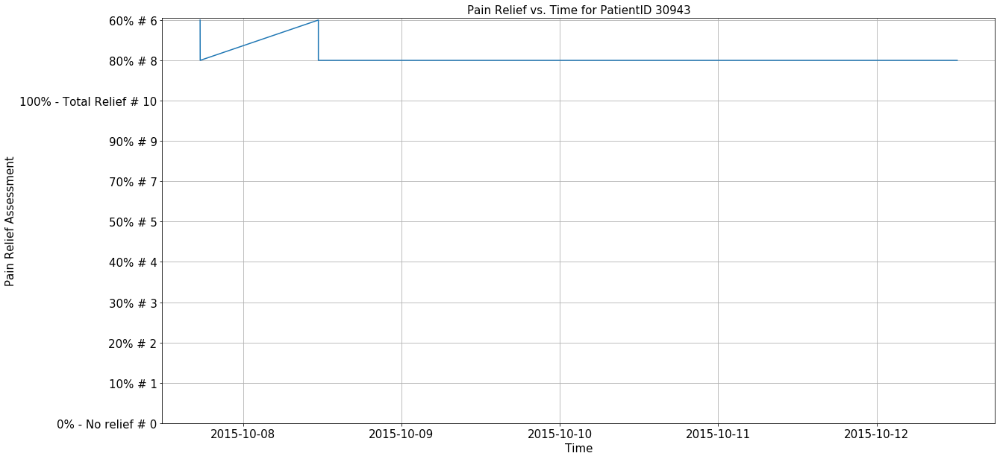

<Figure size 1440x720 with 0 Axes>

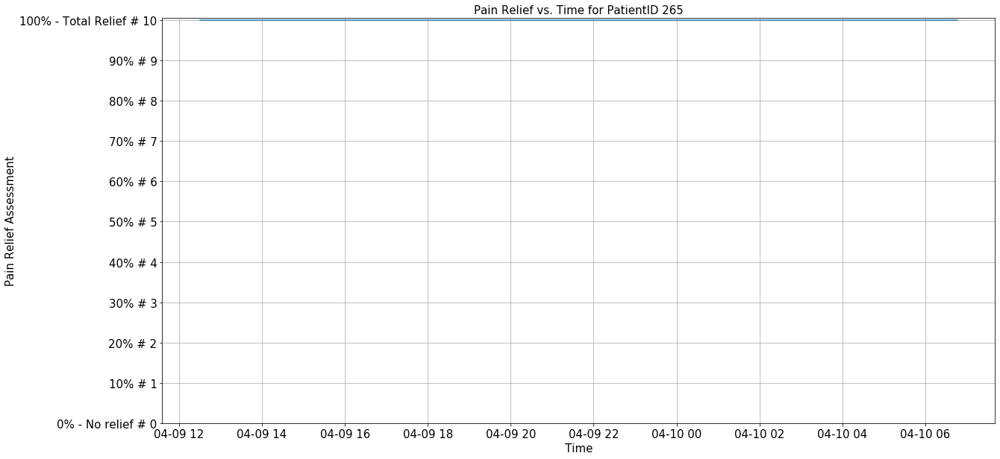

<Figure size 1440x720 with 0 Axes>

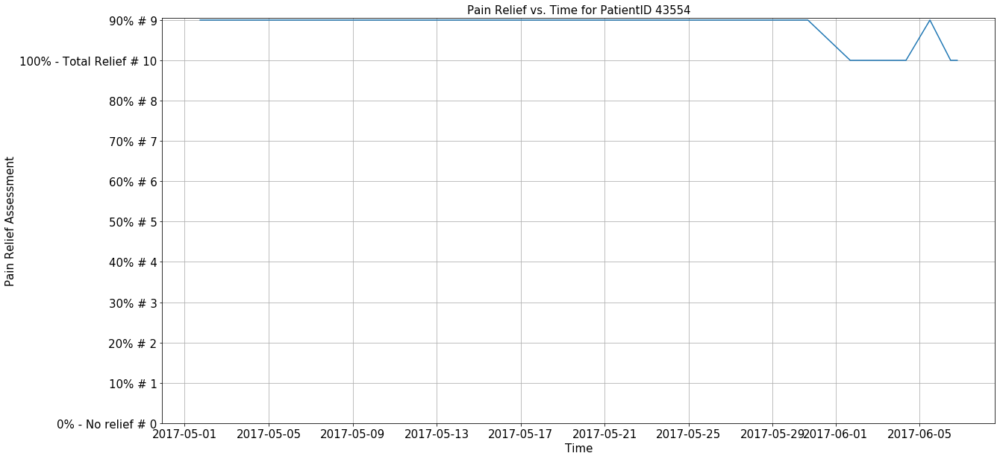

<Figure size 1440x720 with 0 Axes>

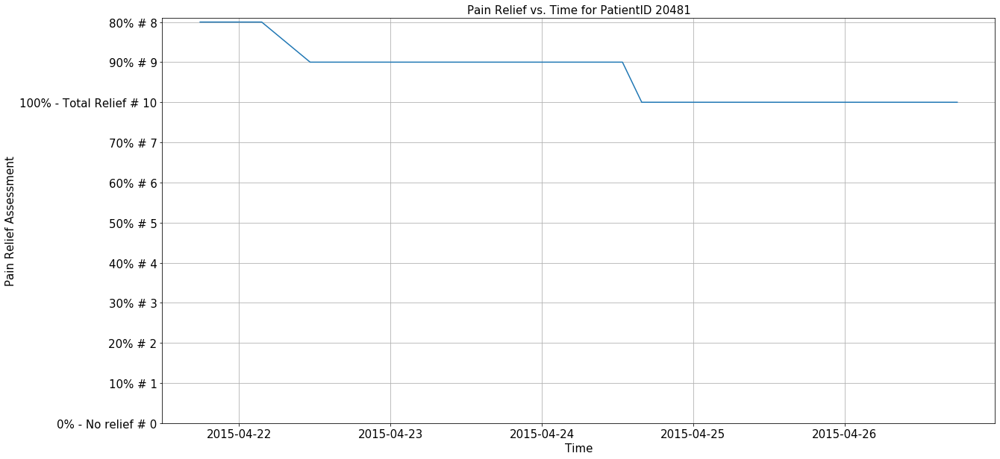

<Figure size 1440x720 with 0 Axes>

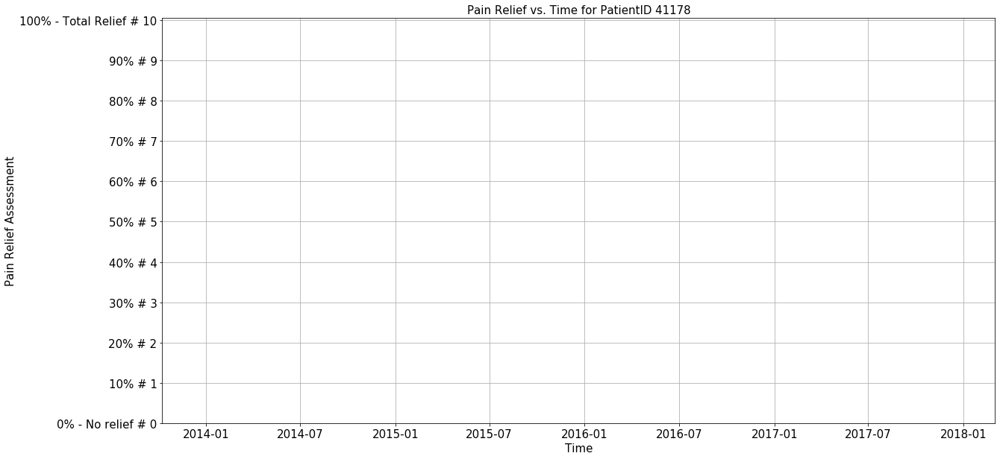

In [144]:
for pid in pid_arr:
    df1 = df_pain[df_pain['PatientID'] == pid]
    df1 = df1[['idehr', 'PatientID', 'timestamp_insert', 'Diagnosis', 'pain_relief']]
    df1['Day'] = df1['timestamp_insert'].dt.strftime('%D')
    df1['Hour'] = df1['timestamp_insert'].dt.strftime('%H')
    df1 = df1.dropna().sort_values(by=['Day', 'Hour'], ascending=[True, True]).reset_index(drop=True)
    if pd.isna(df1.pain_relief.any()) or df1.empty:
        continue
#     print(df1)
    ylabels = ['100% - Total Relief # 10', '90% # 9', '80% # 8', '70% # 7', '60% # 6',
           '50% # 5', '40% # 4', '30% # 3', '20% # 2', '10% # 1', '0% - No relief # 0']
    plt.rcParams['figure.figsize'] = [20, 10]
    matplotlib.rcParams.update({'font.size': 15})
    plt.figure()
    fig, ax = plt.subplots()
    timest = df1.timestamp_insert.values
    pain_val = df1.pain_relief.values
    plot1 = ax.plot(timest, pain_val)
    ax.set_ylabel('Pain Relief Assessment', fontsize=15)
    ax.set_xlabel('Time', fontsize=15)
    ax.set_title('Pain Relief vs. Time for PatientID ' + str(pid), fontsize=15)
    ax.set_yticks(ylabels)
    plt.grid()
    # reverse y_ticks
    ax = plt.gca()
    ax.set_ylim(ax.get_ylim()[::-1])
    plt.show()